In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/res.mat',
                 'need_normalize': True,
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'network_params': {'dtype': 'torch.float',
                    'hidden_size': 8,
                    'input_size': 64,
                    'num_layers': 1,
                    'output_dim': 3,
                    'per_element': True,
                    'retrospective_steps': 64},
 'to_generate_data': False,
 'train_params': {'auto_loss': True,
                  'aux_loss': {'part_of_max_for_const': 0.15,
                               'scaling_order': 7,
                               'steady_state_threshold': 0.001},
                  'batch_size': 256,
                  'core_loss': {'part_of_max_for_co

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-05_14:37:18.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=2,
             output_dim=1,
             num_layers=p_net['num_layers'])

loss_fn = myLoss_jordan

# if p_train['loss_fn'] == 'mse':  
#     loss_fn = torch.nn.MSELoss(reduction=p_train['reduction'])
# elif p_train['loss_fn'] == 'l1':  
#     loss_fn = torch.nn.L1Loss(reduction=p_train['reduction'])

p_optim = p_train['optimizer']
wd = p_optim['weight_decay']
lr = p_optim['learning_rate']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [427.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 2])
lstm.weight_ih_l0 		 torch.Size([32, 3])
lstm.weight_hh_l0 		 torch.Size([32, 8])
lstm.bias_ih_l0 		 torch.Size([32])
lstm.bias_hh_l0 		 torch.Size([32])
linear.weight 		 torch.Size([1, 8])
linear.bias 		 torch.Size([1])


In [6]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [7]:
sample_x.shape


torch.Size([64, 256, 1])

In [8]:
# a = torch.cat((sample_x, sample_x, sample_x), dim=2)
# a.shape

In [9]:
# y.shape

using 1.0 of data
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


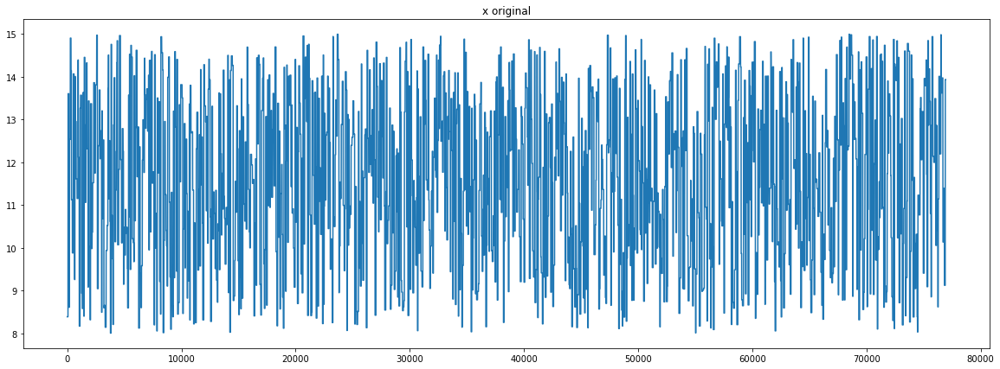

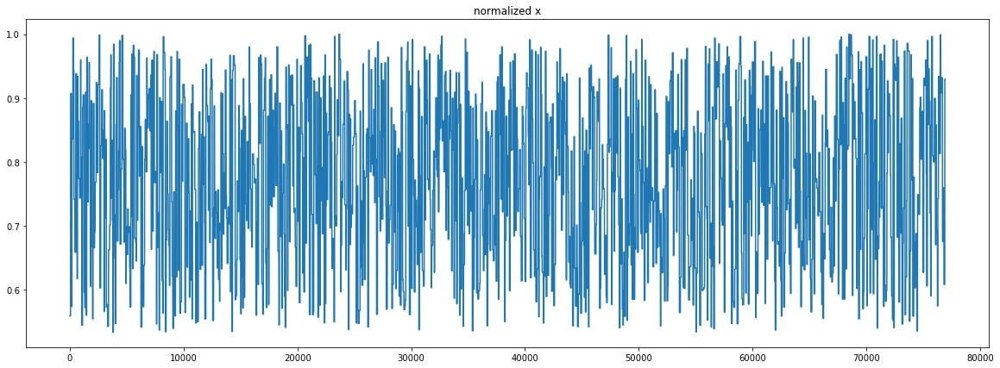

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23015, 1)
Y_tensor torch.Size([23015, 1])
X_tensor torch.Size([64, 23013, 1])
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


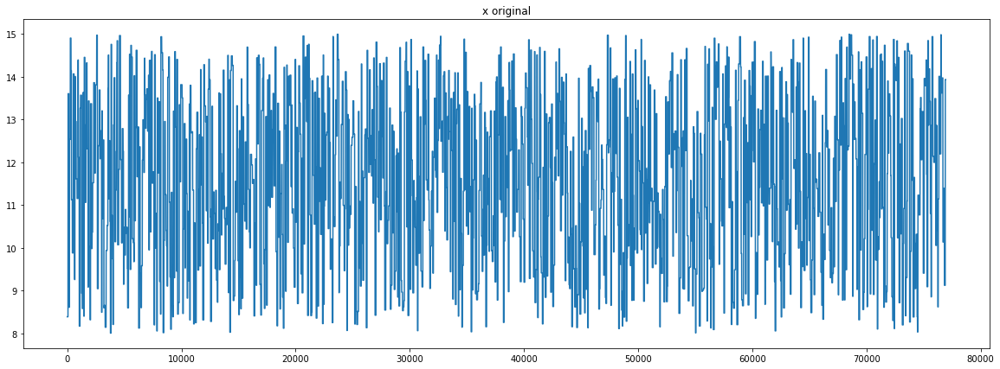

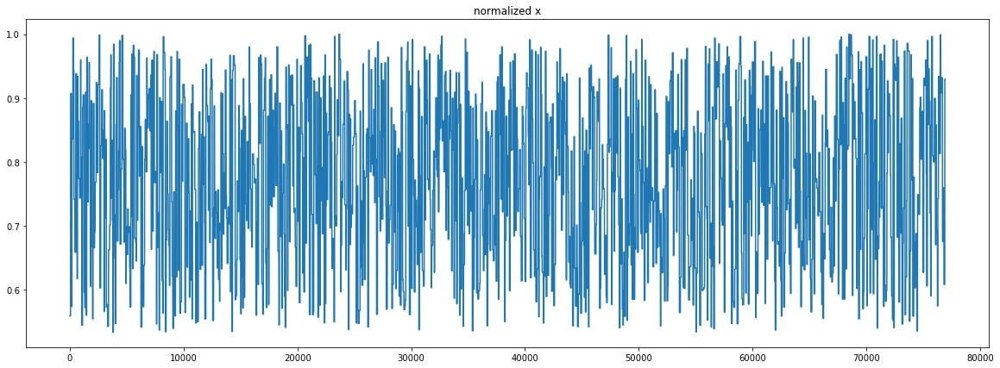

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53783, 1)
Y_tensor torch.Size([53783, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53783] batches
test set: [23015] batches
data_loading time 26.389063119888306 secs


In [10]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([256, 64, 1])
y [batch_size, channels]: torch.Size([256, 1])
y_last [slice_size]: (150,)


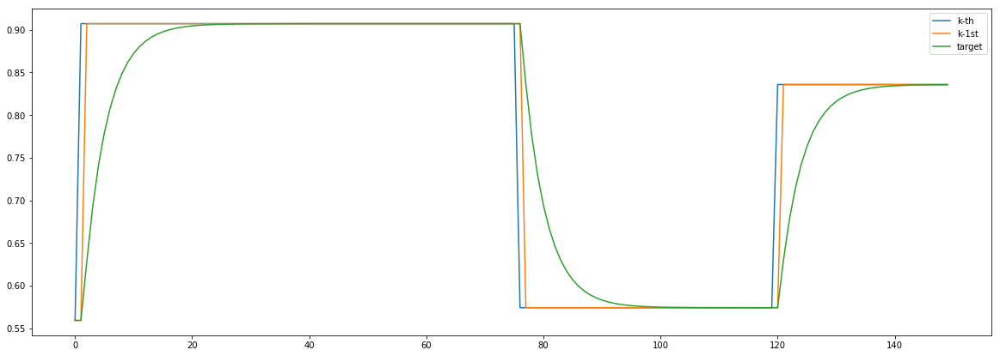

x [batch_size, retrospective_steps, channels] :torch.Size([256, 64, 1])
y [batch_size, channels]: torch.Size([256, 1])
y_last [slice_size]: (150,)


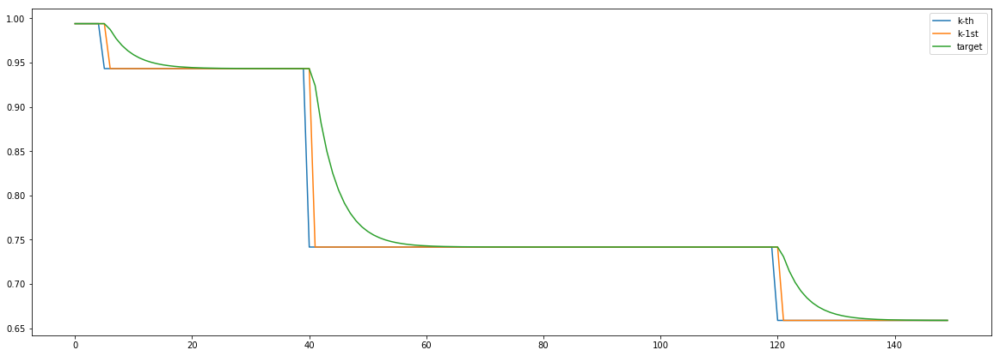

In [11]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [12]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [13]:
logging.info("History INITIALIZED")

hist = {
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "const":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),            
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)), "p2":np.zeros(len(train_dl))},
        'epochs':{"p1":np.zeros(num_epochs), "p2":np.zeros(num_epochs)}
    },
}

In [14]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()

    y_pred, jordan = model(x_batch)
    losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config)
    main_loss, aux_loss = losses
    aux_loss *= 10*p_train['aux_loss']['scaling_order']
#     main_loss -= main_loss
    losses = [main_loss , aux_loss]
#         print(f"losses before scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
    
    
    
    if backprop:
        
        if iter_index == 0:
            plot_shared_scale([
        (y_pred[:, 0].detach().numpy(),"Preds" ),
         (y_batch[:, 0].detach().numpy(), "Data"),
         (x_batch[-1].detach().numpy(), "Input")
        ],
        title="VANILLA PREDICT")
            plot_multiscale([
        (y_pred[:, 0].detach().numpy(),"Black" ),
         (y_batch[:, 0].detach().numpy(), "Green"),
         (x_batch[-1].detach().numpy(), "Blue")
        ],
        title="VANILLA PREDICT")
            
        combined_loss = sum(losses)

        optimizer.zero_grad()

        combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum()
            hist['weights']['batches'][name][iter_index] = parameter.sum()
            hist['vars']['batches'][name][iter_index] = parameter.var()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0]
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1]
        
        optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    
    return y_pred, jordan

In [15]:
model.jordan[0][0]

tensor(0., grad_fn=<SelectBackward>)

In [16]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    return mean_main, mean_aux

In [17]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

In [18]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                            min_lr=10**p_sched['early_stop_order'],
                             verbose=True)
print("LR scheduler set_uped")
scheduler

LR scheduler set_uped


## Train model

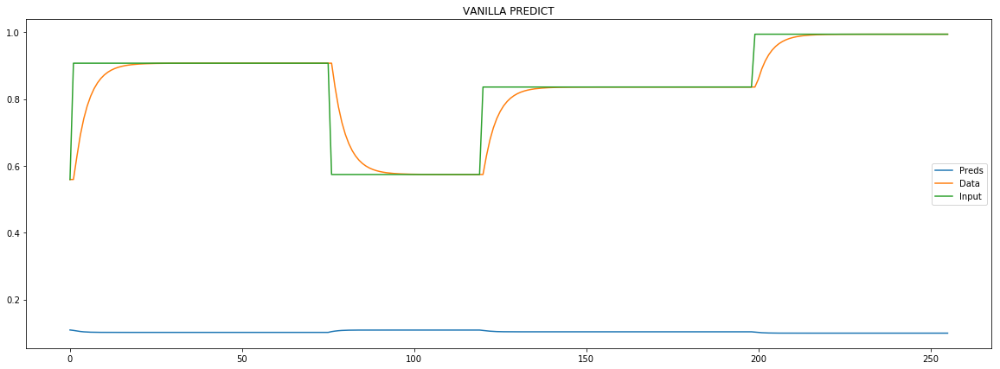

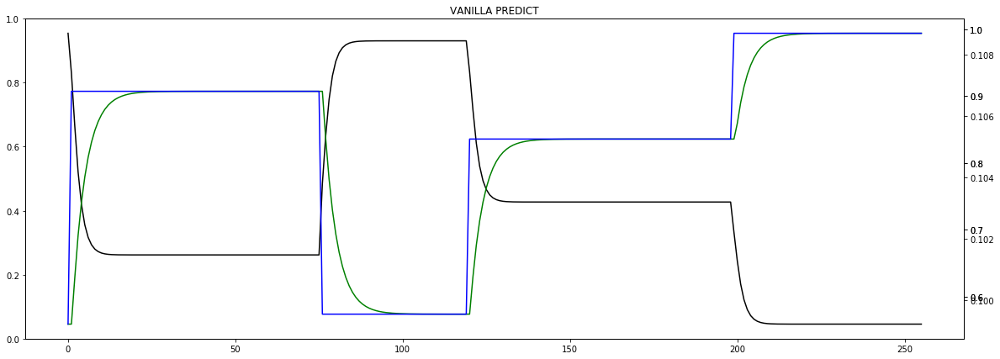


aux preds: 0.07639516890048981 -0.008835796266794205
main loss 298.0912209689617
aux loss 3.5026850354103813
combined loss 301.59390600437206 


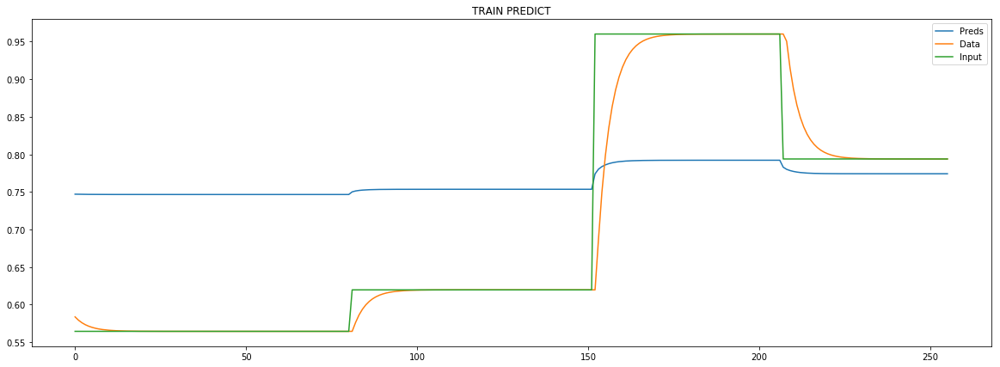

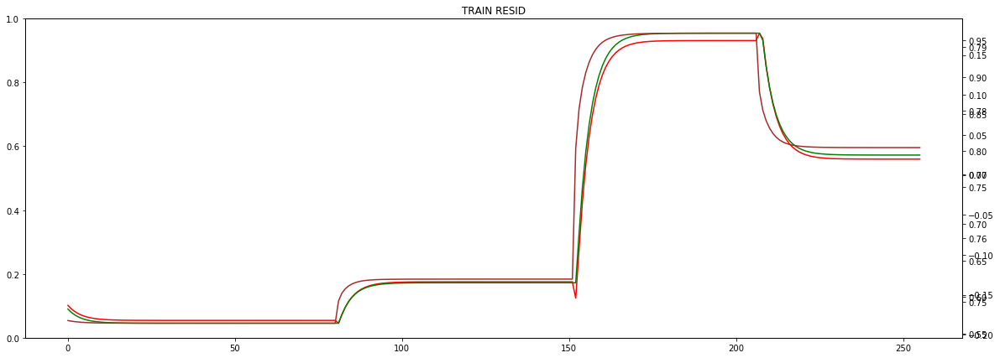


Parameter containing:
tensor([[ 0.0764, -0.0088]], requires_grad=True)


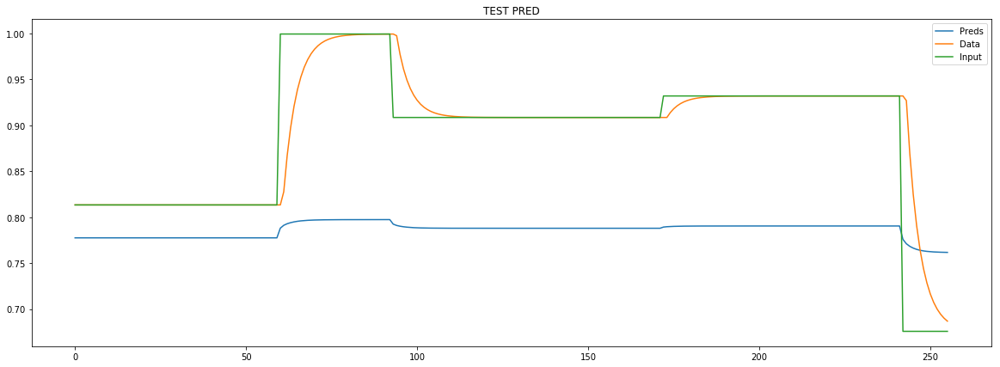

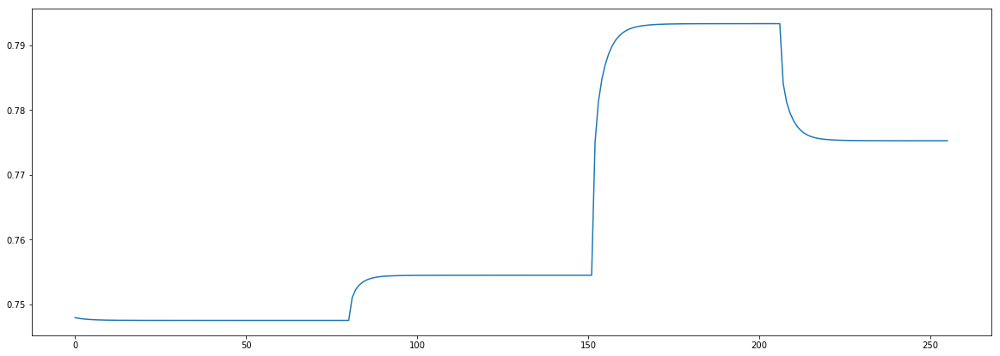

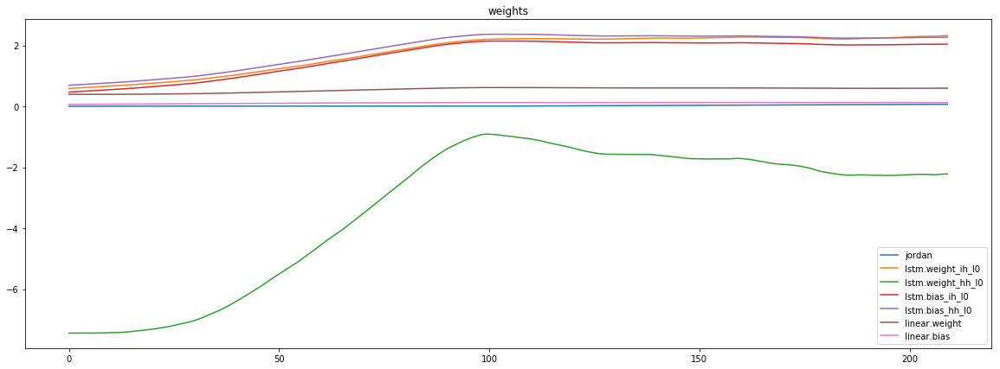

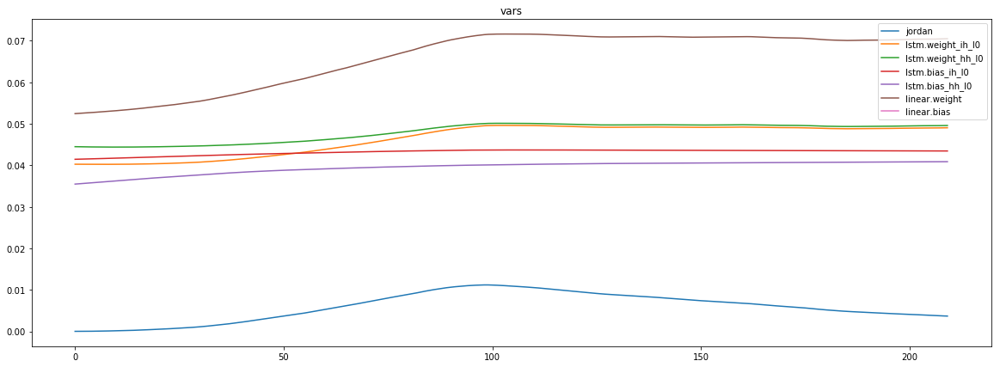

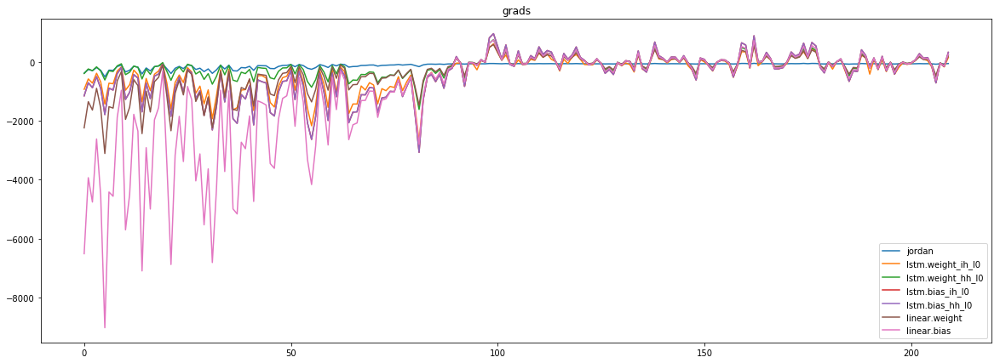

mean_p1 : -118.41808489206291
mean_p2 : 0.20007015409923734


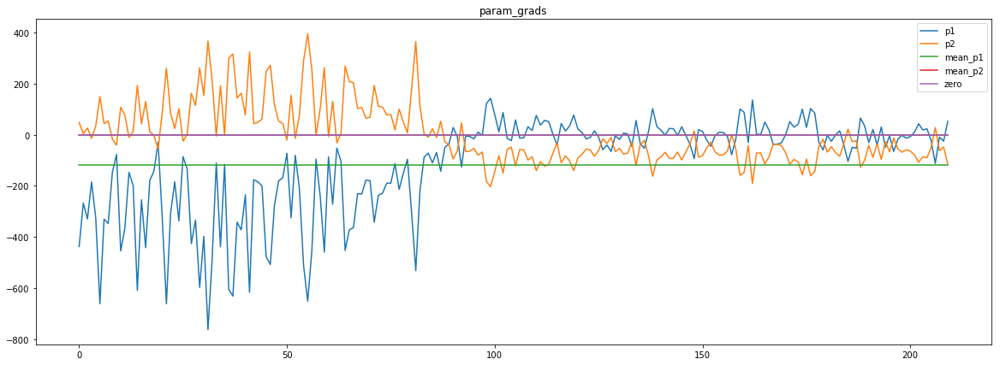

Epoch [0] 
     train_loss[301.59390600437206] 
     eval_train[38.3830152065981] 
     eval_test[44.94225619515676]


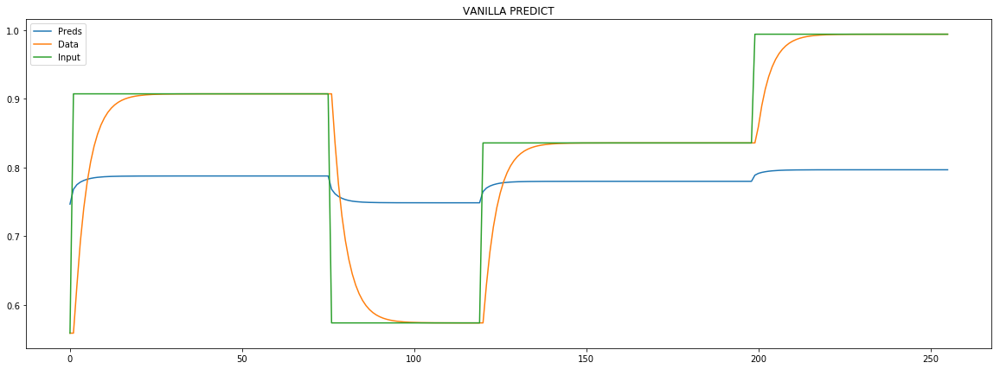

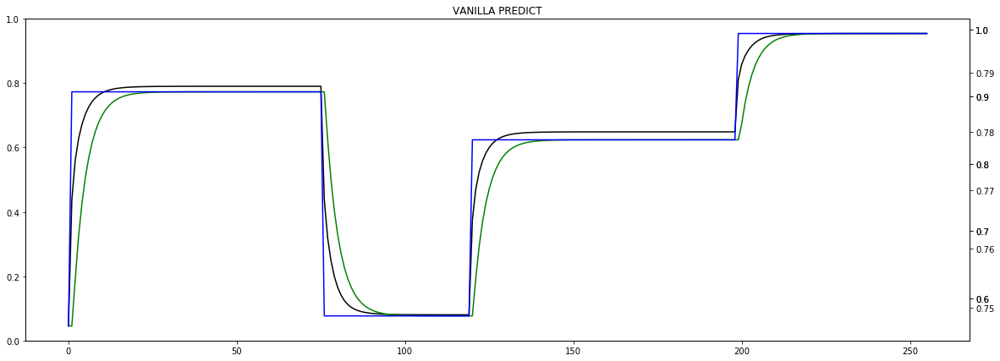


aux preds: 0.21675755083560944 0.07317446172237396
main loss 35.326952406905946
aux loss 23.940924673953226
combined loss 59.26787708085917 


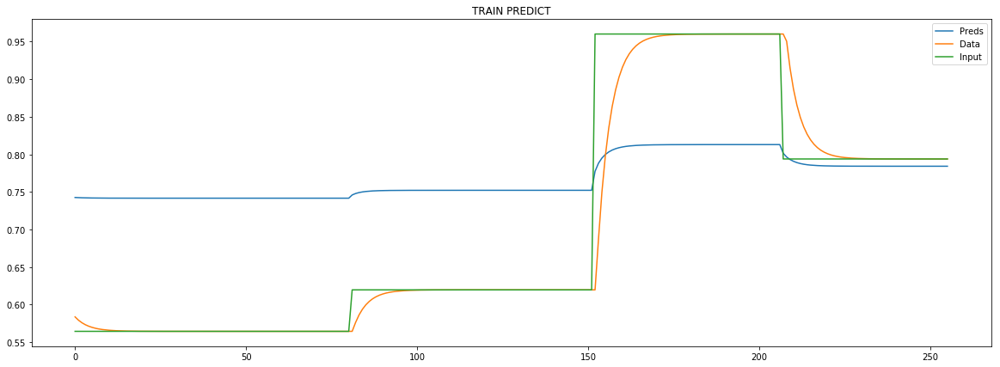

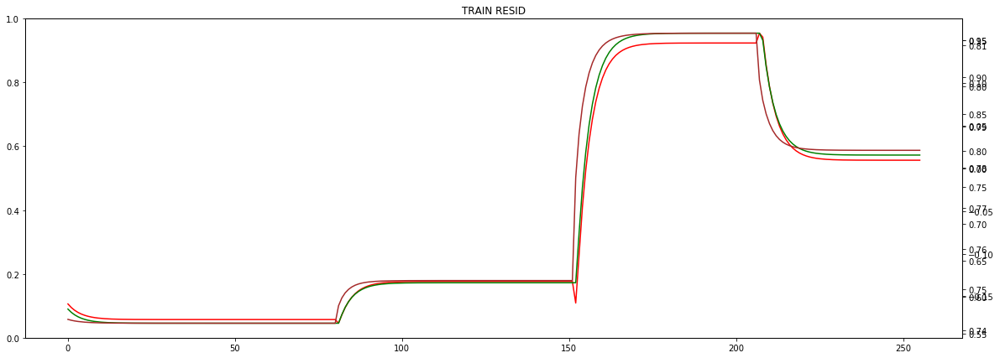


Parameter containing:
tensor([[0.2168, 0.0732]], requires_grad=True)


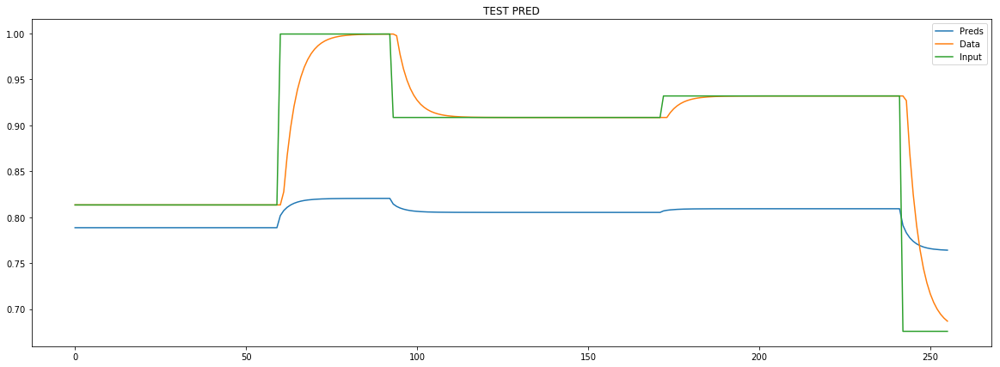

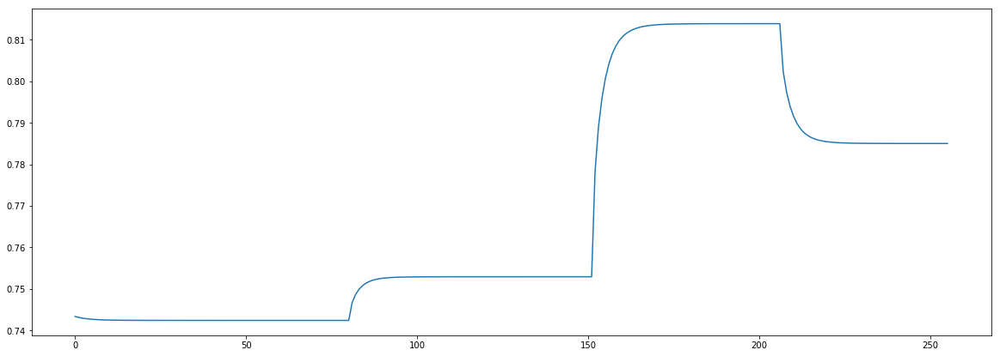

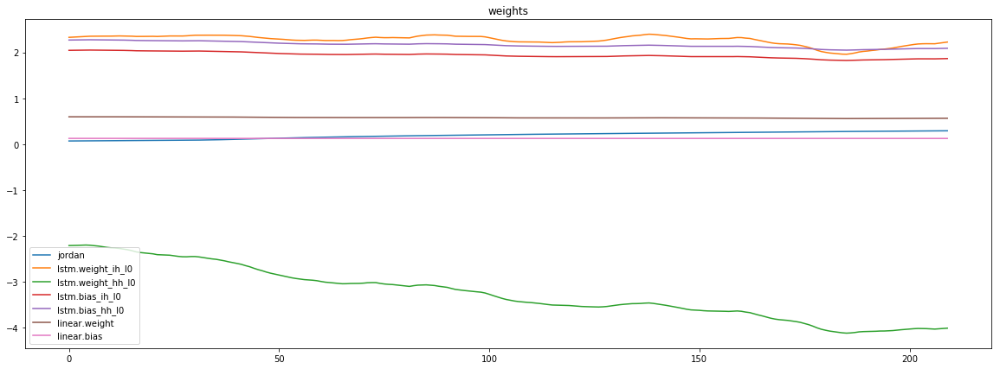

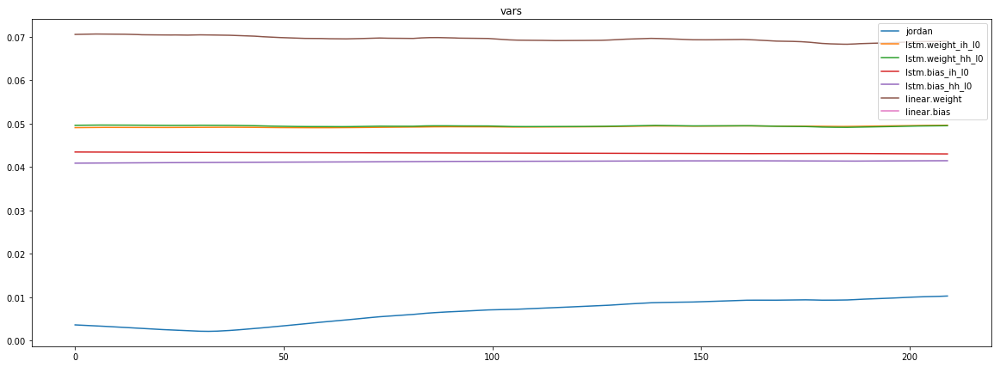

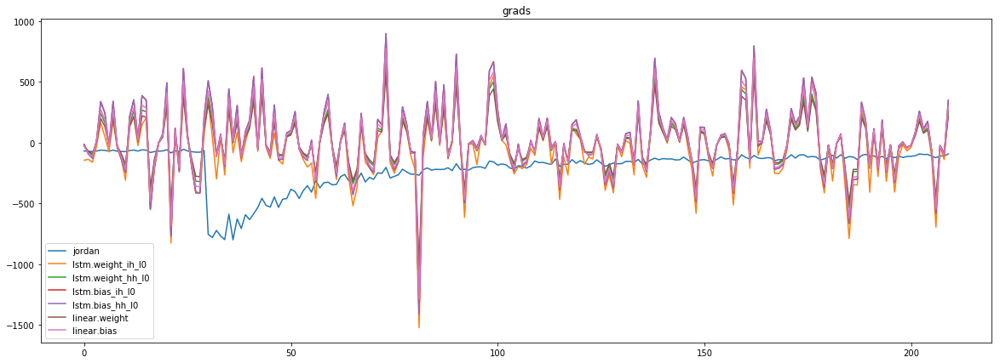

mean_p1 : -167.5191584501238
mean_p2 : -38.623276210966566


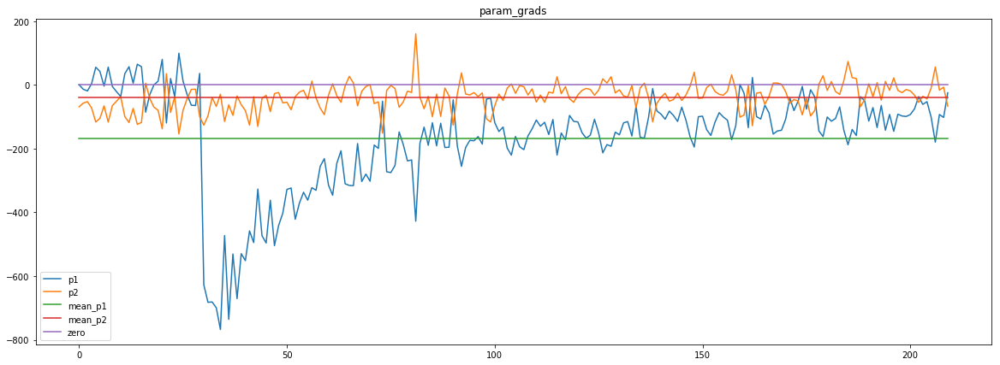

Epoch [1] 
     train_loss[59.26787708085917] 
     eval_train[52.28861354177906] 
     eval_test[57.76420247286893]


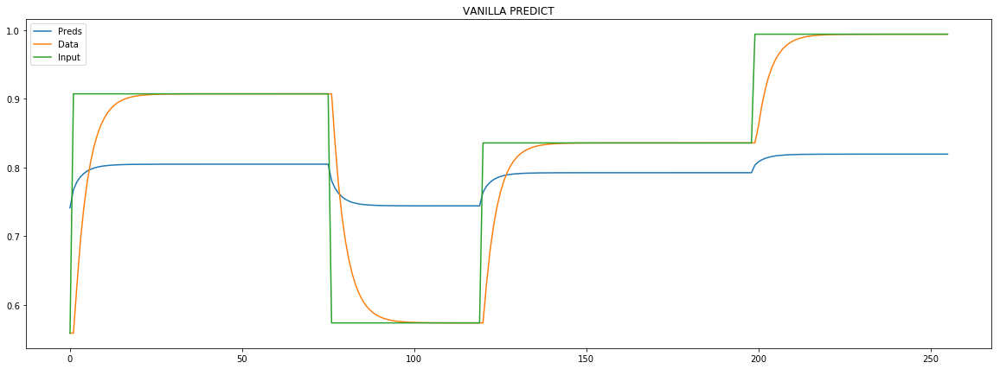

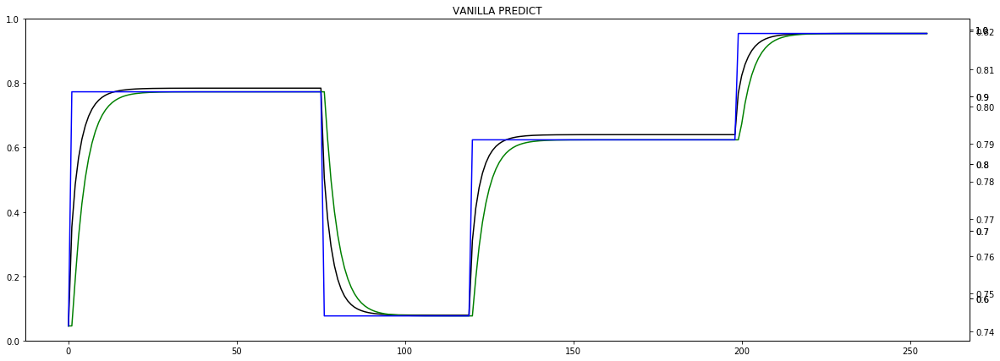


aux preds: 0.2815714478492737 0.13089263439178467
main loss 30.93240232794058
aux loss 16.024597840082077
combined loss 46.95700016802266 


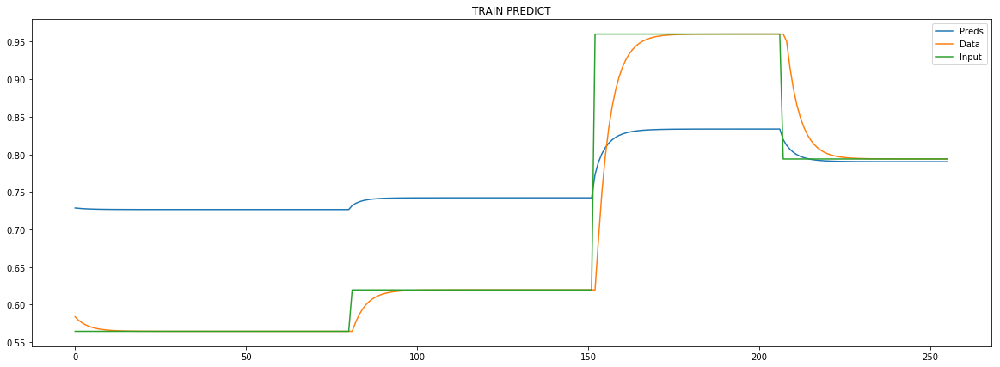

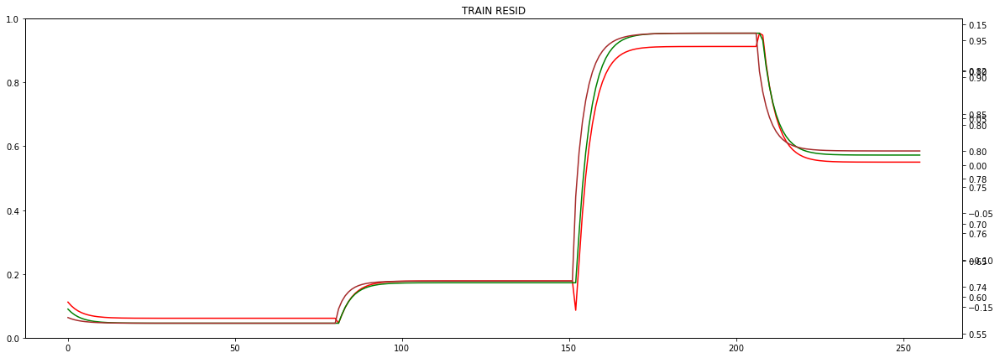


Parameter containing:
tensor([[0.2816, 0.1309]], requires_grad=True)


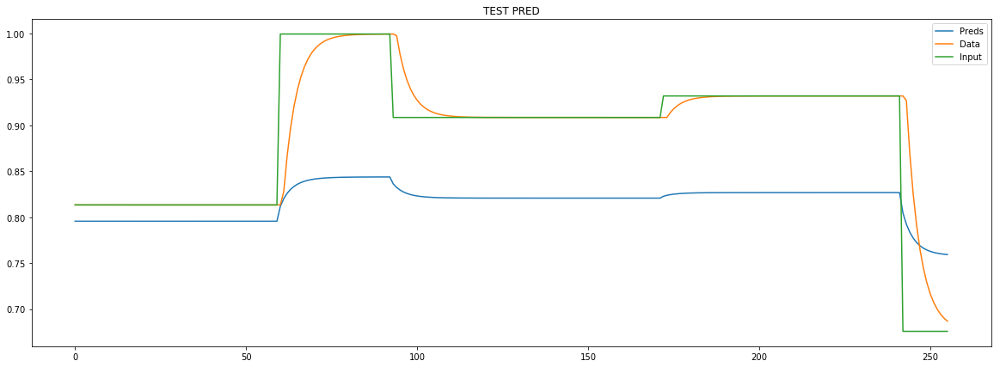

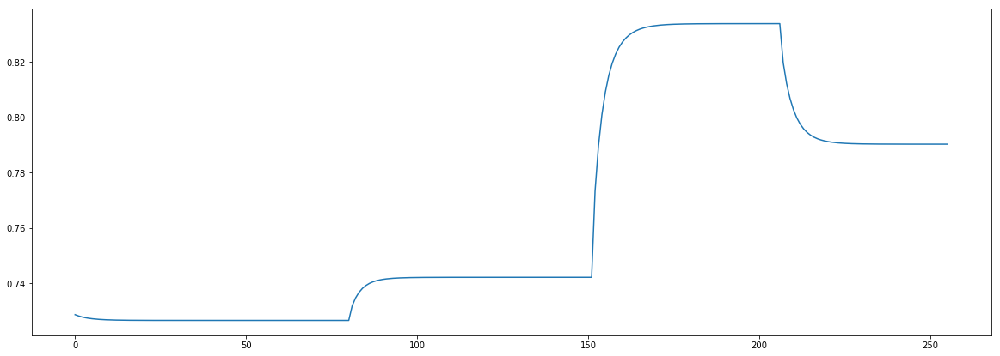

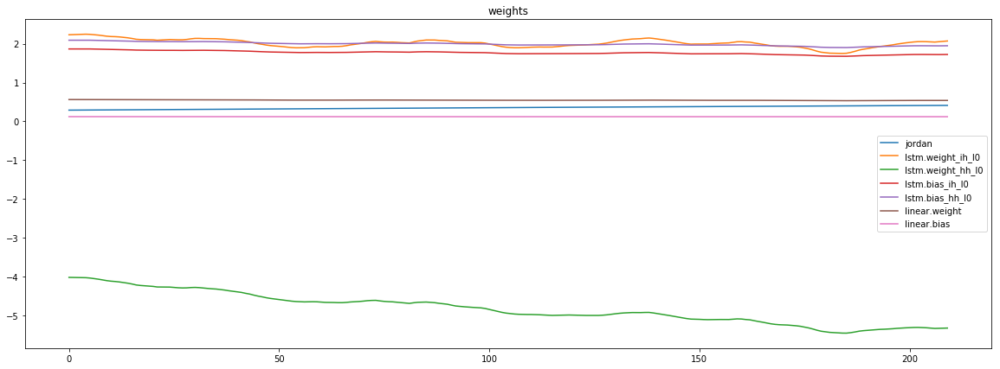

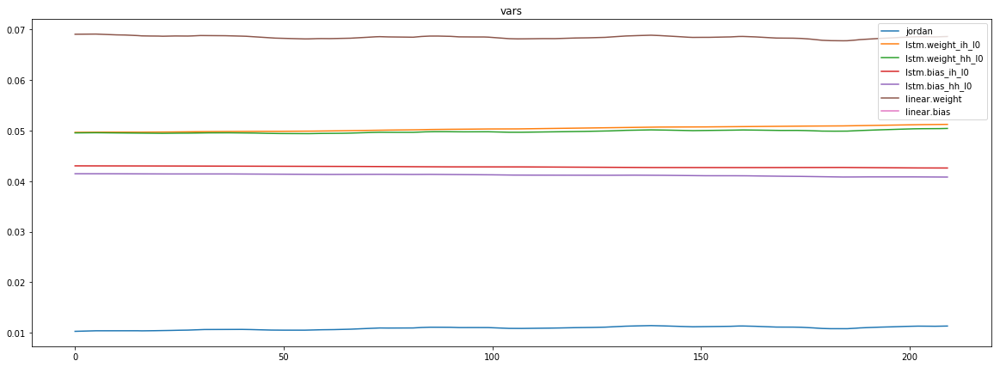

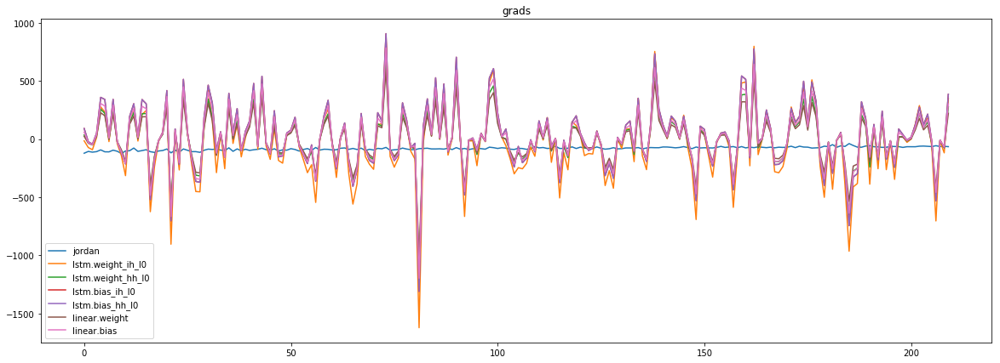

mean_p1 : -59.32118550255185
mean_p2 : -22.10529467264811


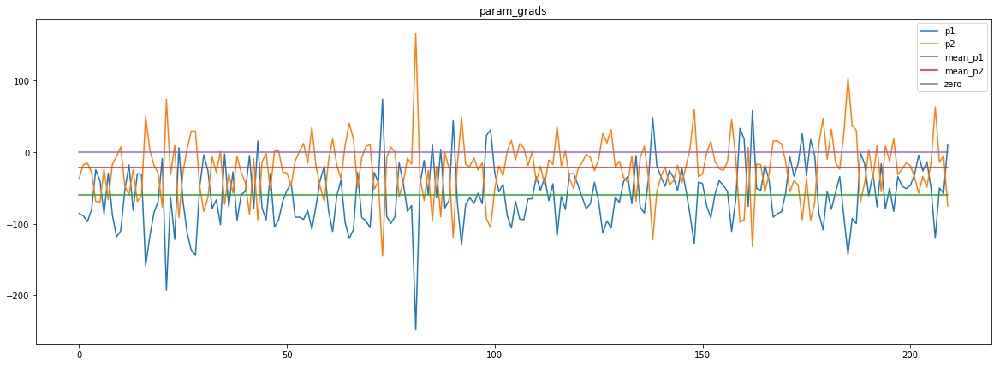

Epoch [2] 
     train_loss[46.95700016802266] 
     eval_train[41.742721785108245] 
     eval_test[46.124181406551536]


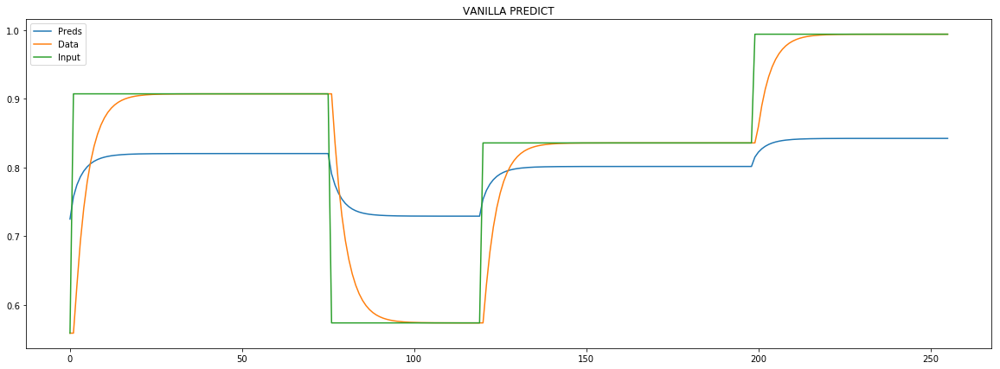

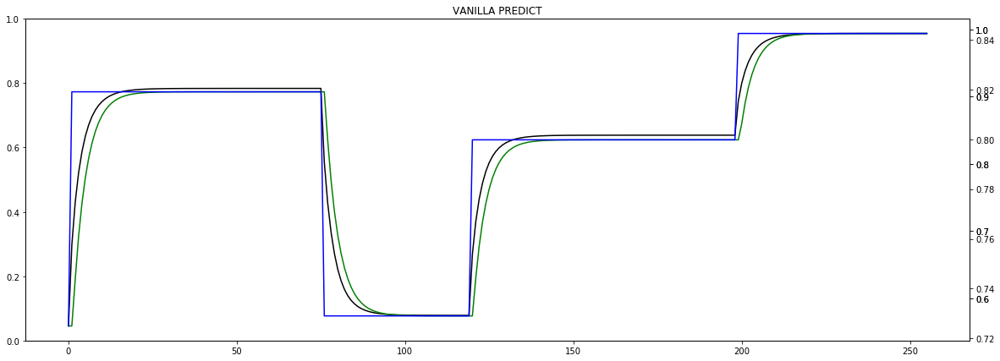


aux preds: 0.32876864075660706 0.19231060147285461
main loss 22.678690232549396
aux loss 12.243321495964414
combined loss 34.92201172851381 


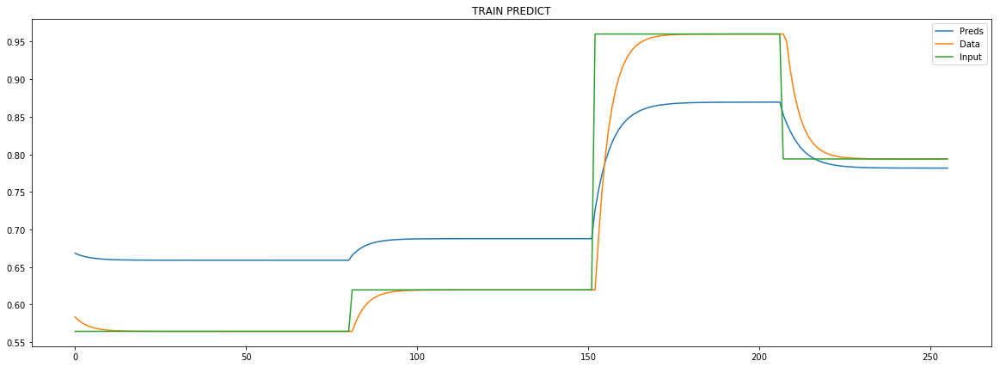

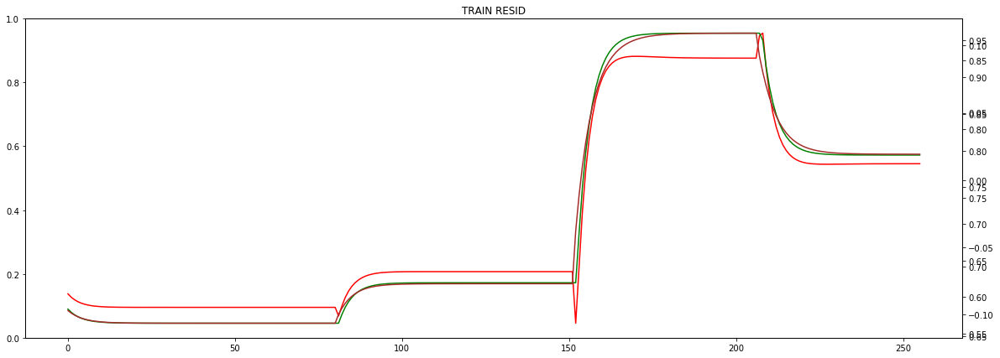


Parameter containing:
tensor([[0.3288, 0.1923]], requires_grad=True)


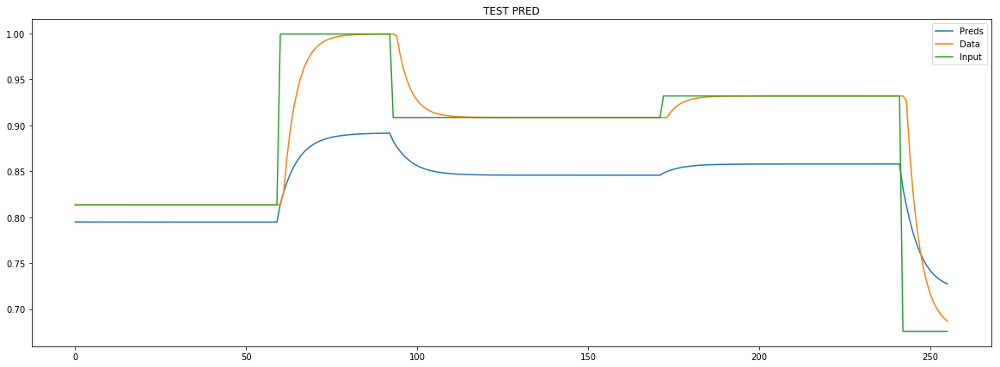

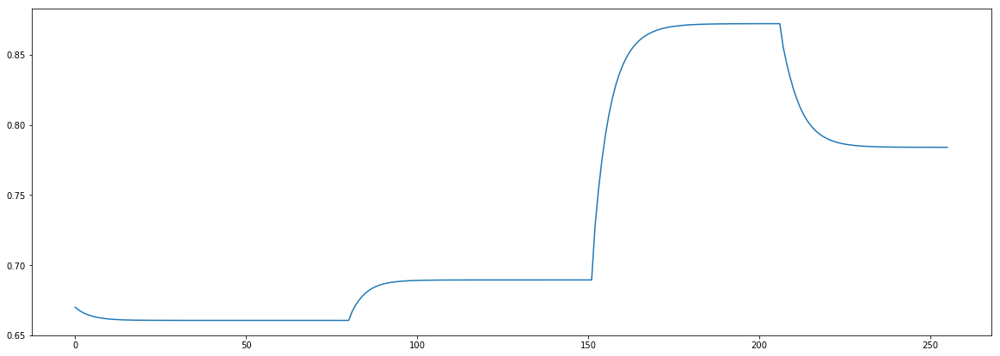

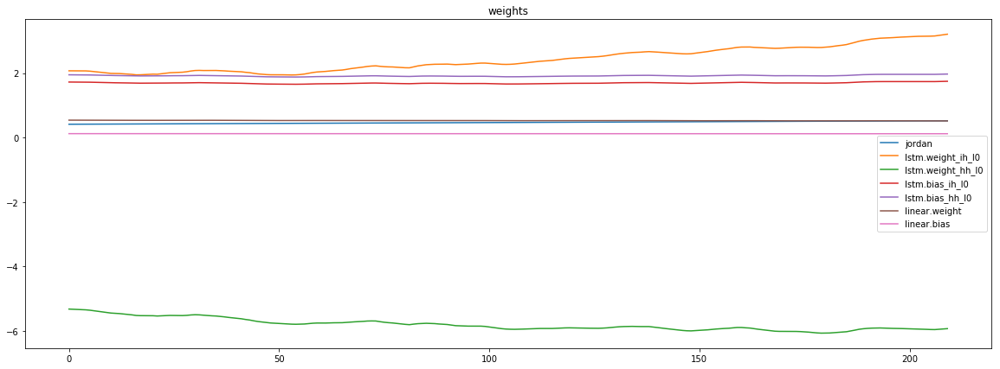

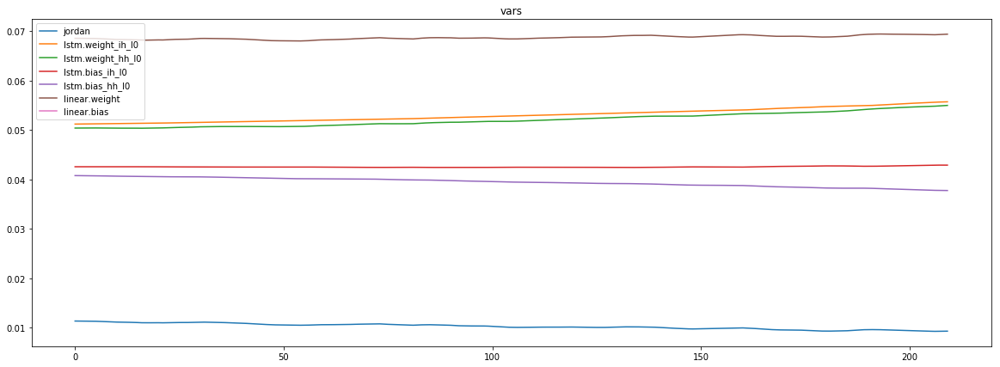

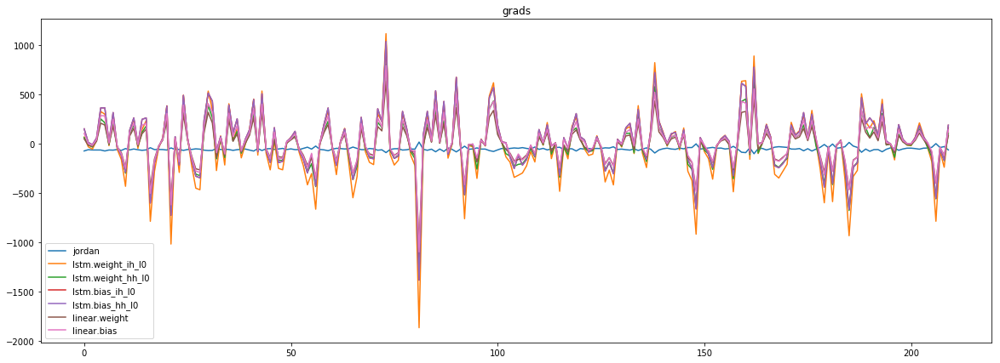

mean_p1 : -35.80190919240316
mean_p2 : -20.31976560183934


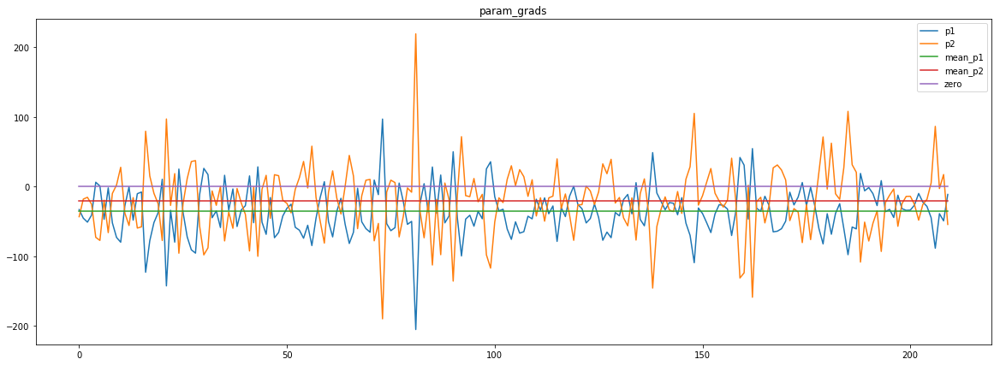

Epoch [3] 
     train_loss[34.92201172851381] 
     eval_train[24.079561072375093] 
     eval_test[26.21400597942679]


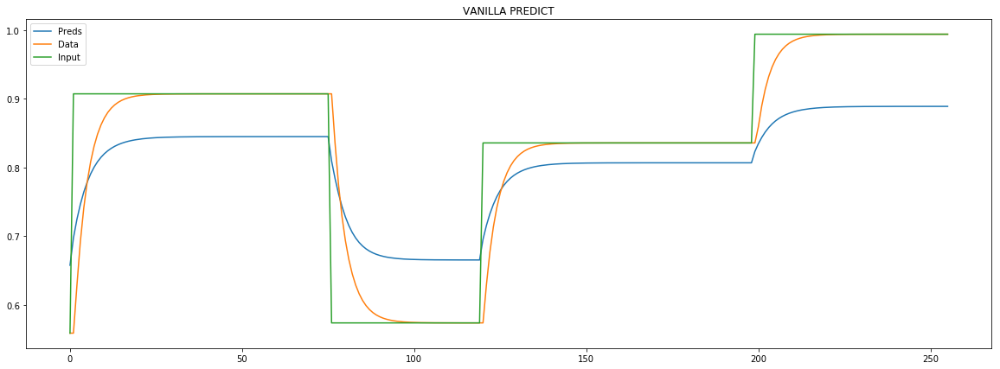

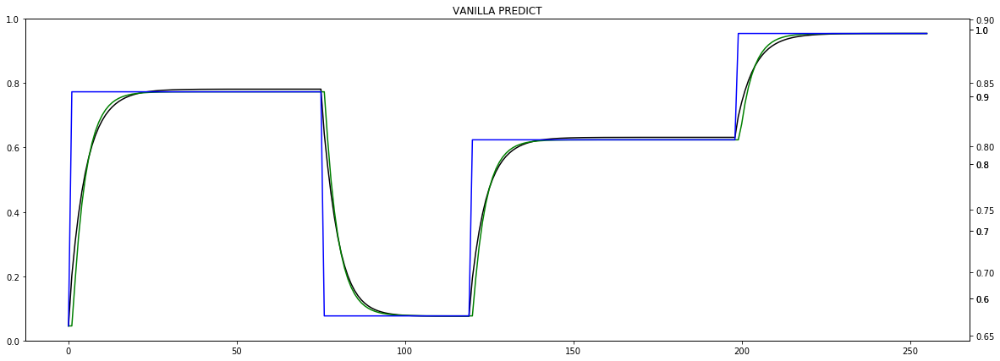


aux preds: 0.37273186445236206 0.24506834149360657
main loss 3.917635189984659
aux loss 9.896192573365711
combined loss 13.813827763350371 


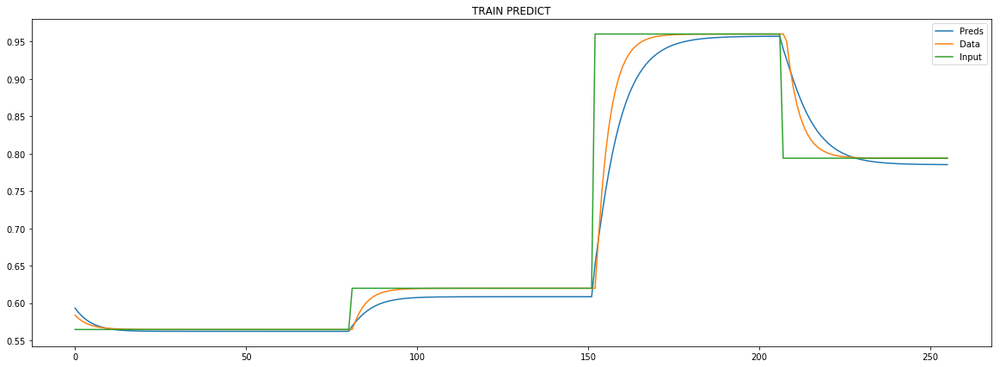

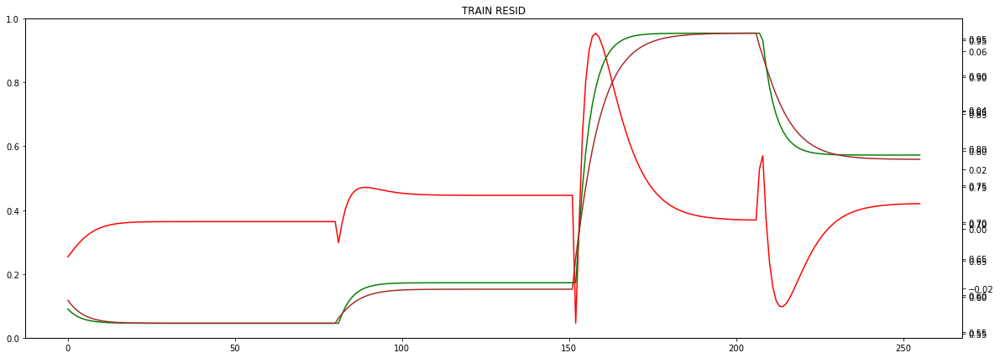


Parameter containing:
tensor([[0.3727, 0.2451]], requires_grad=True)


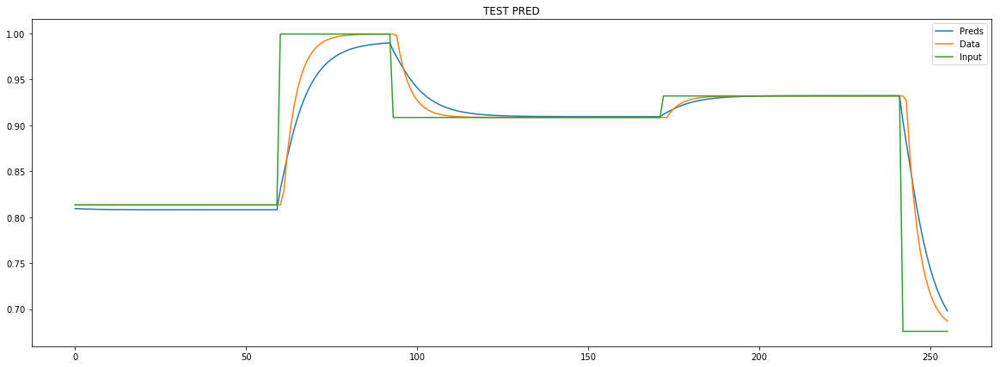

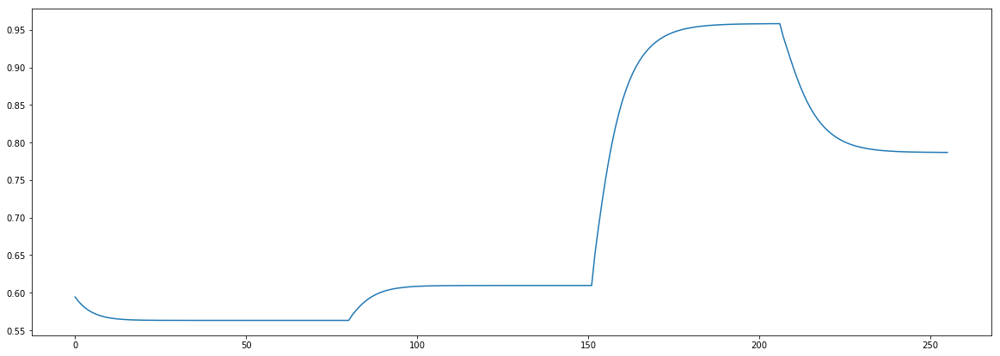

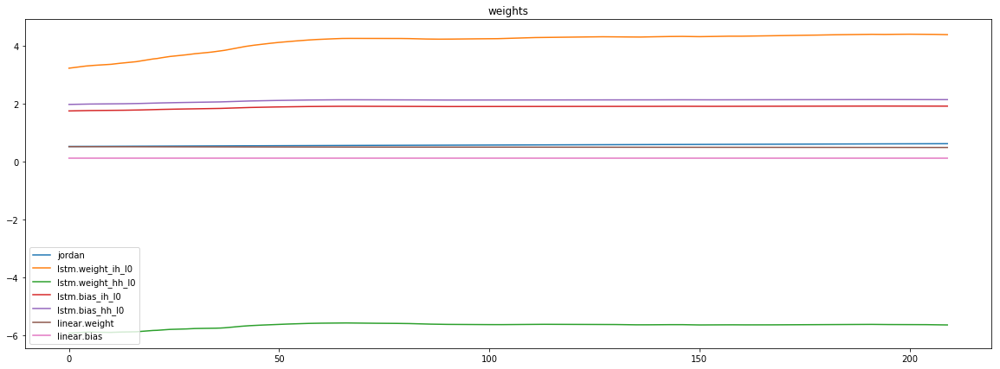

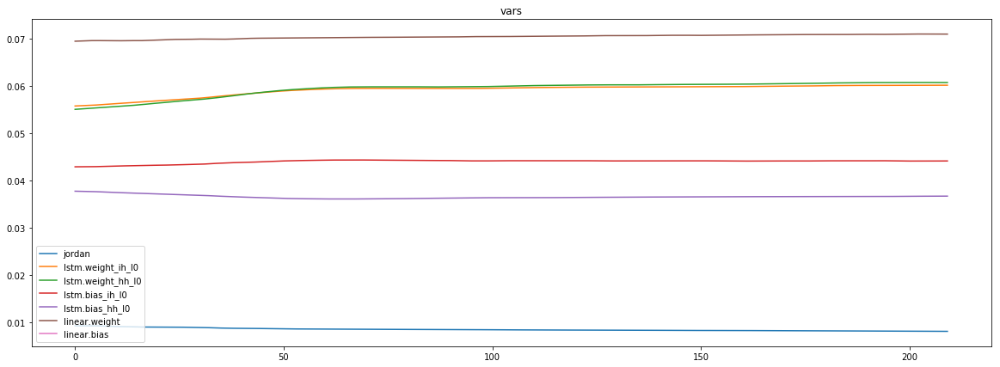

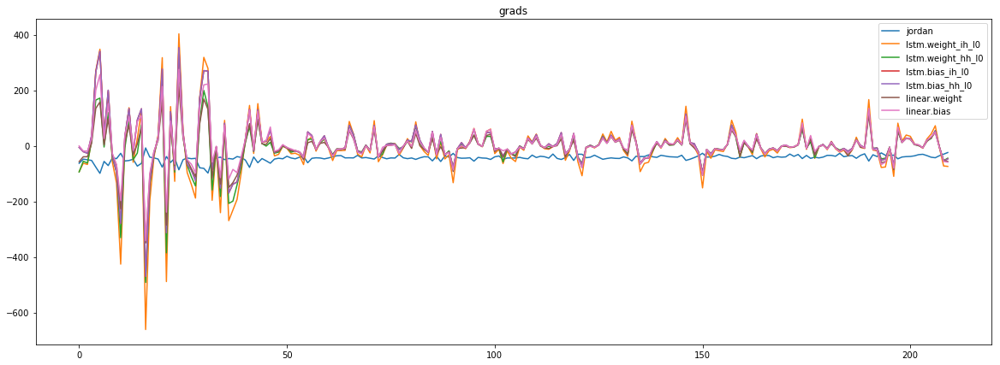

mean_p1 : -27.960762773241317
mean_p2 : -15.800233863648915


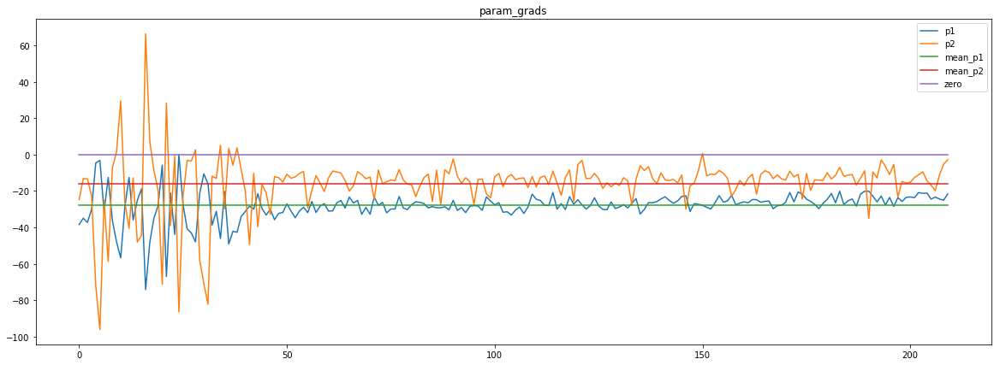

loss rate [0.7486053624307447]
Epoch [4] 
     train_loss[13.813827763350371] 
     eval_train[10.702473102390234] 
     eval_test[10.90234771515295]


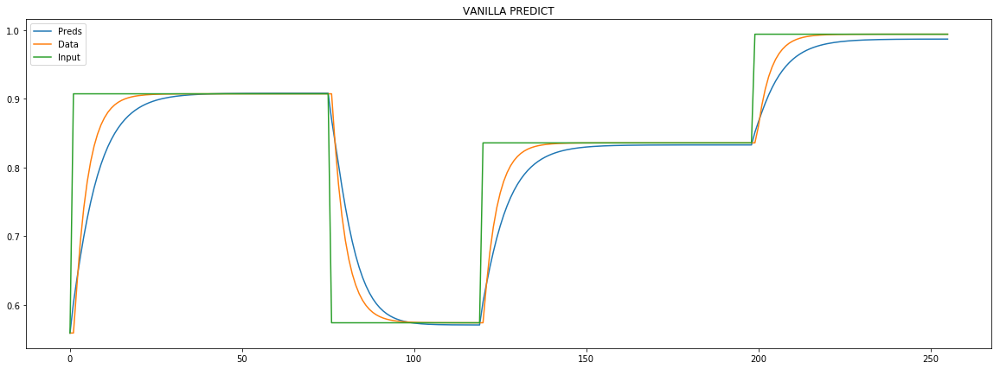

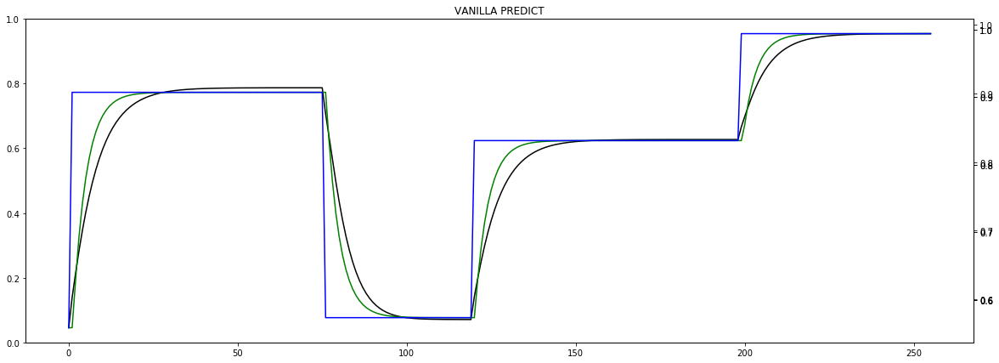


aux preds: 0.411458283662796 0.29289084672927856
main loss 1.4047240817778013
aux loss 8.299971337545486
combined loss 9.704695419323286 


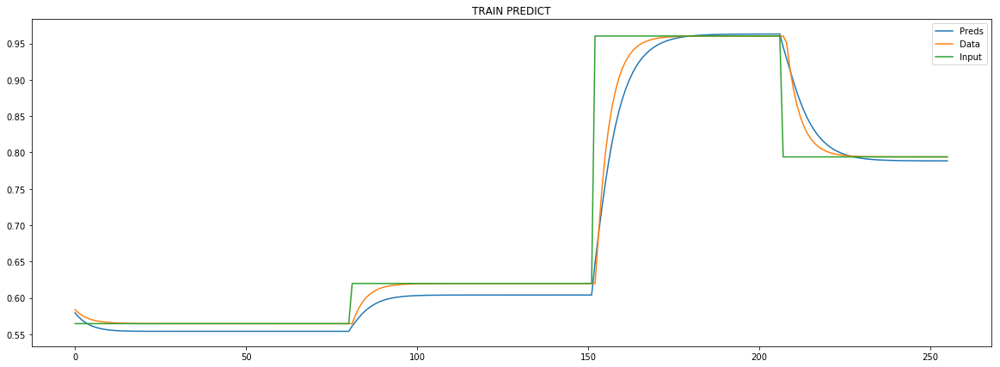

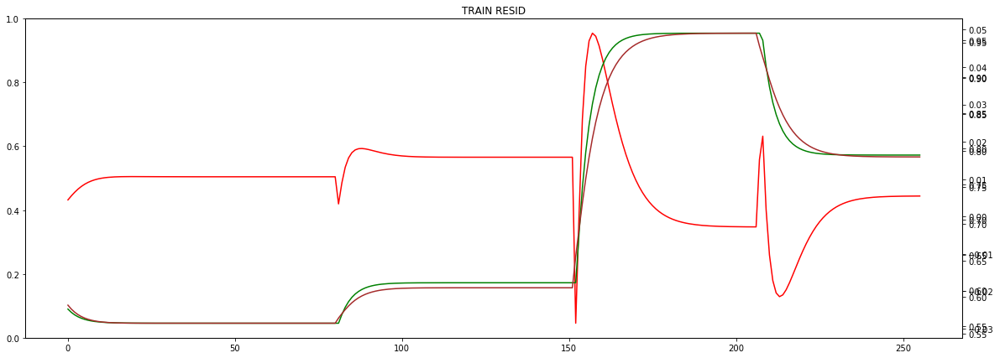


Parameter containing:
tensor([[0.4115, 0.2929]], requires_grad=True)


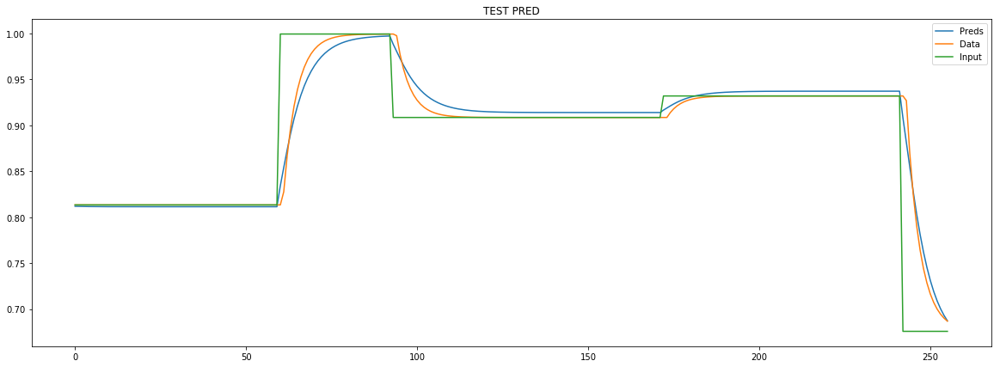

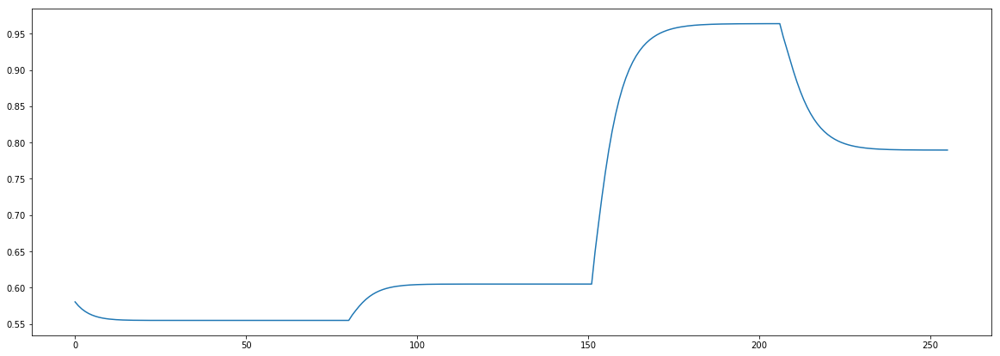

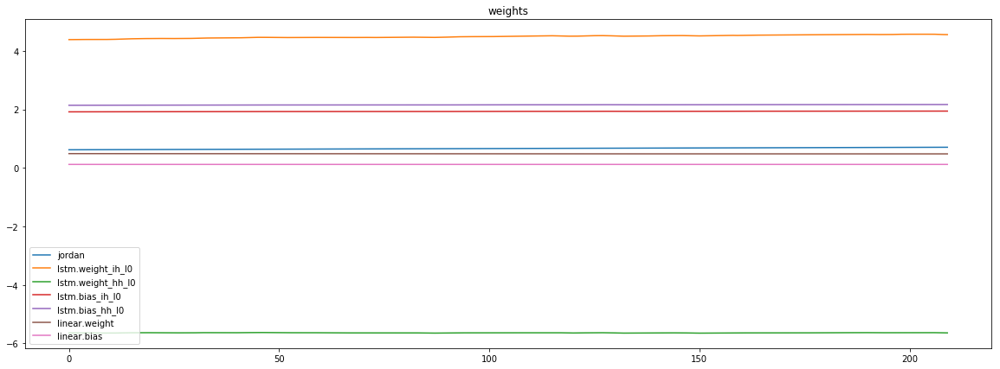

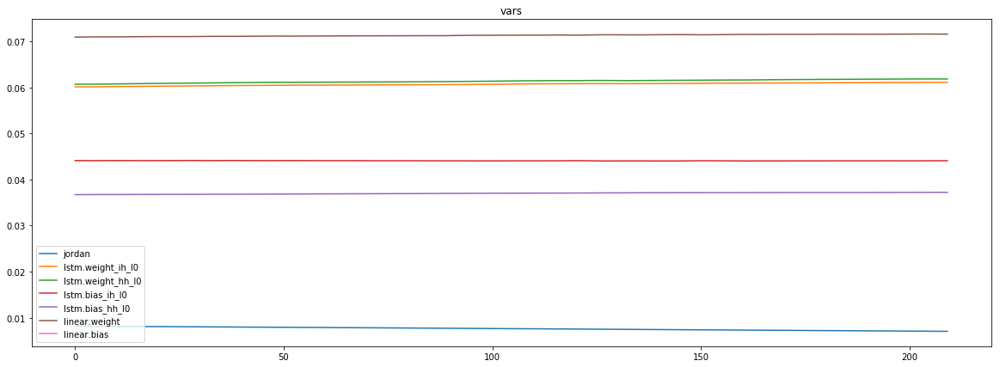

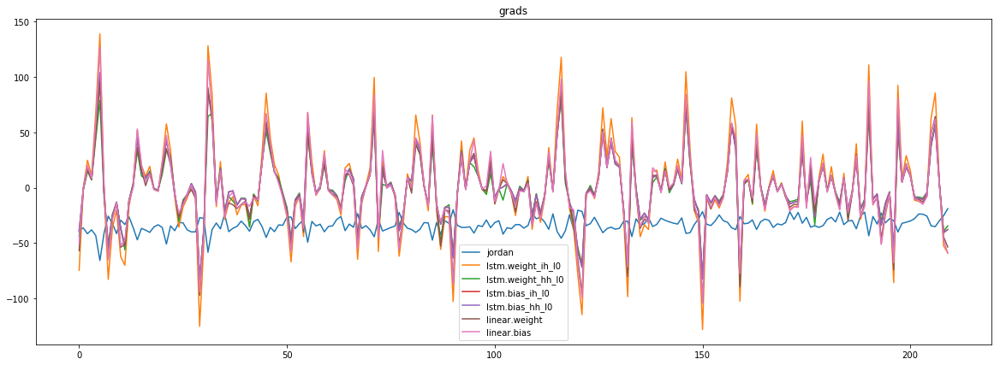

mean_p1 : -21.161503678276425
mean_p2 : -12.216293073835827


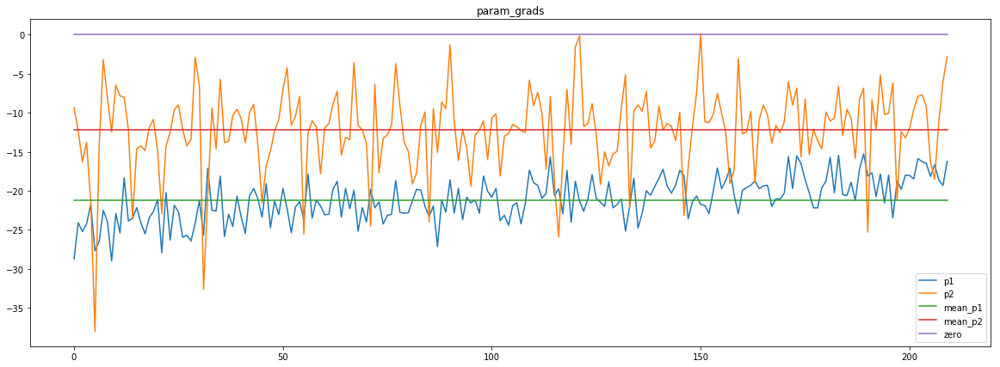

loss rate [0.6748628974895694]
Epoch [5] 
     train_loss[9.704695419323286] 
     eval_train[8.877008867618583] 
     eval_test[9.02152879806654]


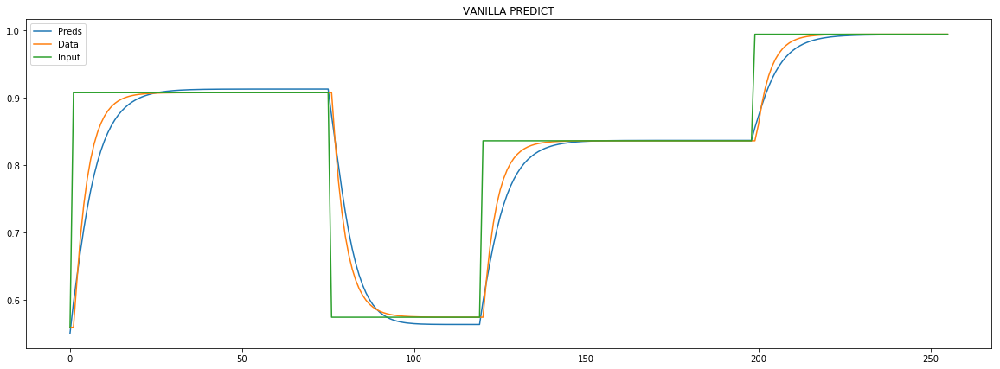

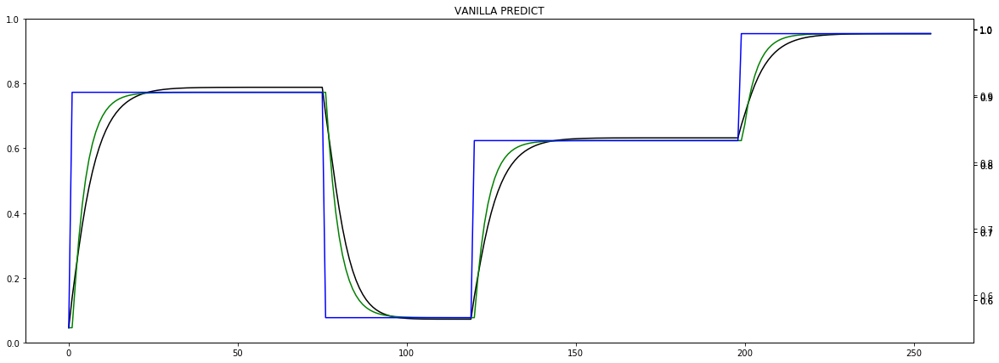


aux preds: 0.44641852378845215 0.34168511629104614
main loss 1.1355504906456364
aux loss 7.084067637579782
combined loss 8.219618128225418 


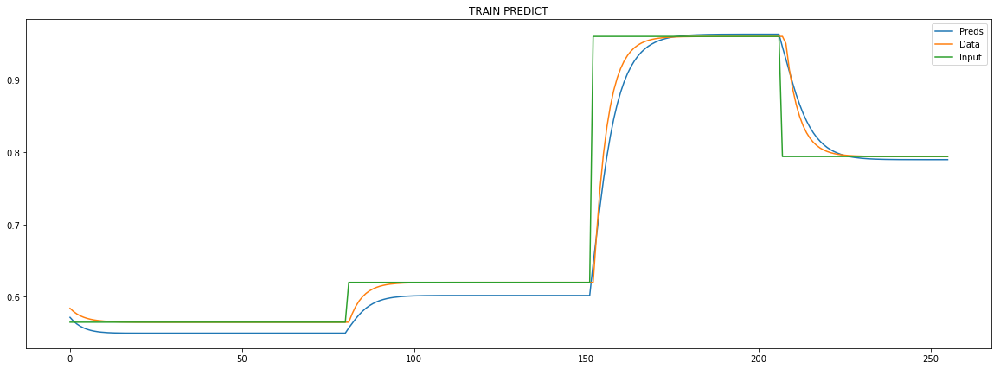

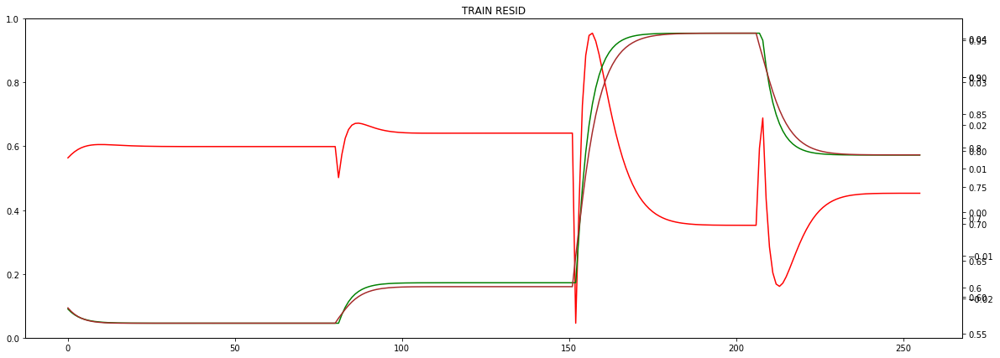


Parameter containing:
tensor([[0.4464, 0.3417]], requires_grad=True)


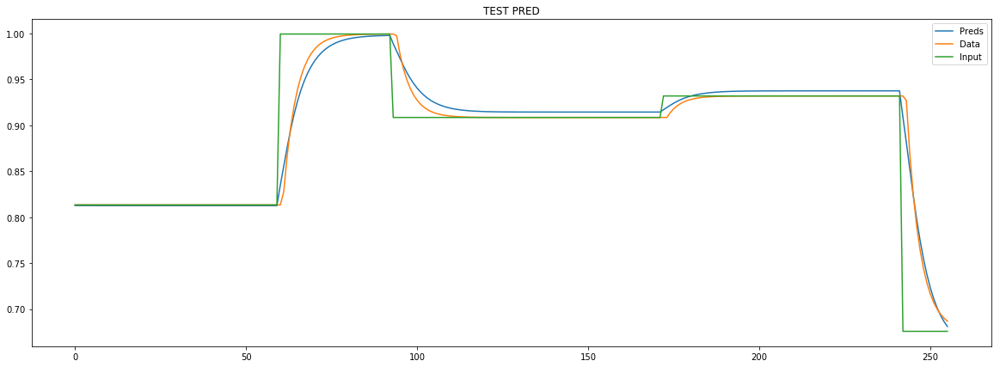

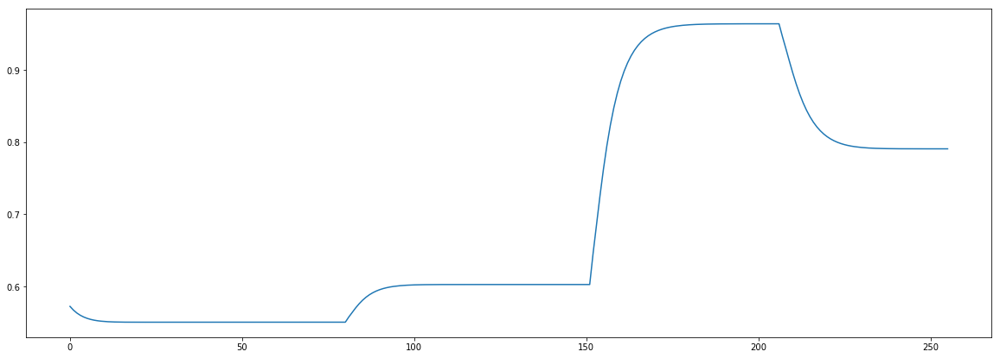

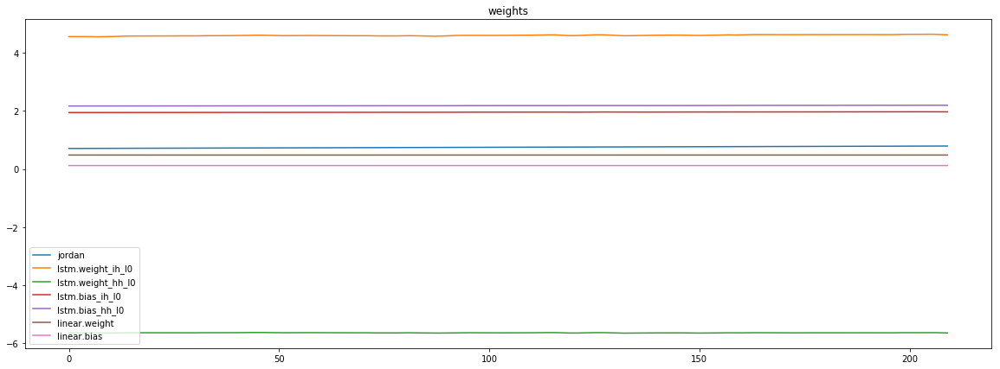

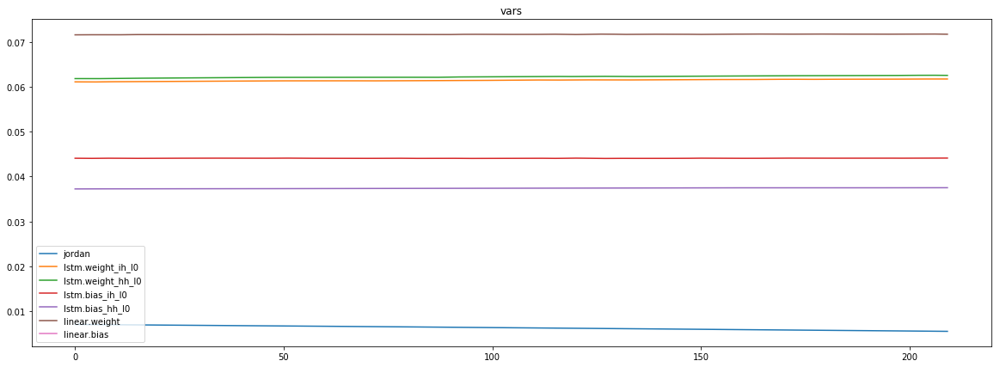

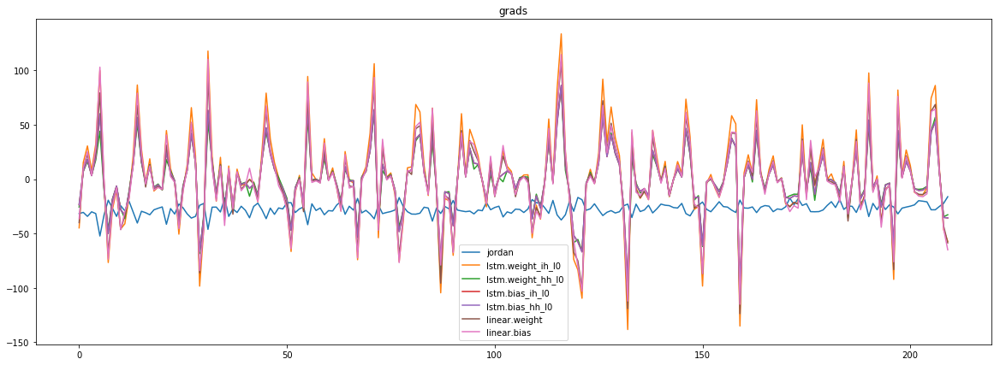

mean_p1 : -16.579746010189965
mean_p2 : -10.865765212831043


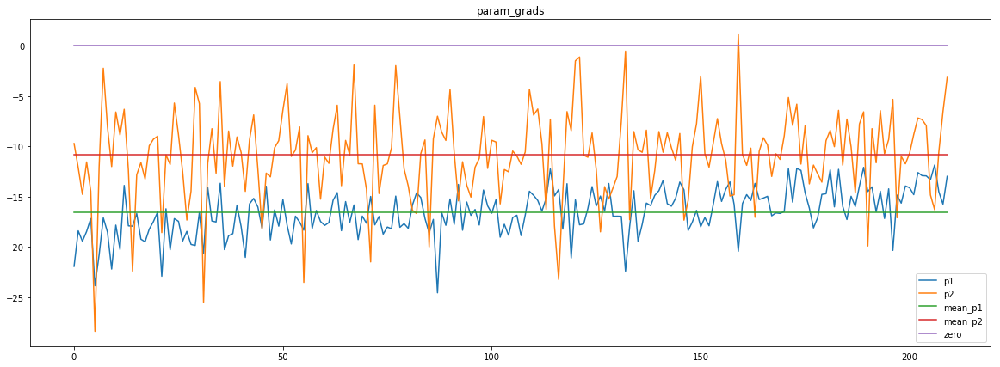

loss rate [0.49370902914713777]
Epoch [6] 
     train_loss[8.219618128225418] 
     eval_train[7.6485524881487] 
     eval_test[7.786397773432388]


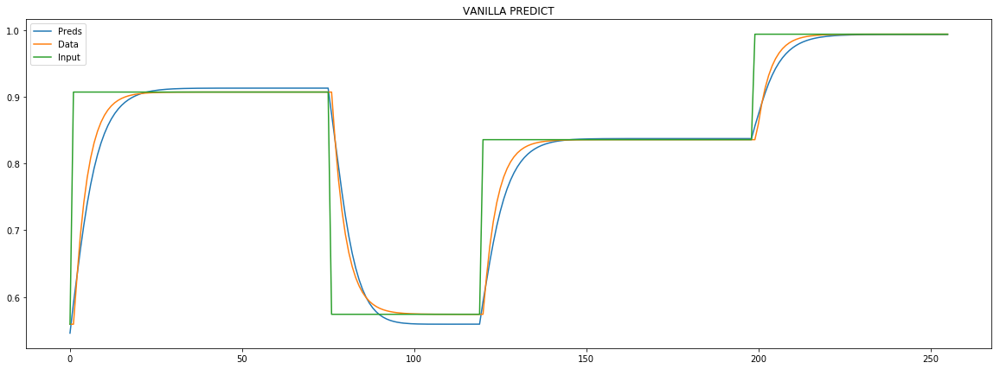

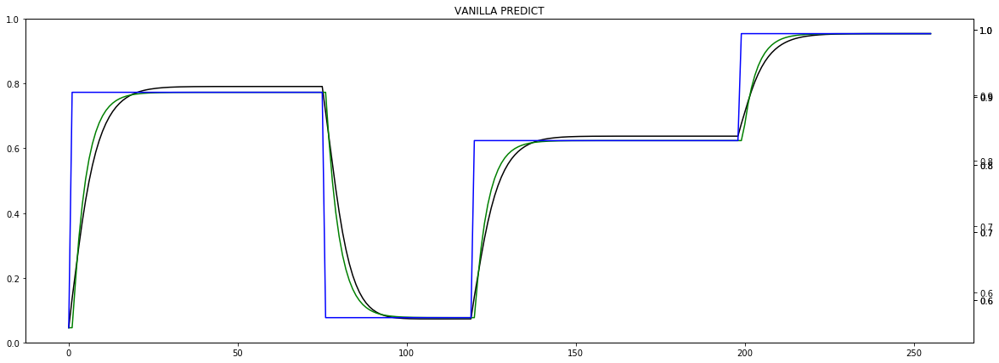


aux preds: 0.4783620536327362 0.3922956883907318
main loss 1.0196999722412632
aux loss 6.091583905901228
combined loss 7.1112838781424905 


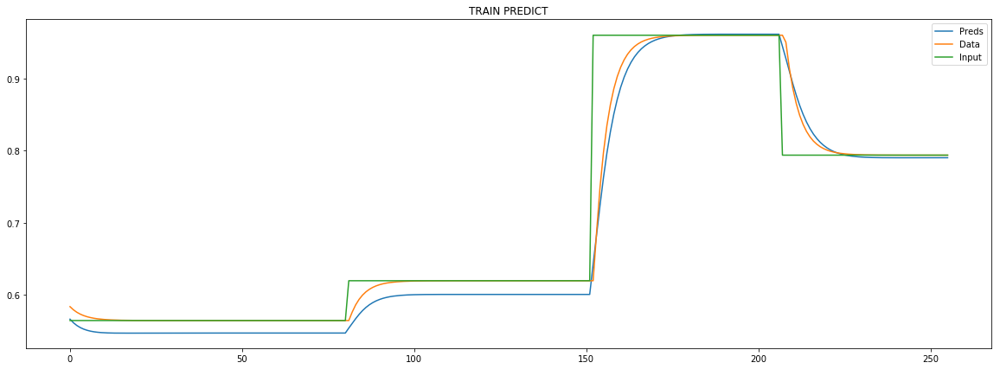

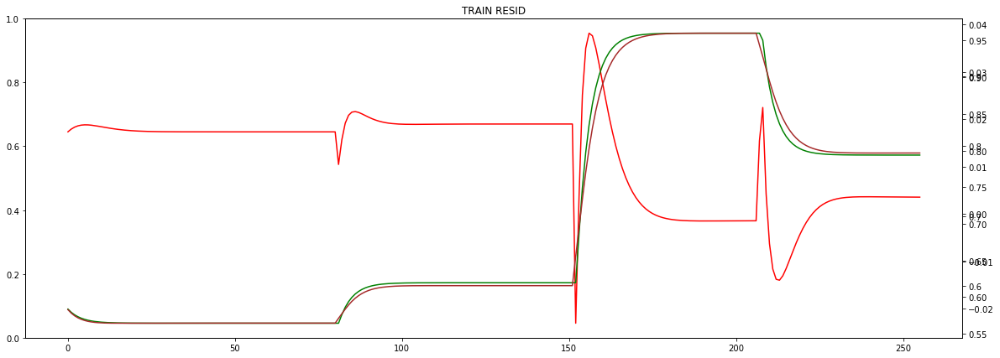


Parameter containing:
tensor([[0.4784, 0.3923]], requires_grad=True)


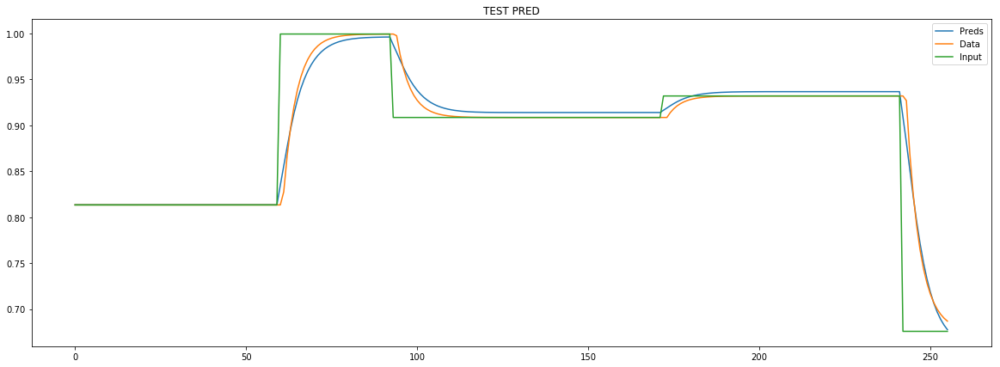

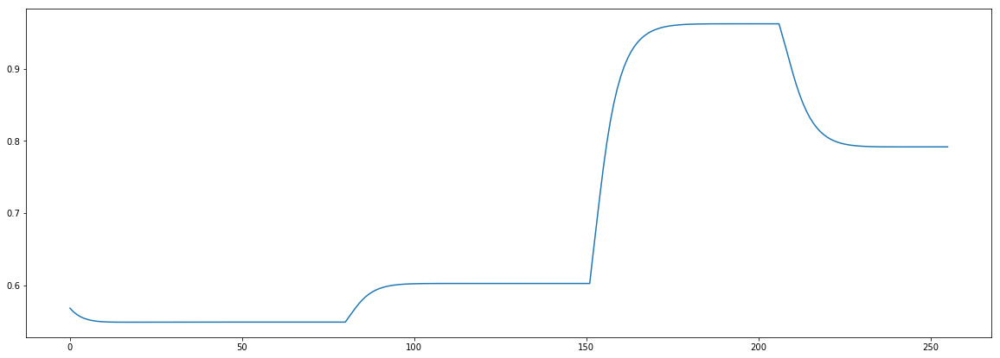

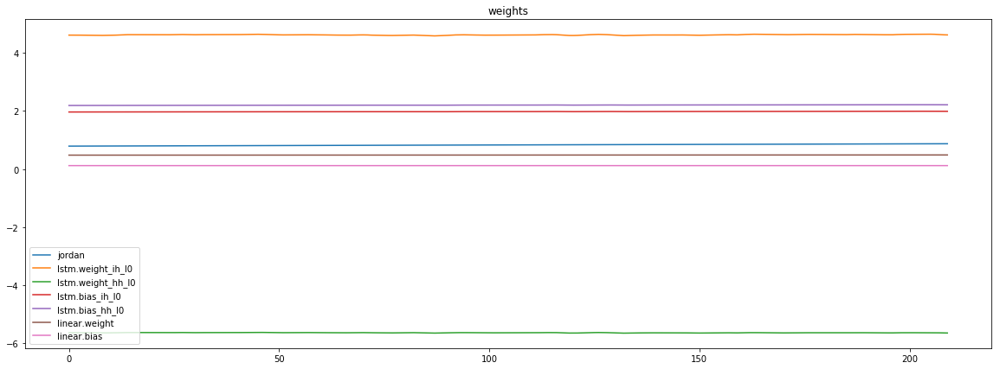

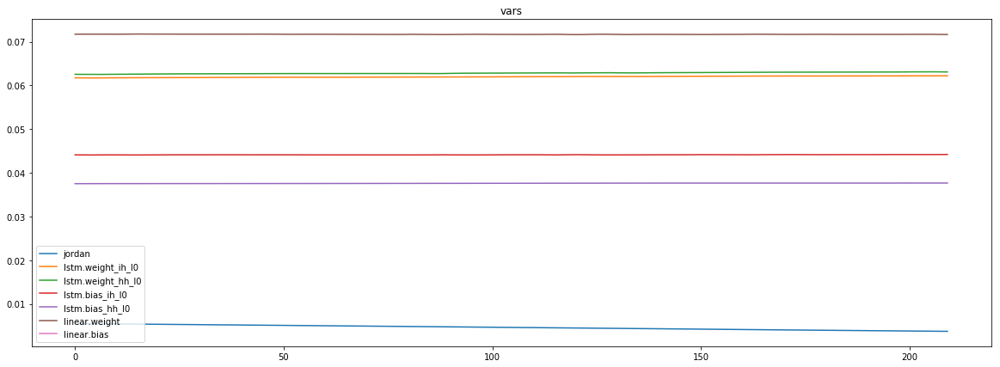

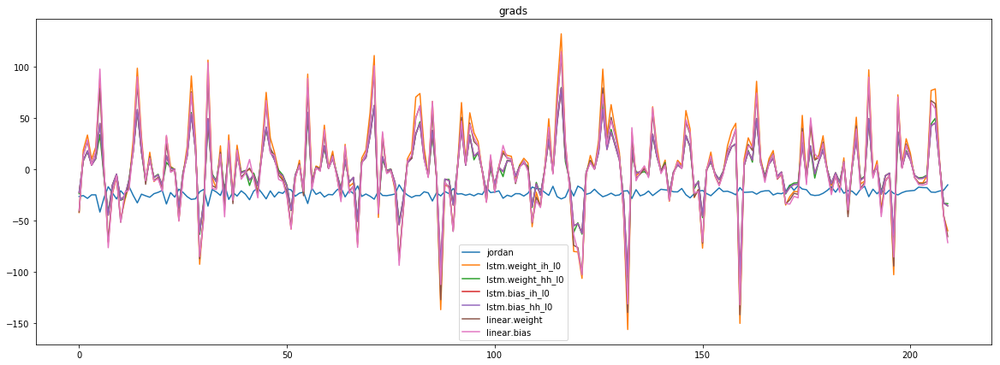

mean_p1 : -13.269724082946777
mean_p2 : -9.919983127003624


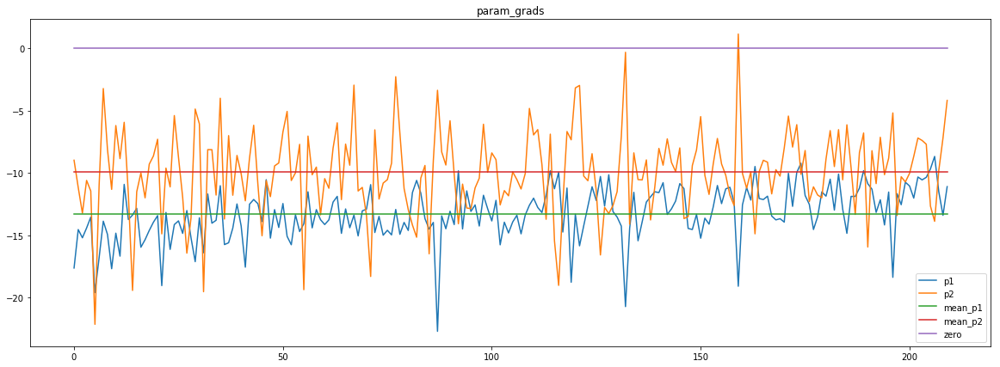

loss rate [0.2652758827026034]
Epoch [7] 
     train_loss[7.1112838781424905] 
     eval_train[6.648431797722532] 
     eval_test[6.786468938443015]


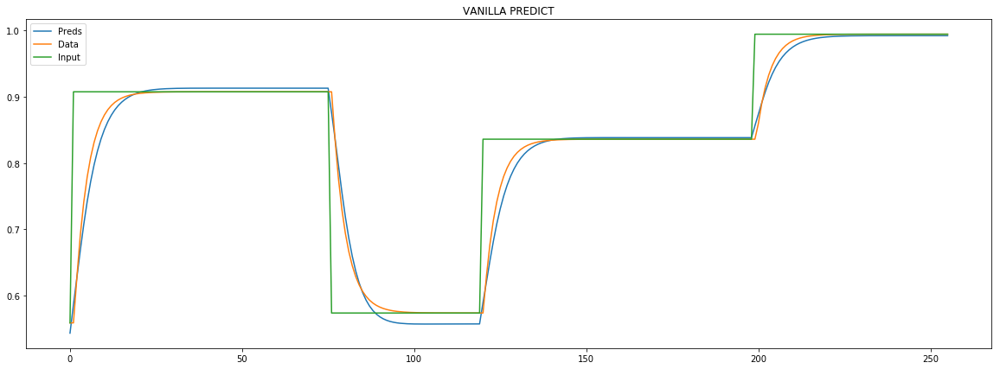

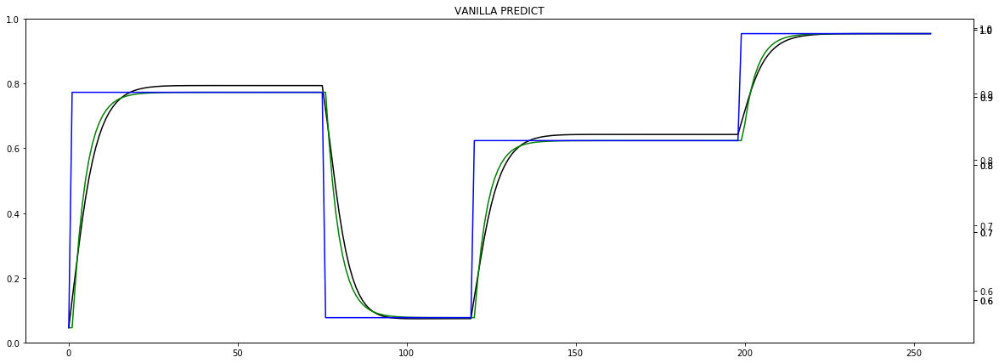


aux preds: 0.5077287554740906 0.4452334940433502
main loss 0.9324197920529903
aux loss 5.243976958592733
combined loss 6.176396750645724 


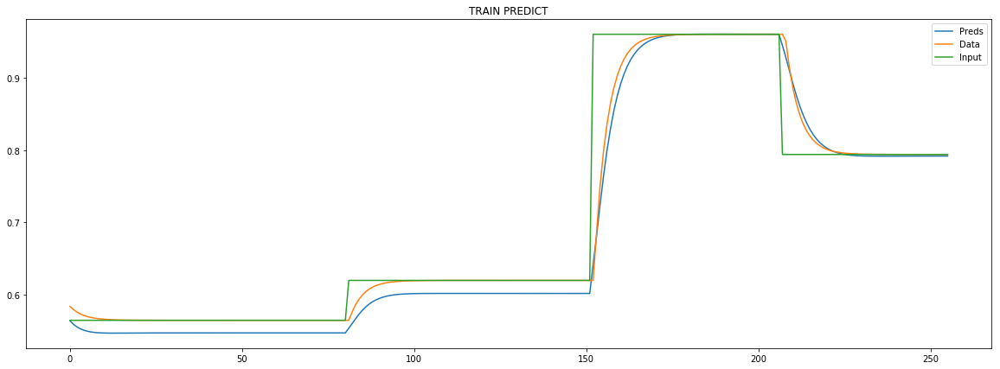

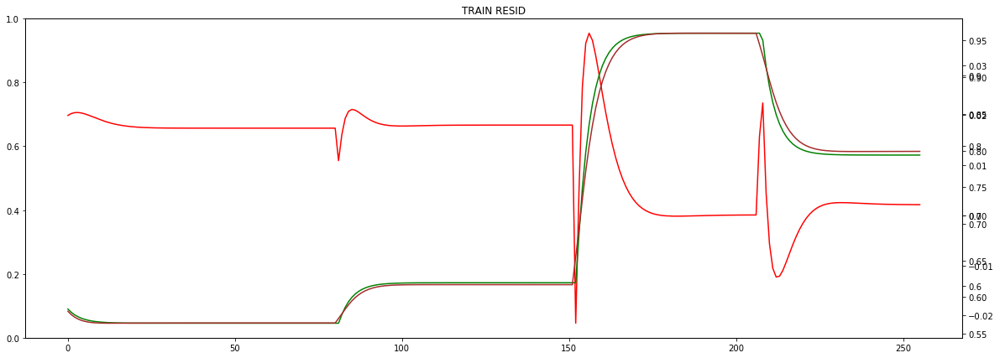


Parameter containing:
tensor([[0.5077, 0.4452]], requires_grad=True)


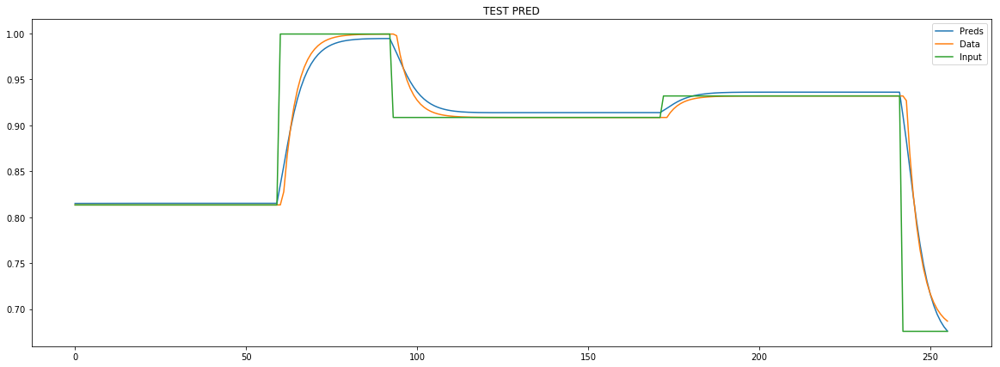

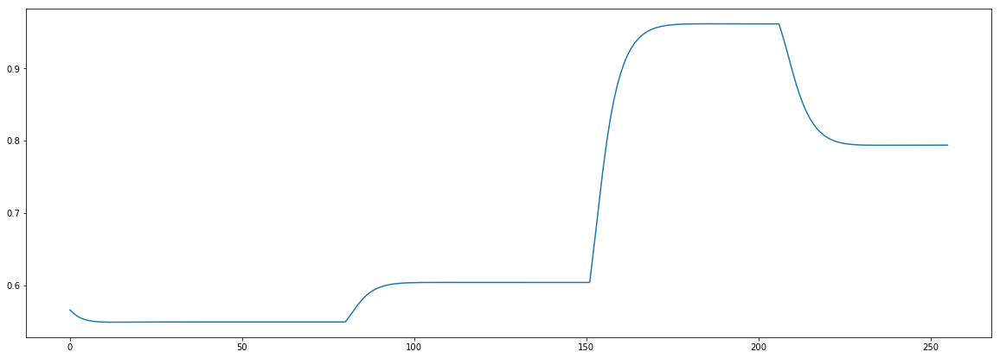

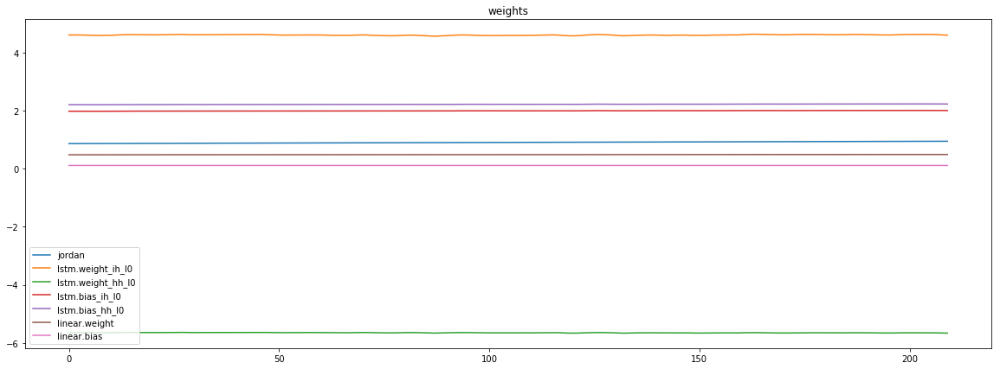

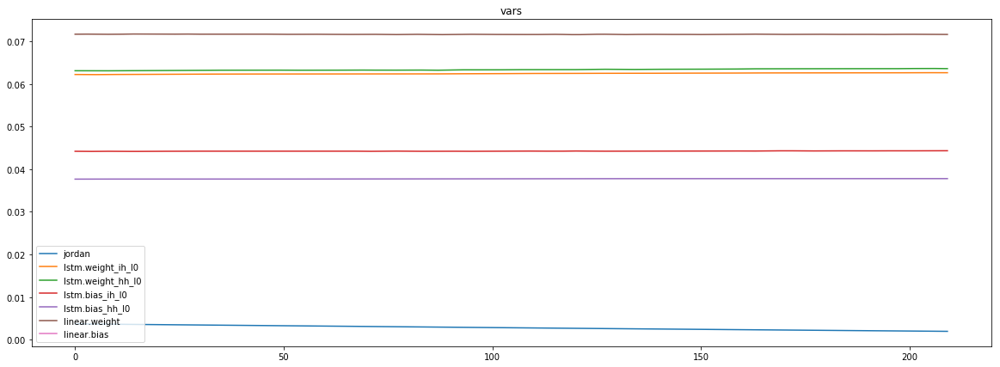

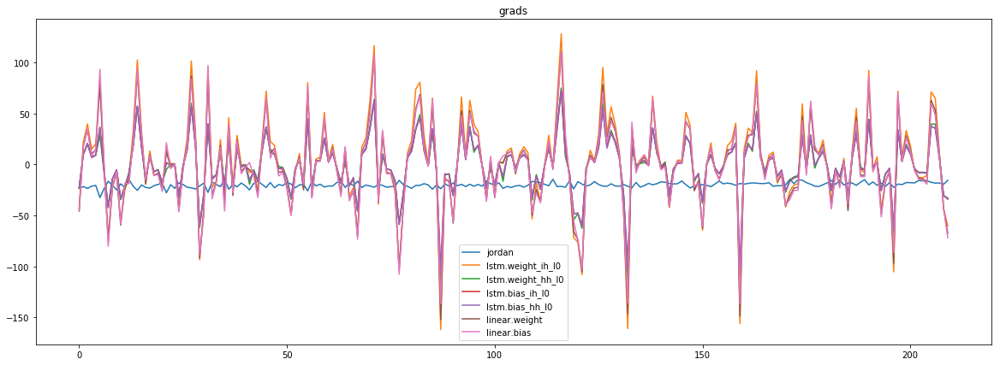

mean_p1 : -10.756369990394228
mean_p2 : -9.199547290802002


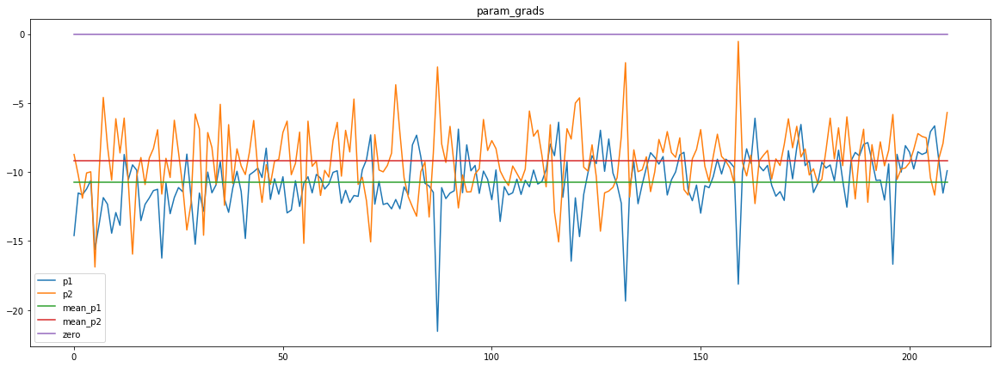

loss rate [0.25214815891737574]
Epoch [8] 
     train_loss[6.176396750645724] 
     eval_train[5.7485448660162675] 
     eval_test[5.881704040447229]


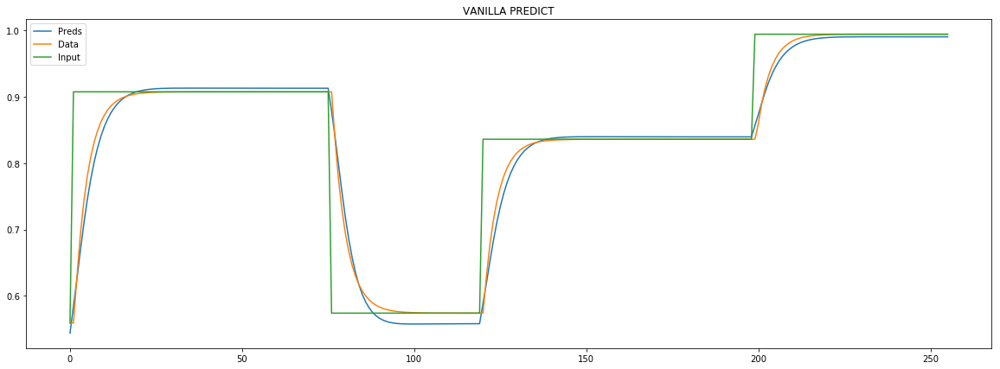

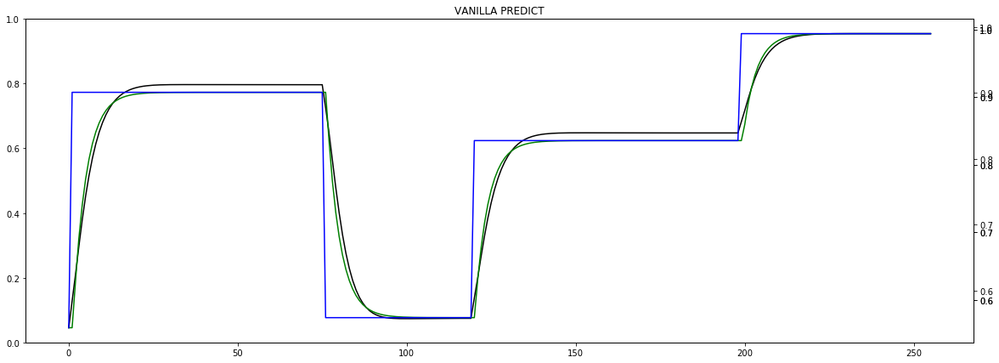


aux preds: 0.5347335934638977 0.5008587837219238
main loss 0.8525989168007592
aux loss 4.495480943861462
combined loss 5.348079860662221 


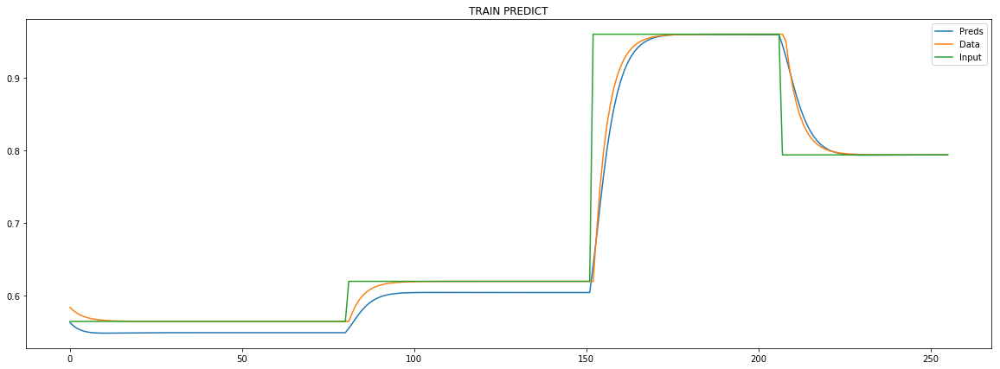

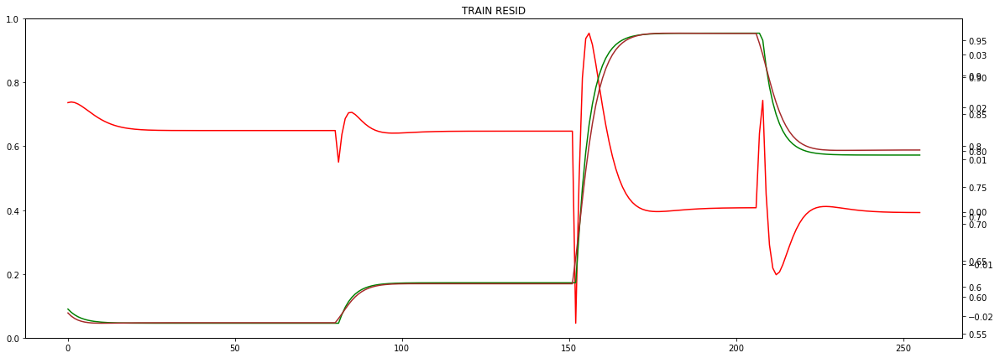


Parameter containing:
tensor([[0.5347, 0.5009]], requires_grad=True)


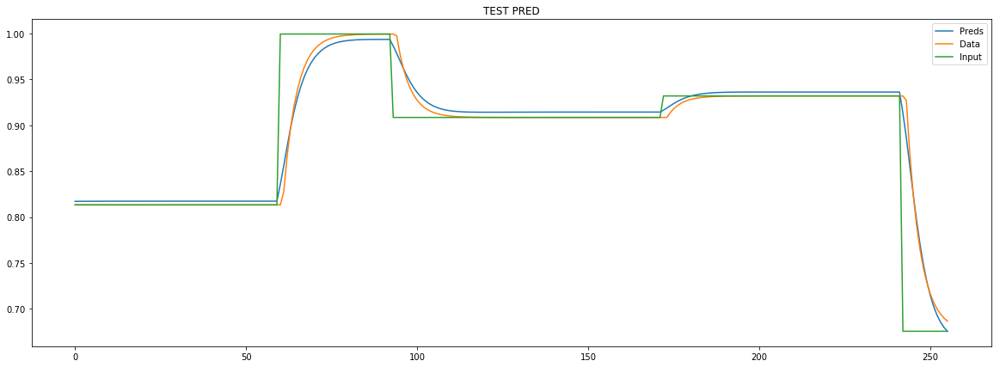

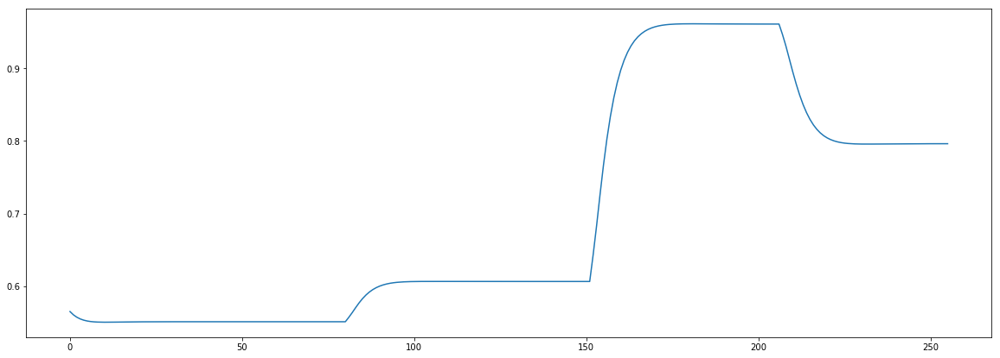

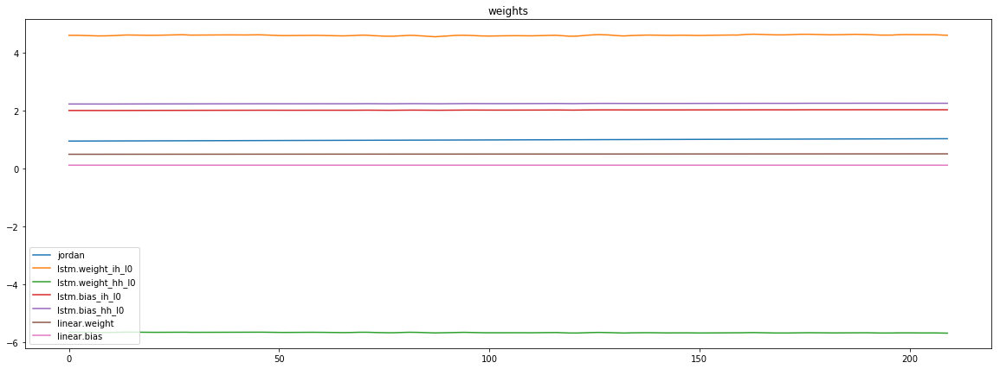

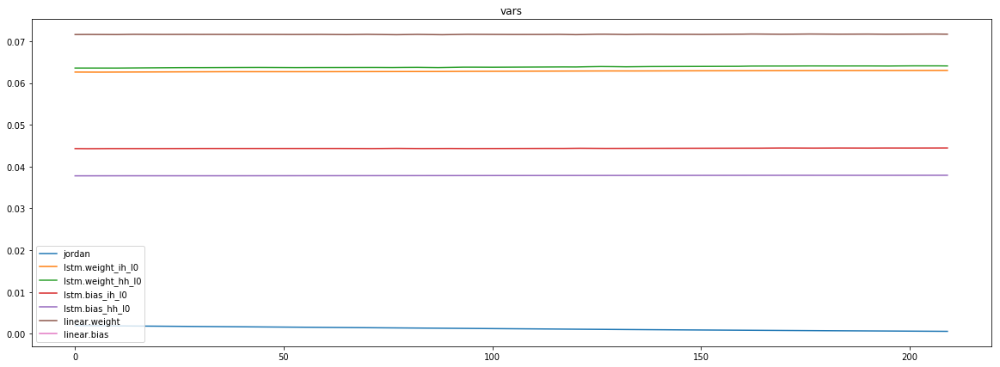

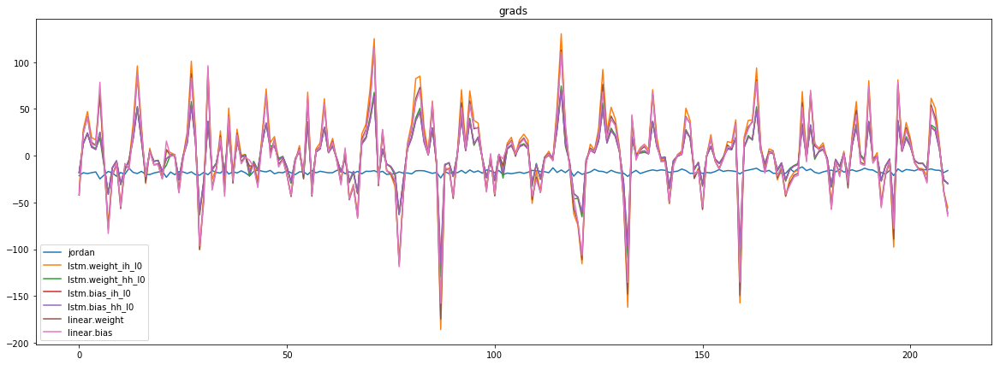

mean_p1 : -8.761180062521072
mean_p2 : -8.616327633176532


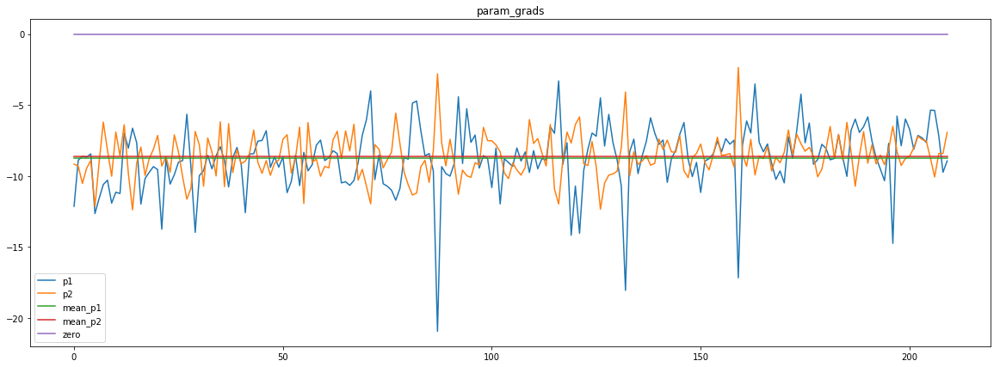

loss rate [0.2604006015449005]
Epoch [9] 
     train_loss[5.348079860662221] 
     eval_train[4.920459441629992] 
     eval_test[5.04272940802503]


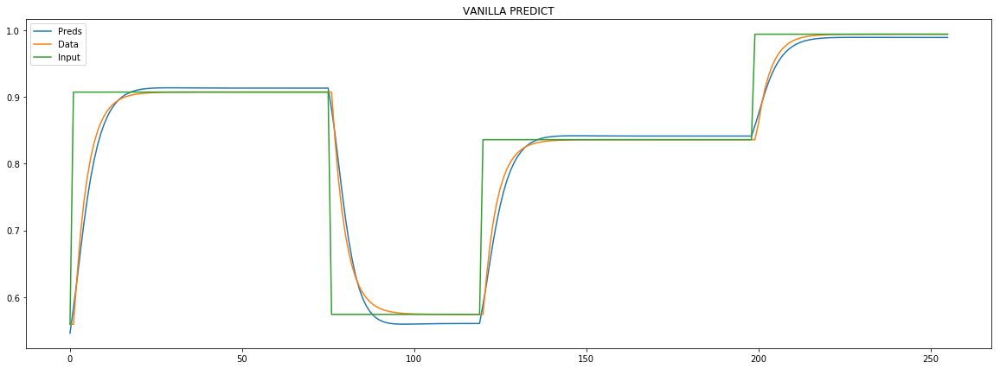

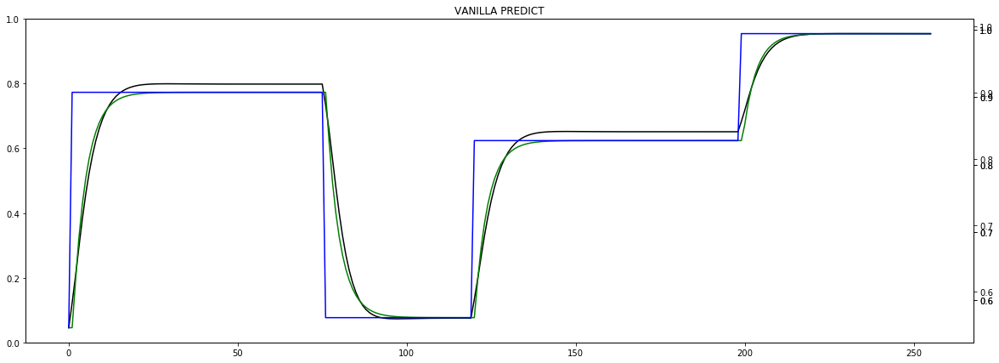


aux preds: 0.559421956539154 0.5595197081565857
main loss 0.7771410127092774
aux loss 3.816873806998843
combined loss 4.5940148197081205 


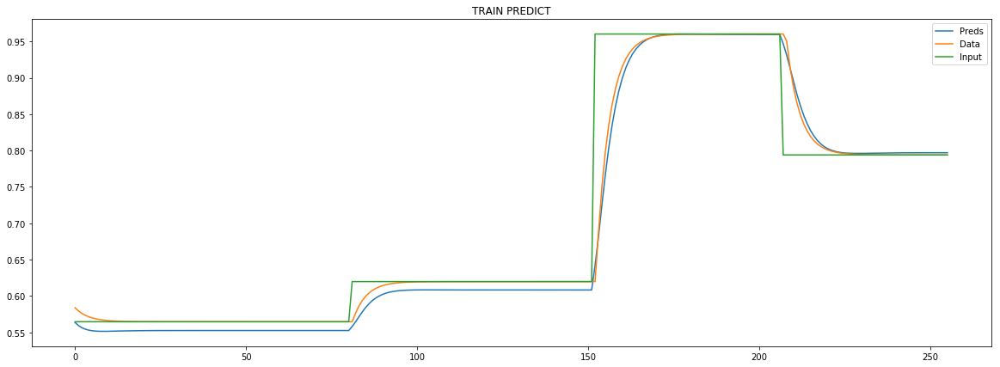

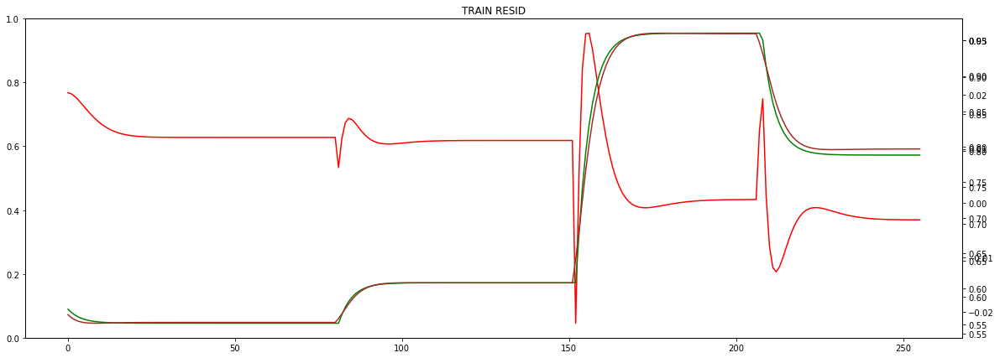


Parameter containing:
tensor([[0.5594, 0.5595]], requires_grad=True)


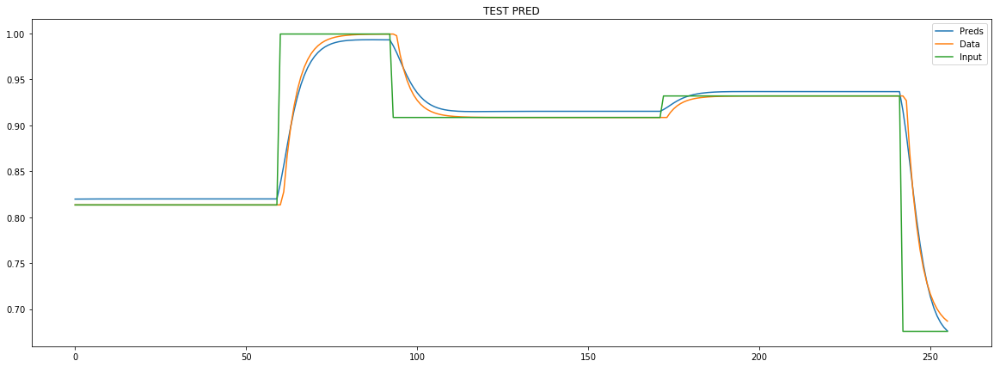

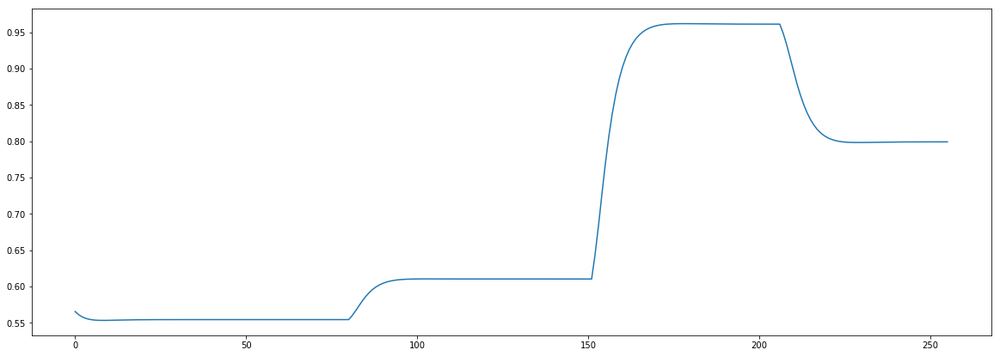

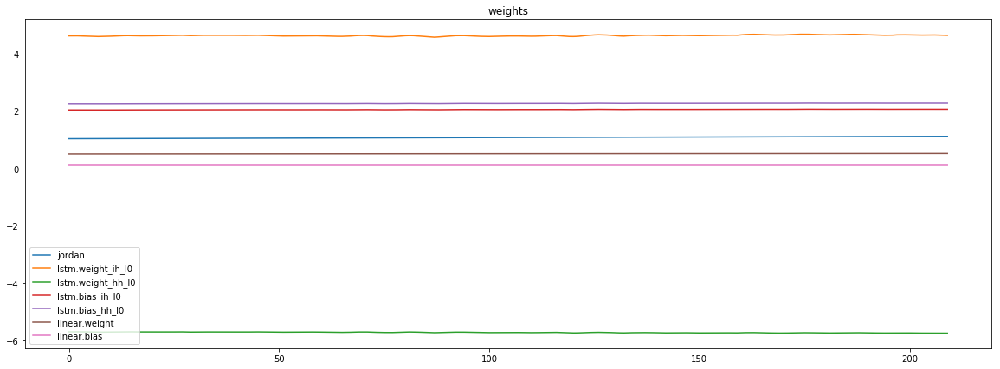

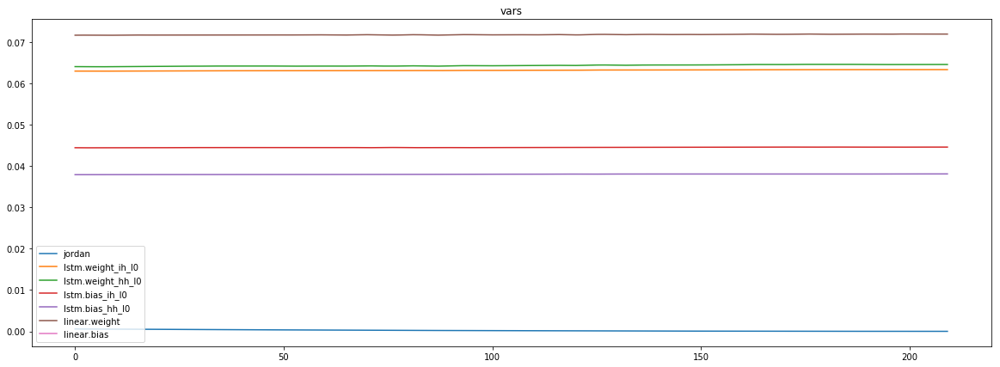

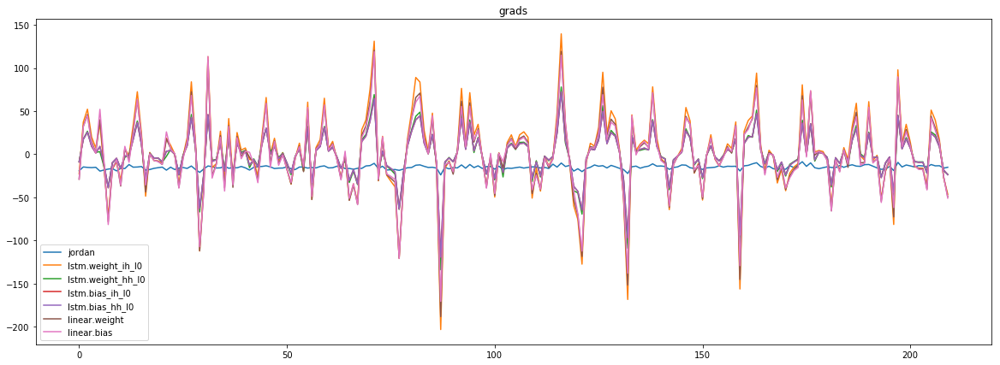

mean_p1 : -7.117608735674904
mean_p2 : -8.133025855109805


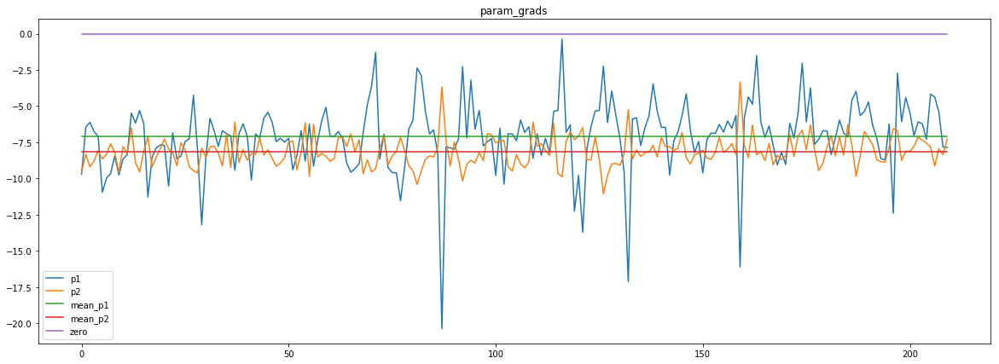

loss rate [0.27520341033923645]
Epoch [10] 
     train_loss[4.5940148197081205] 
     eval_train[4.169991620080102] 
     eval_test[4.278933883283622]


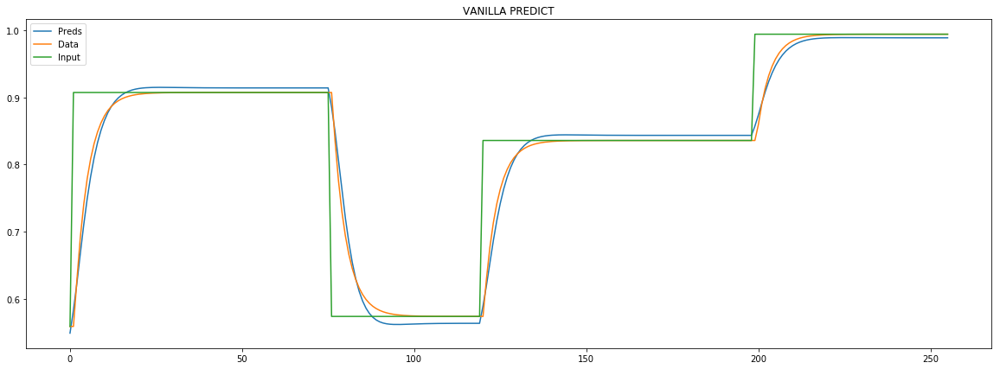

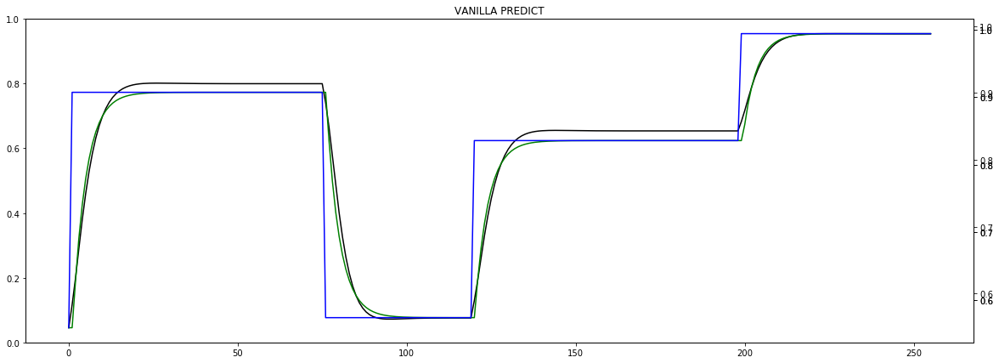


aux preds: 0.5817087292671204 0.6215705275535583
main loss 0.7084706424713312
aux loss 3.1876496859959196
combined loss 3.8961203284672505 


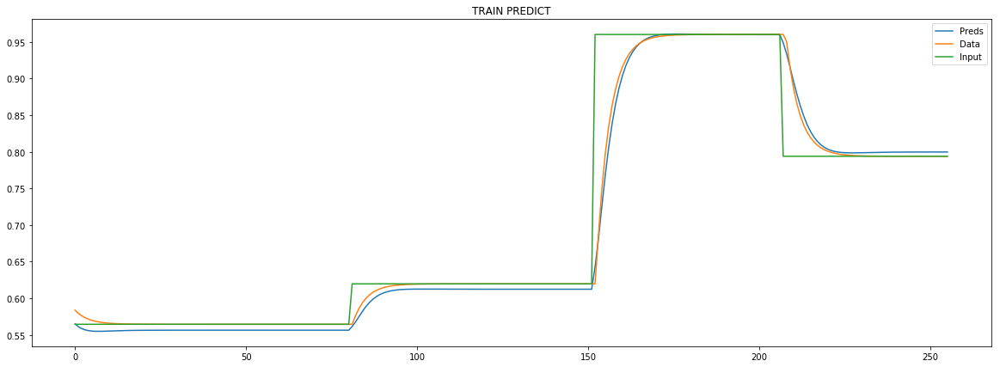

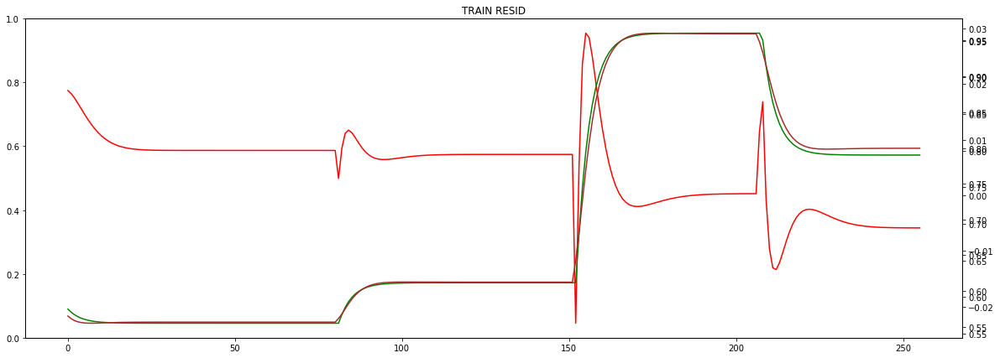


Parameter containing:
tensor([[0.5817, 0.6216]], requires_grad=True)


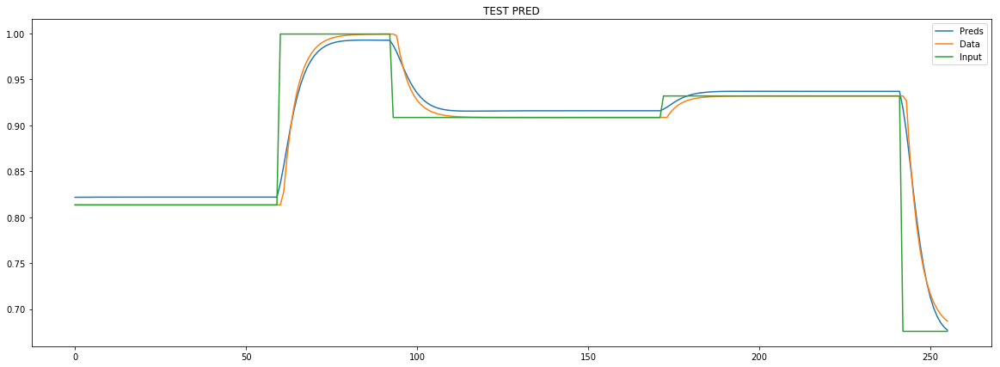

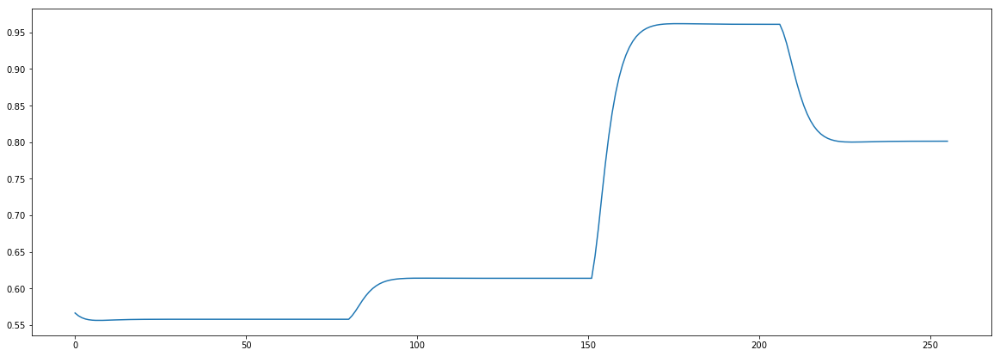

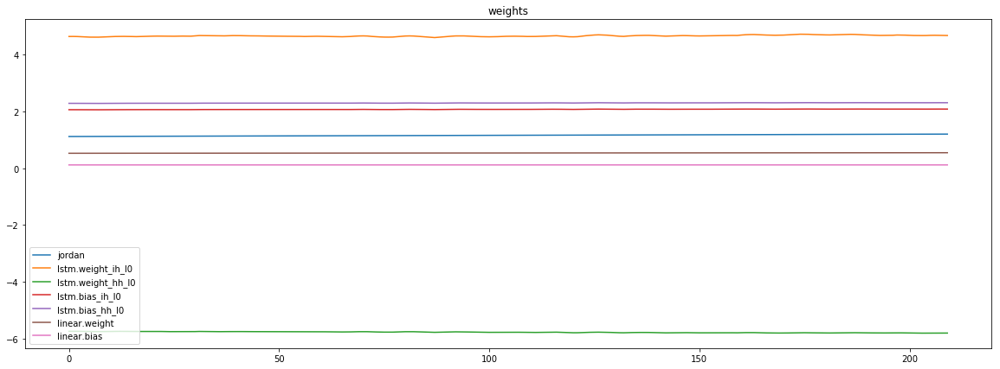

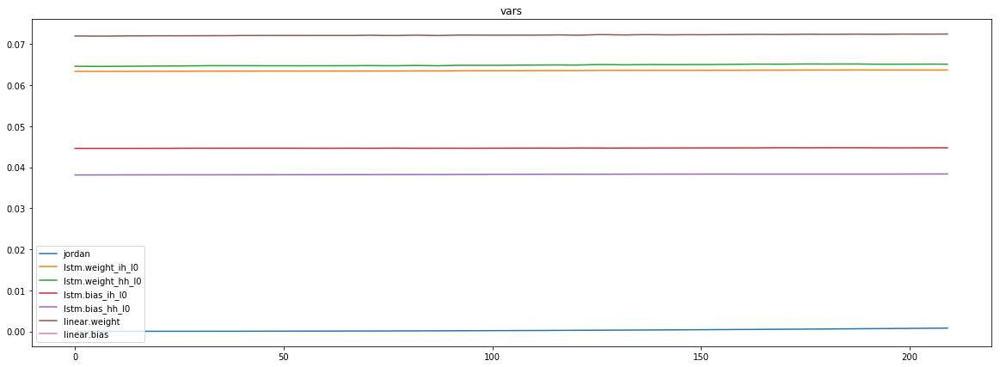

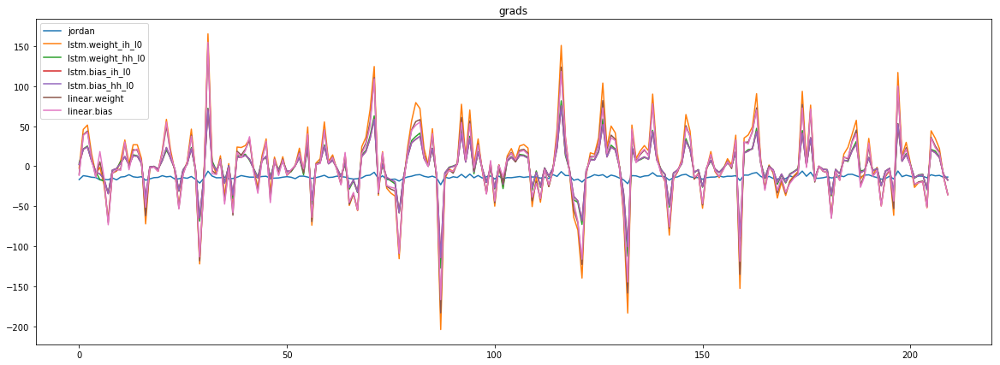

mean_p1 : -5.722322325479417
mean_p2 : -7.728925886608305


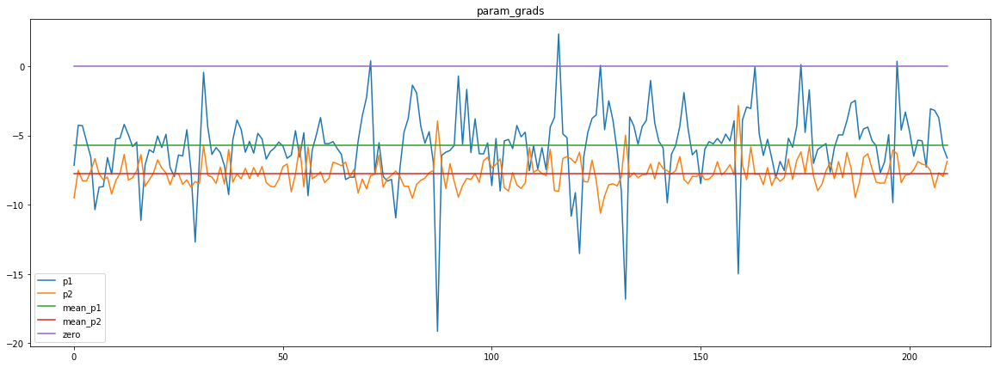

loss rate [0.2911465441184755]
Epoch [11] 
     train_loss[3.8961203284672505] 
     eval_train[3.4950703806903523] 
     eval_test[3.5923198247171433]


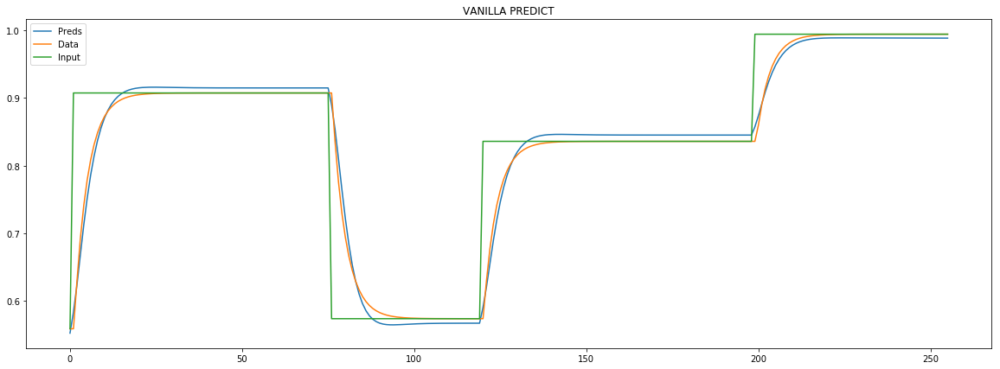

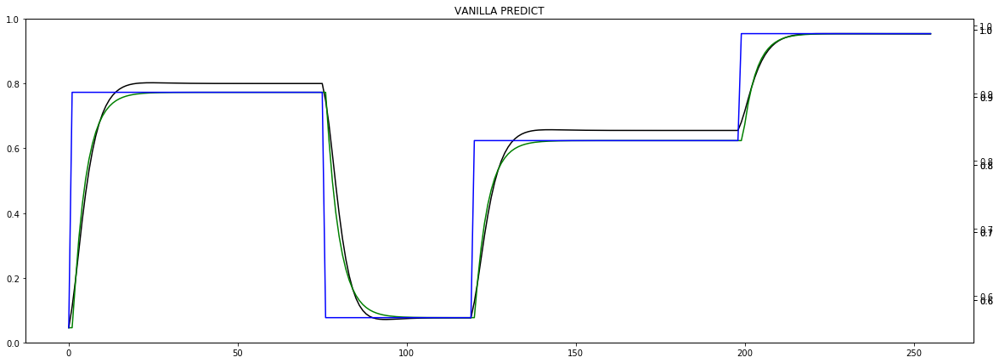


aux preds: 0.6013762354850769 0.6873120069503784
main loss 0.665761005473628
aux loss 2.5930407285690307
combined loss 3.2588017340426587 


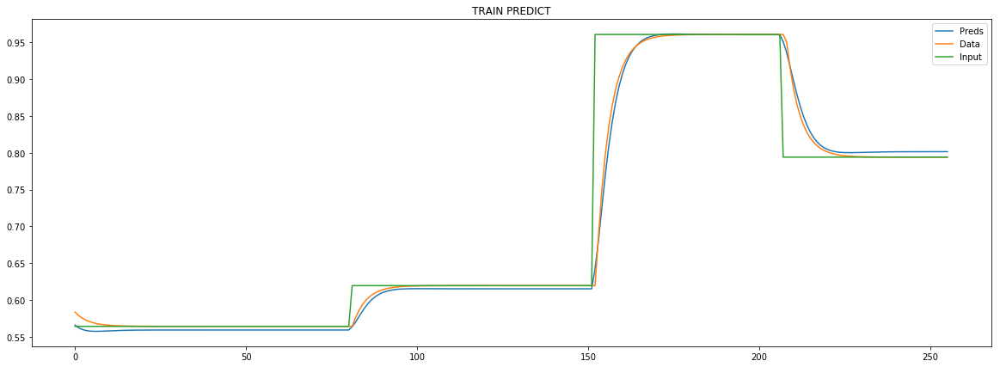

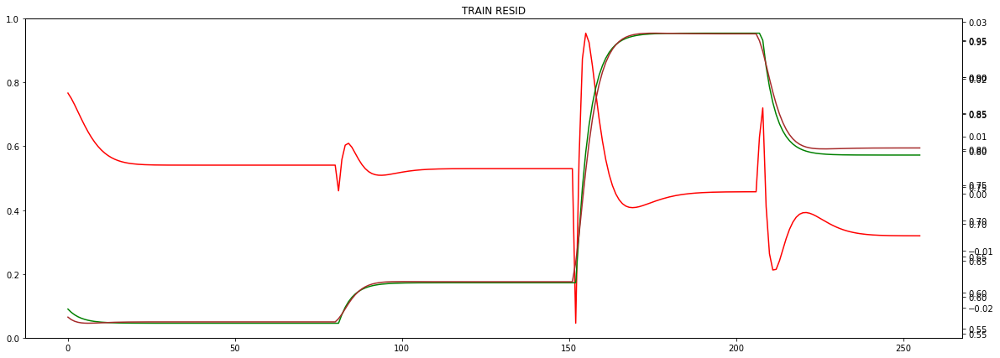


Parameter containing:
tensor([[0.6014, 0.6873]], requires_grad=True)


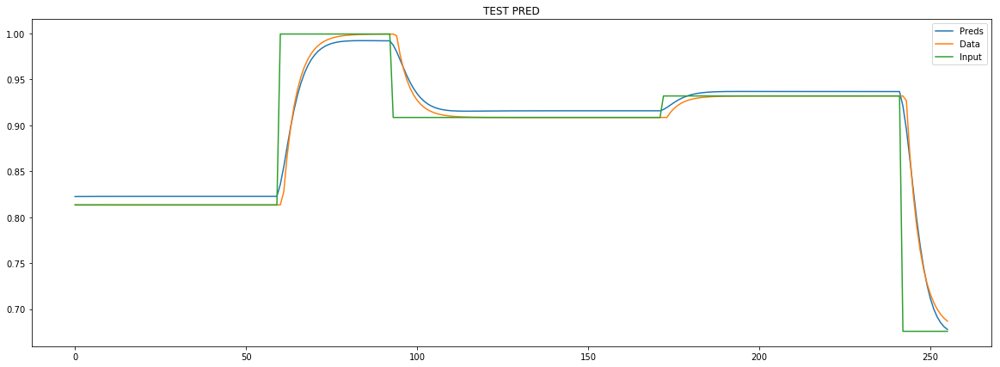

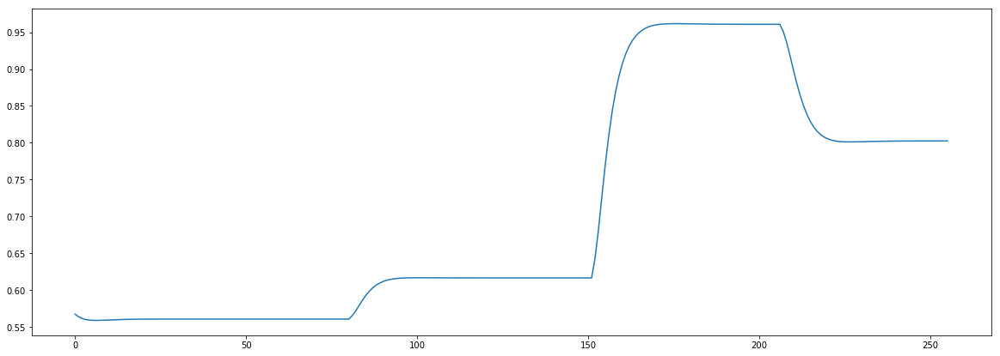

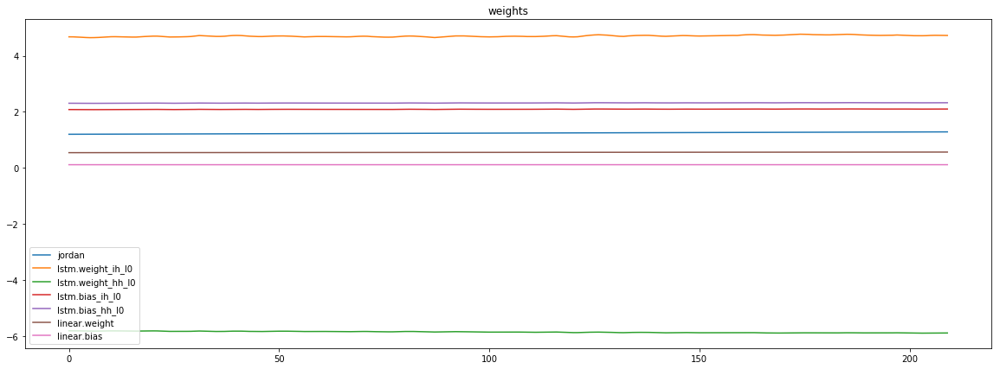

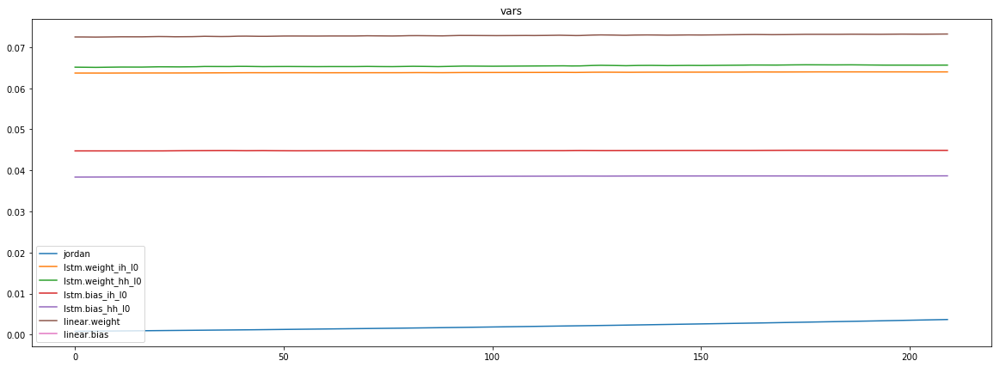

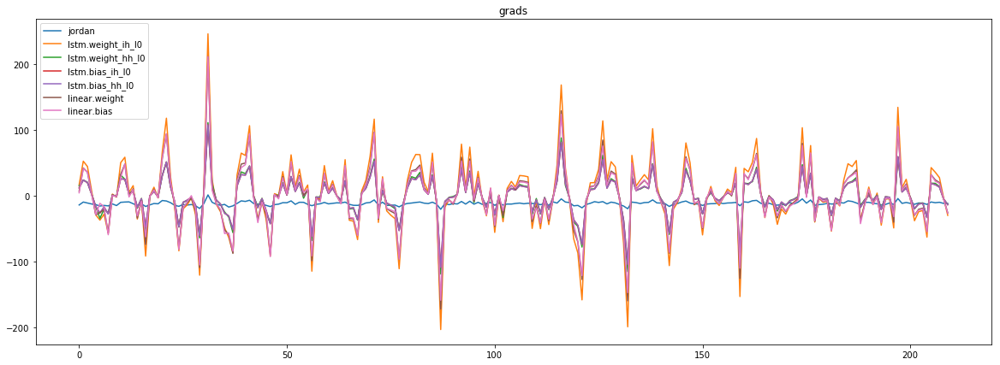

mean_p1 : -4.506927662804014
mean_p2 : -7.382044383457729


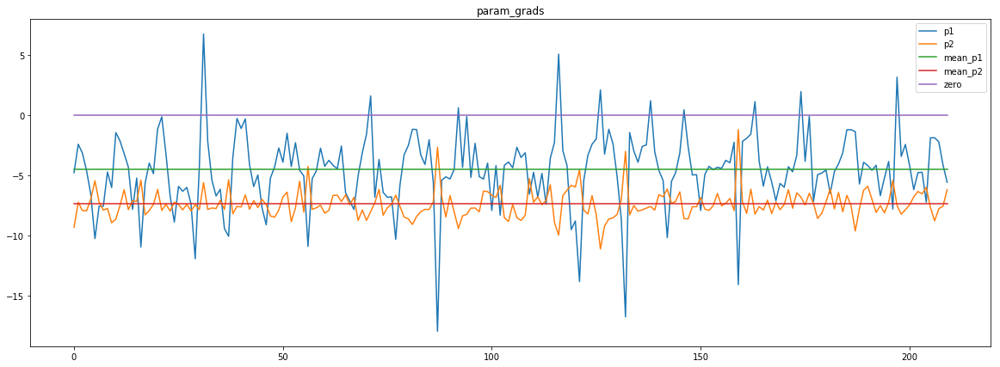

loss rate [0.3137684361266516]
Epoch [12] 
     train_loss[3.2588017340426587] 
     eval_train[2.86571258303288] 
     eval_test[2.9539942765148]


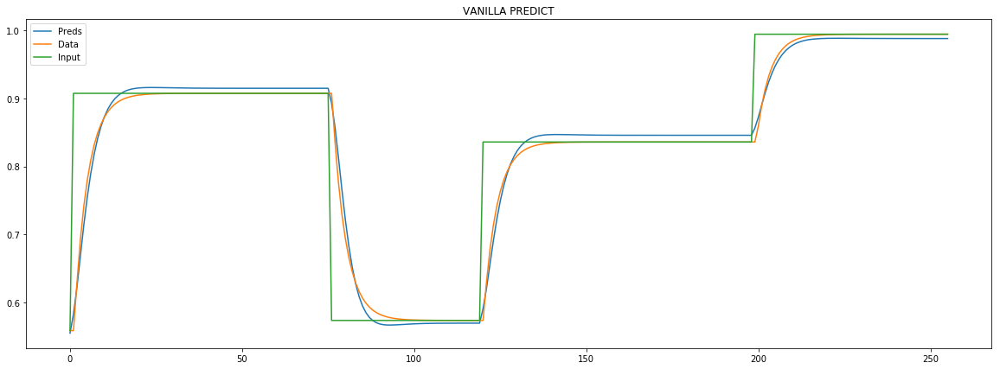

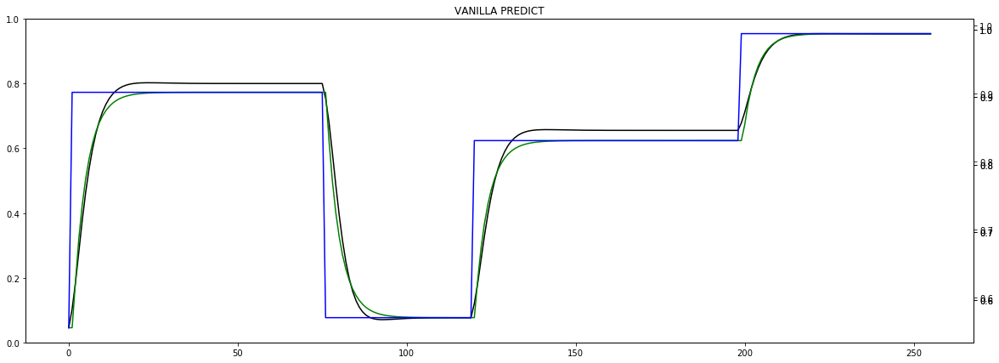


aux preds: 0.6180917024612427 0.7569931149482727
main loss 0.6489165593431347
aux loss 2.021650016307831
combined loss 2.6705665756509656 


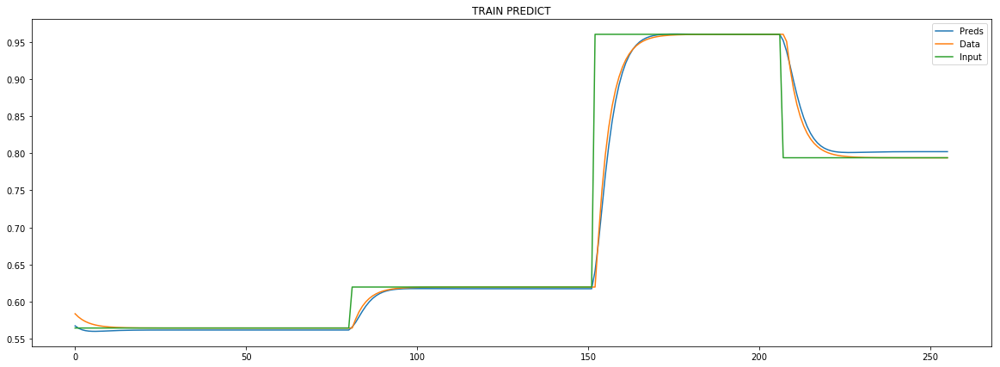

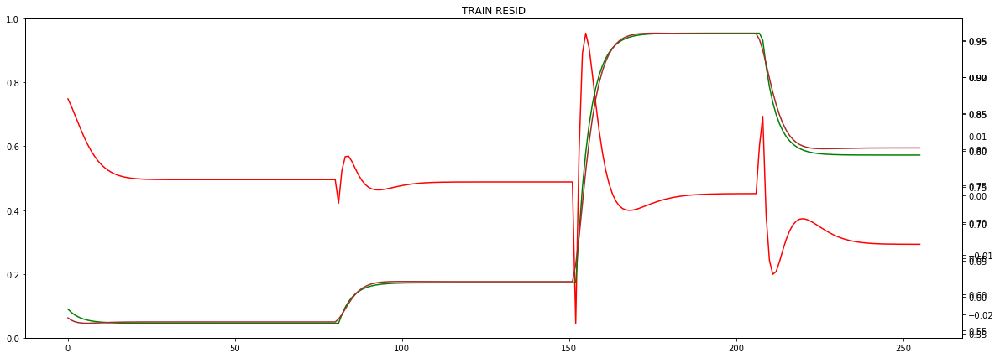


Parameter containing:
tensor([[0.6181, 0.7570]], requires_grad=True)


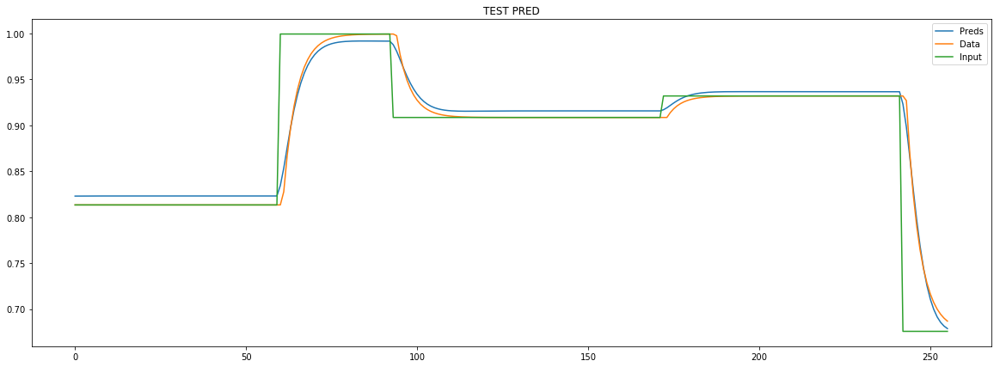

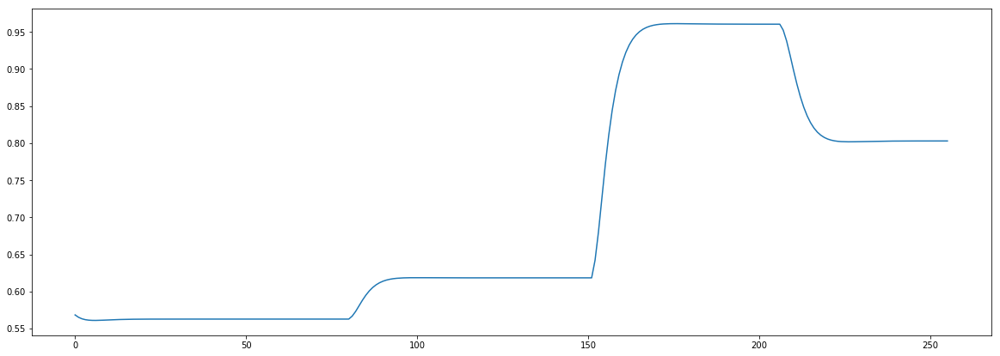

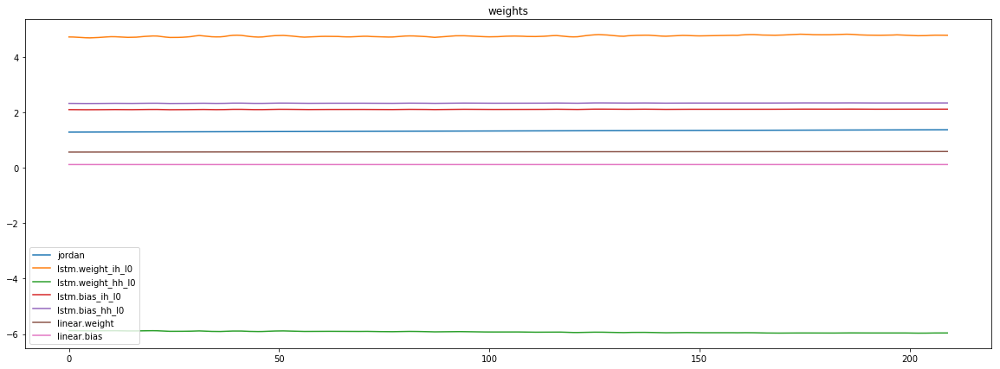

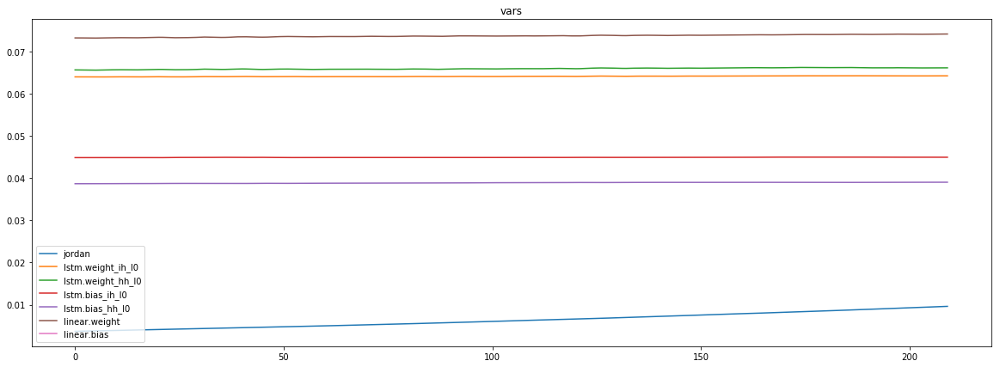

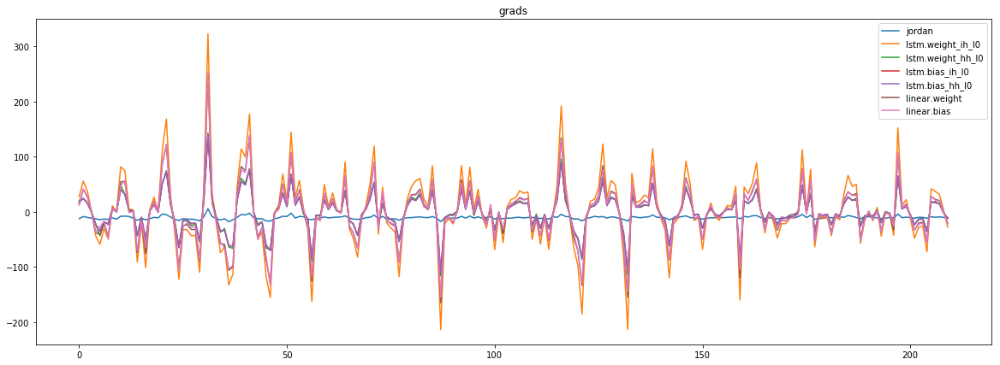

mean_p1 : -3.4239188682465325
mean_p2 : -7.078039103462583


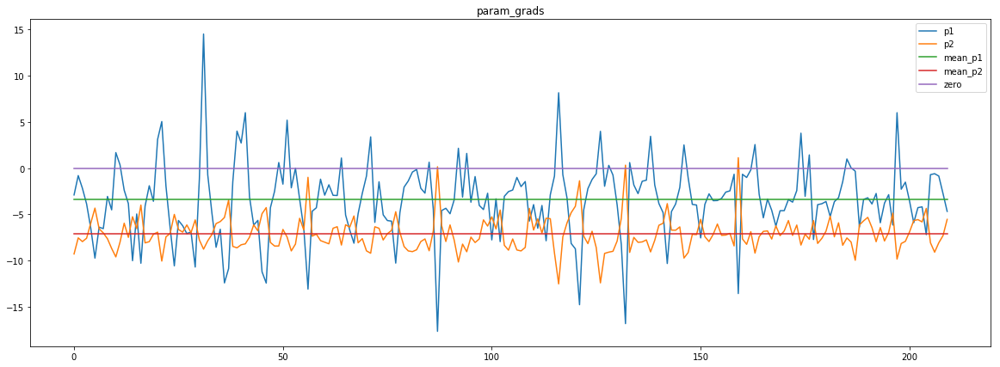

loss rate [0.351206741061881]
Epoch [13] 
     train_loss[2.6705665756509656] 
     eval_train[2.2606984659063443] 
     eval_test[2.3411159728957194]


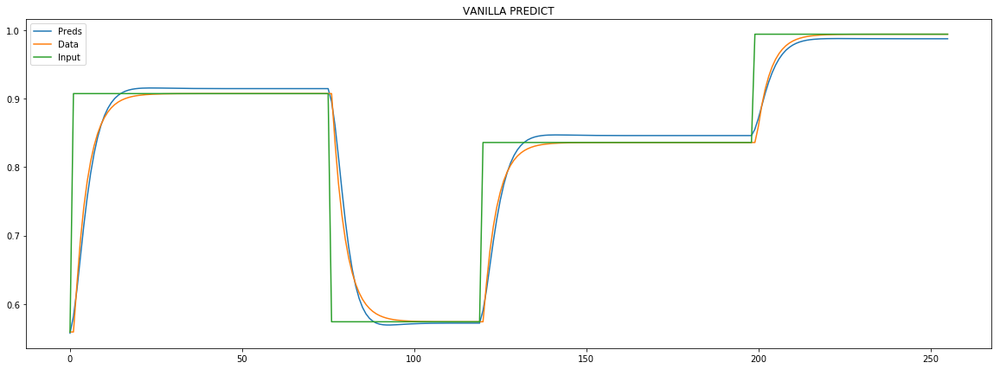

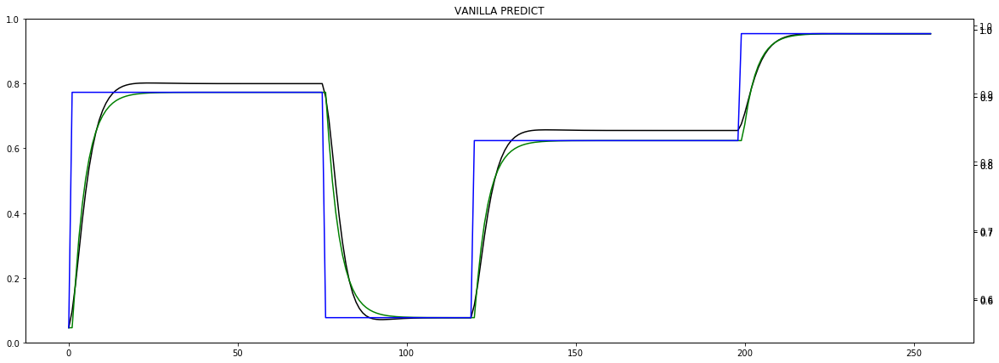


aux preds: 0.6313117742538452 0.8306578397750854
main loss 0.6391930734018734
aux loss 1.4651587616829644
combined loss 2.104351835084838 


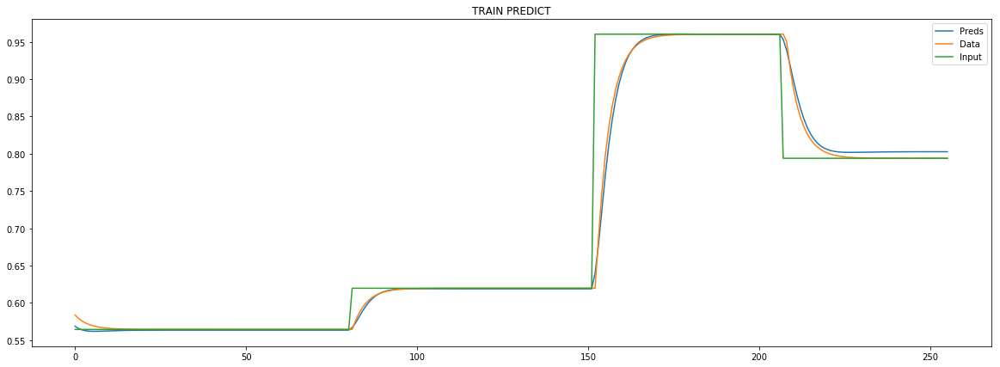

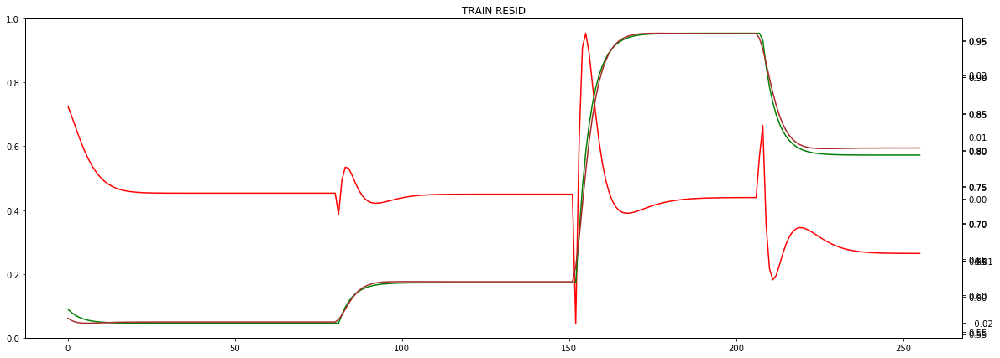


Parameter containing:
tensor([[0.6313, 0.8307]], requires_grad=True)


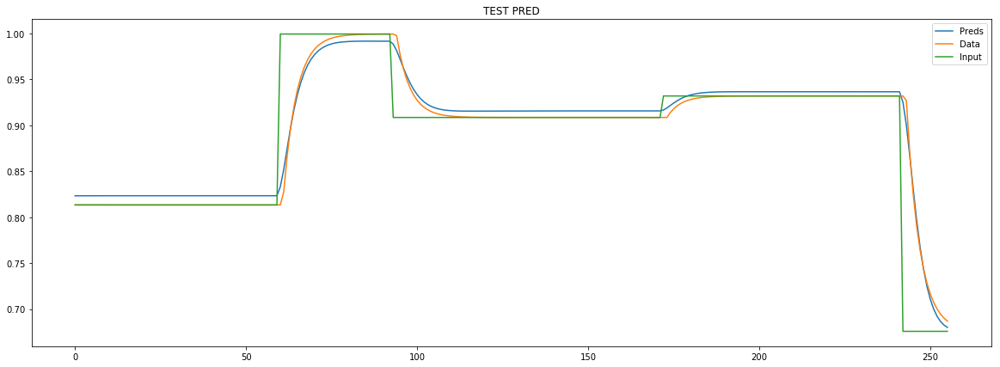

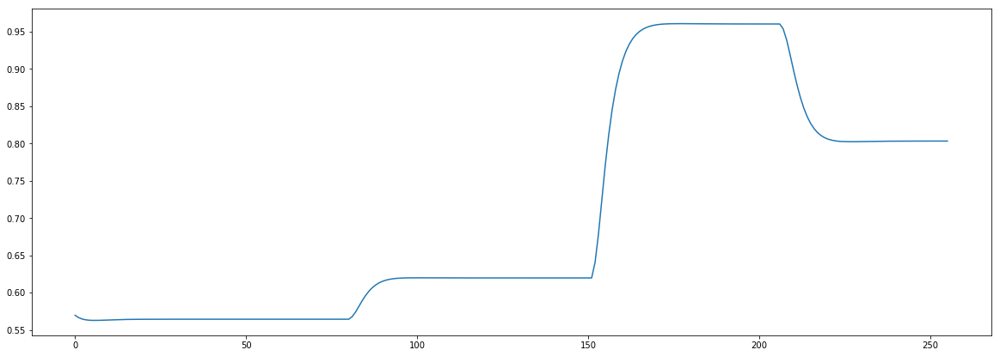

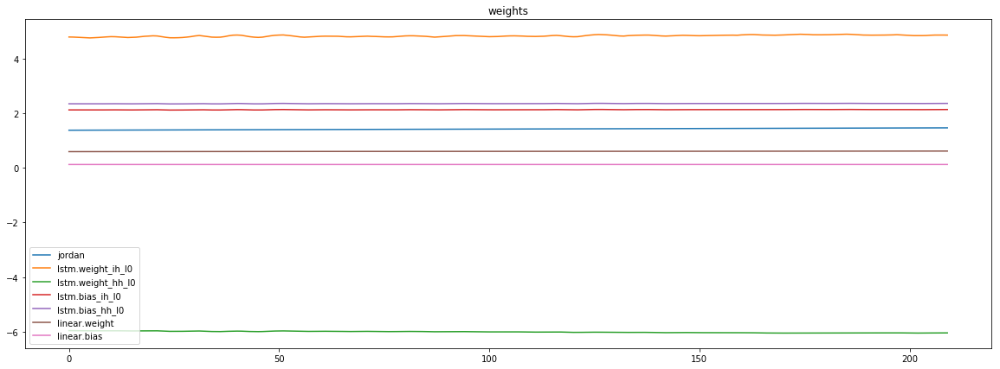

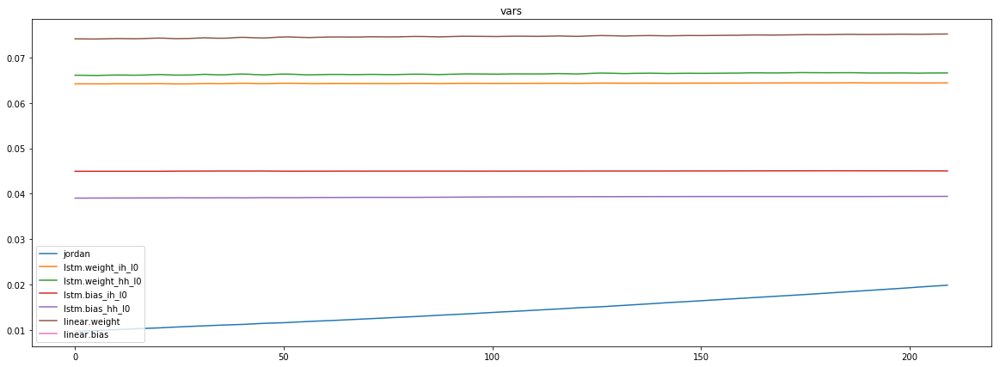

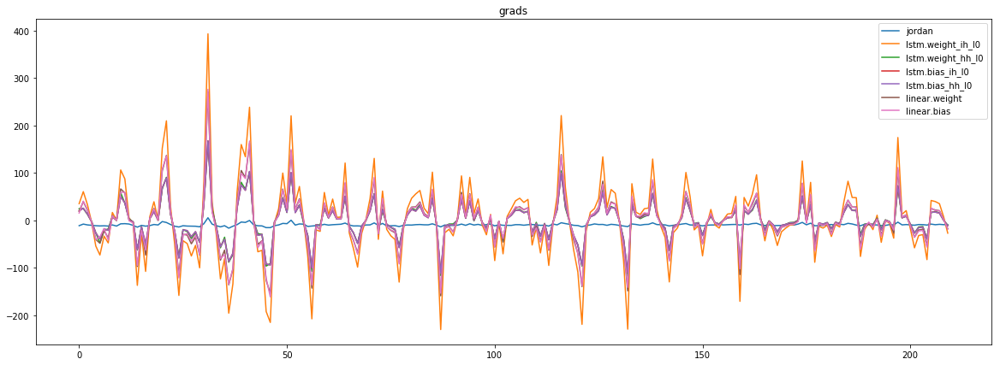

mean_p1 : -2.421341501531147
mean_p2 : -6.795833560398647


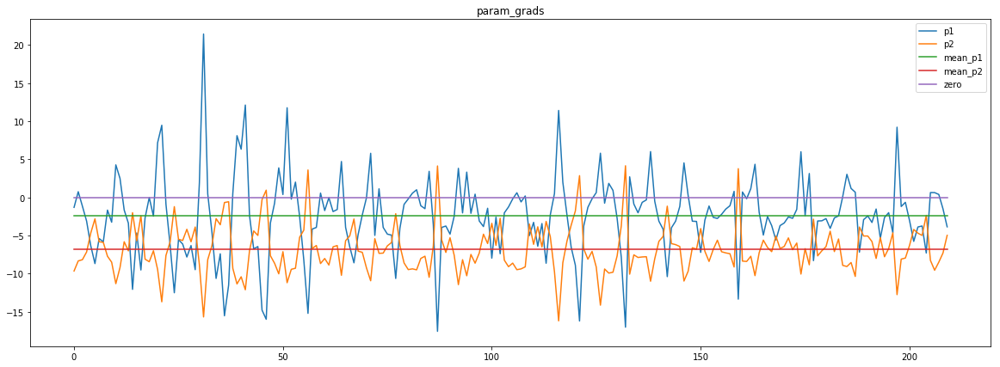

loss rate [0.409904874997586]
Epoch [14] 
     train_loss[2.104351835084838] 
     eval_train[1.6752251967537588] 
     eval_test[1.7481430535141922]


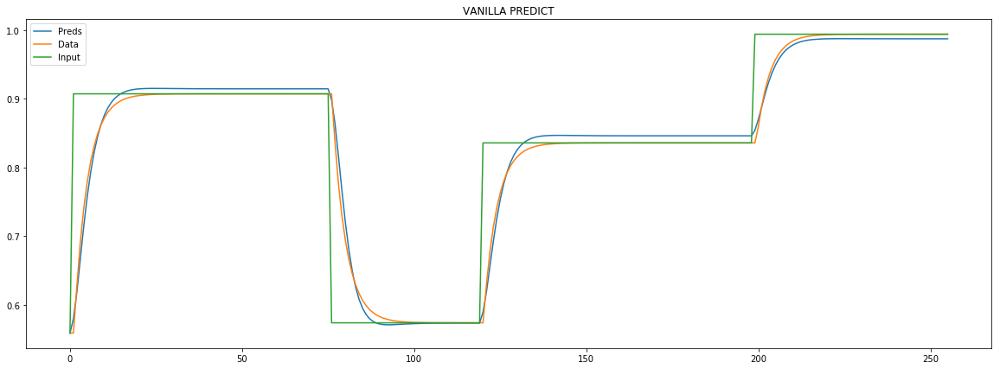

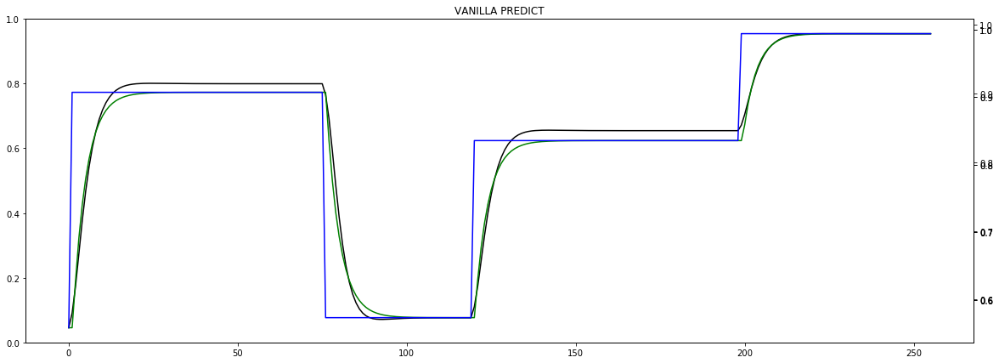


aux preds: 0.6400498747825623 0.9072973132133484
main loss 0.6338645718341771
aux loss 0.923594590028127
combined loss 1.5574591618623042 


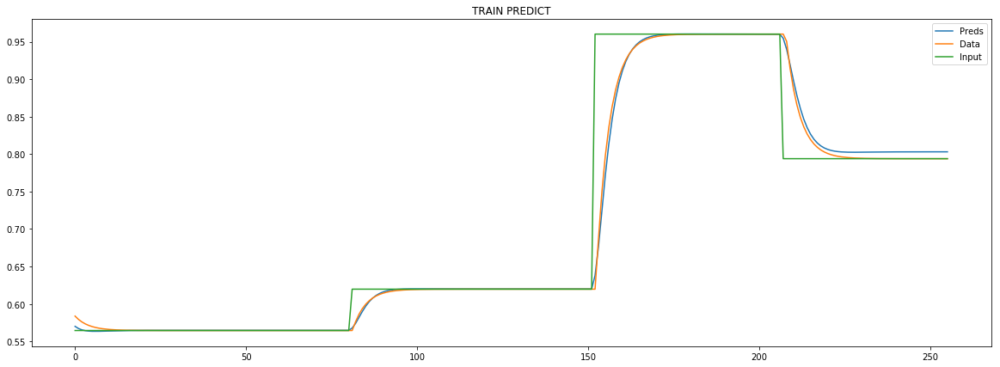

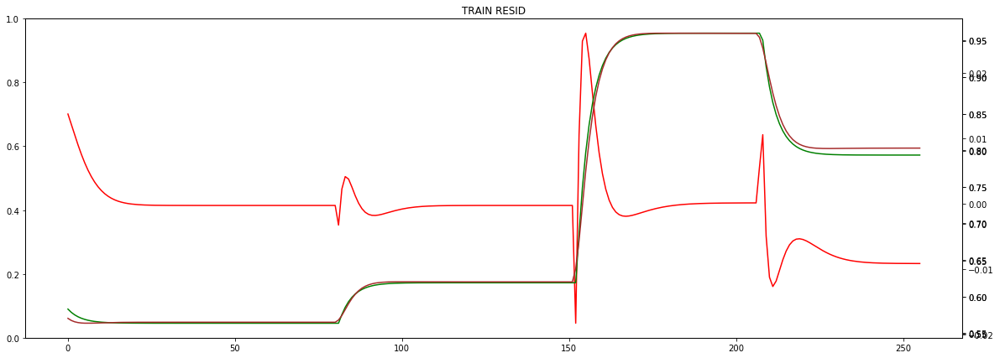


Parameter containing:
tensor([[0.6400, 0.9073]], requires_grad=True)


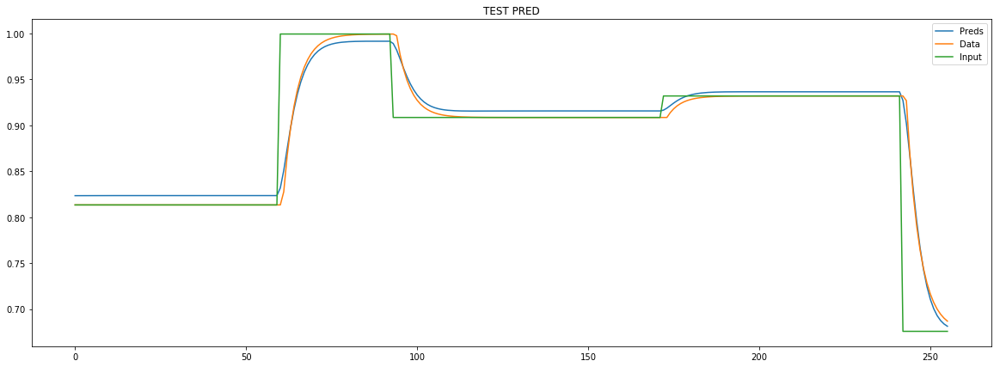

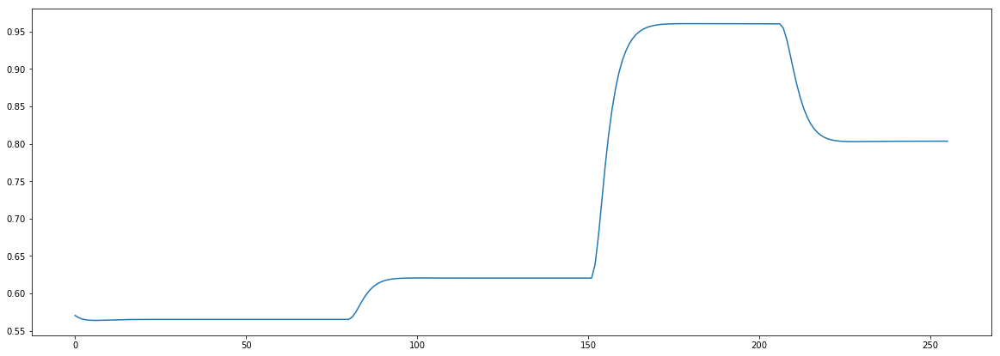

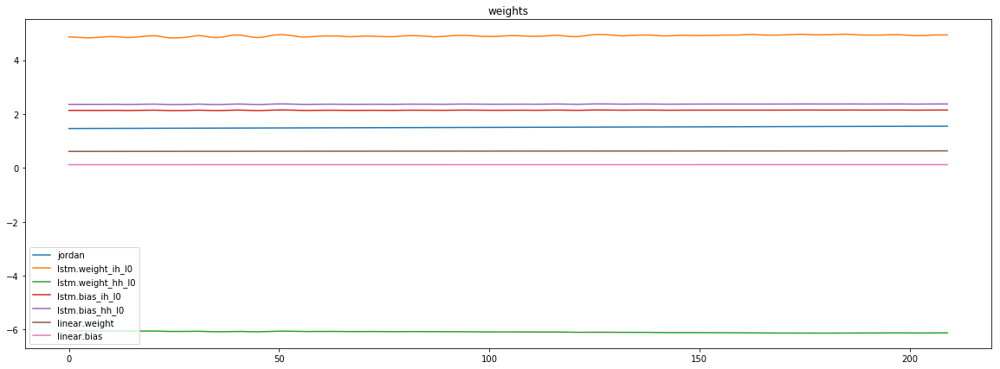

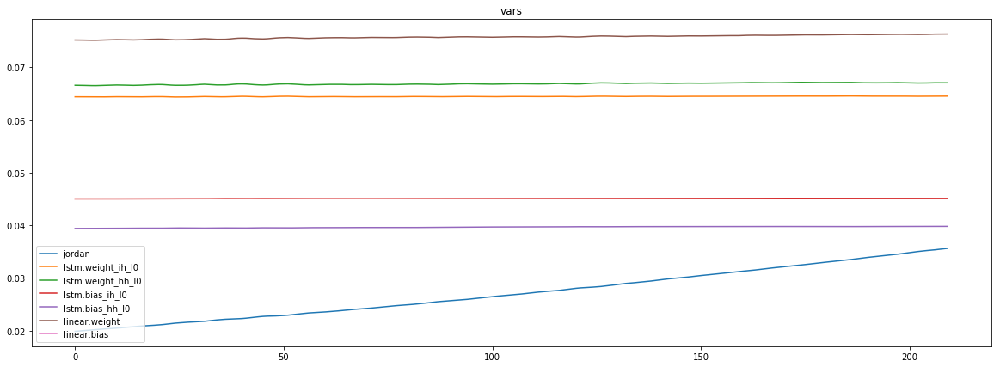

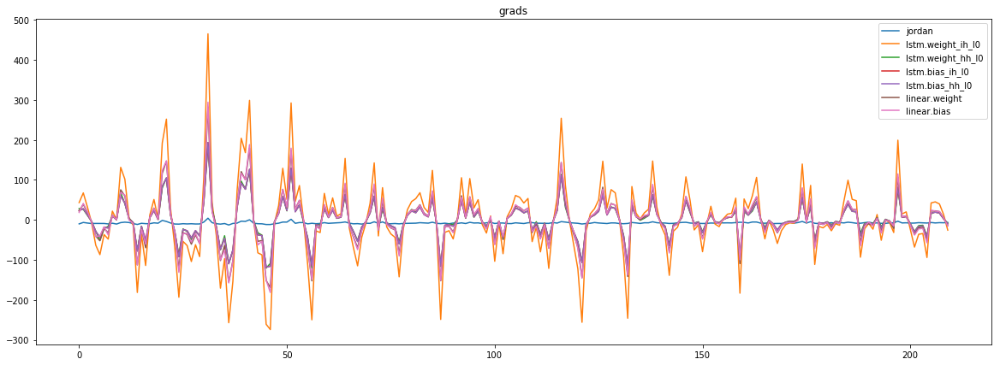

mean_p1 : -1.4233102727504003
mean_p2 : -6.45636168888637


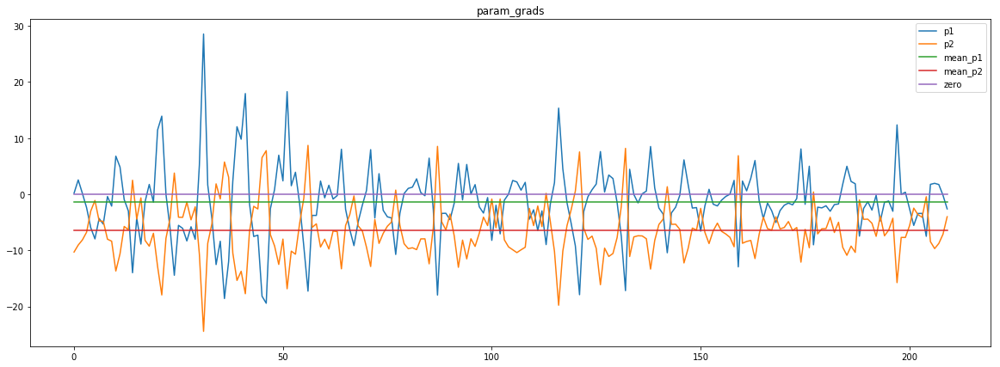

loss rate [0.4965664062052436]
Epoch [15] 
     train_loss[1.5574591618623042] 
     eval_train[1.1150616727286737] 
     eval_test[1.181936774099392]


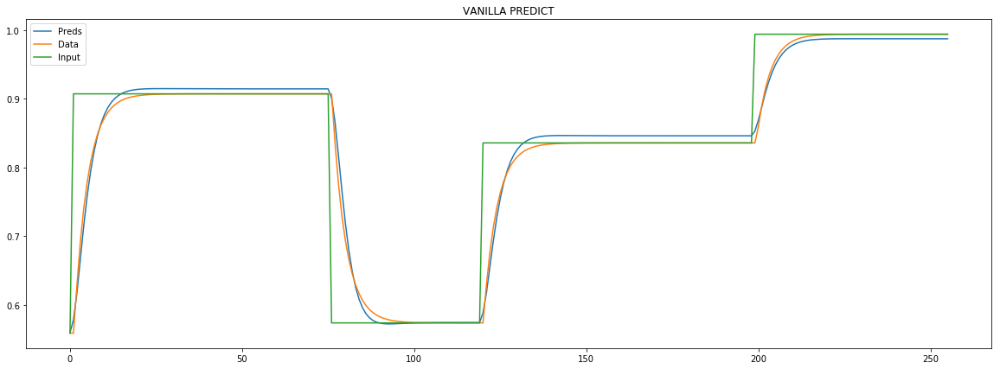

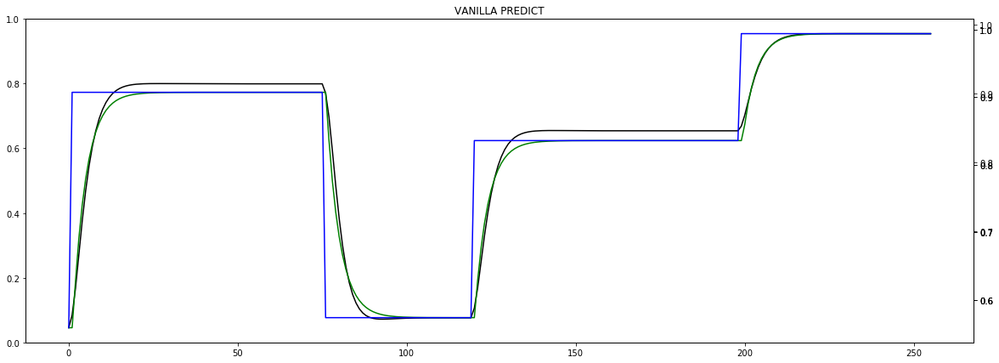


aux preds: 0.6429859399795532 0.9812102913856506
main loss 0.6289262234258959
aux loss 0.42469550254089494
combined loss 1.0536217259667908 


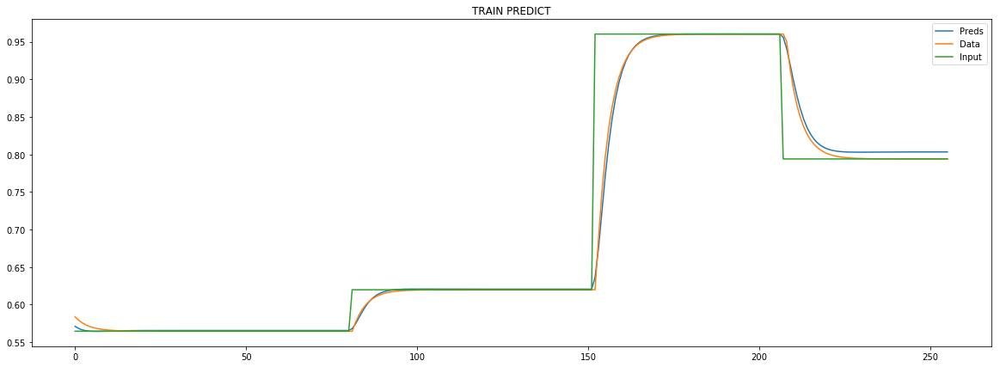

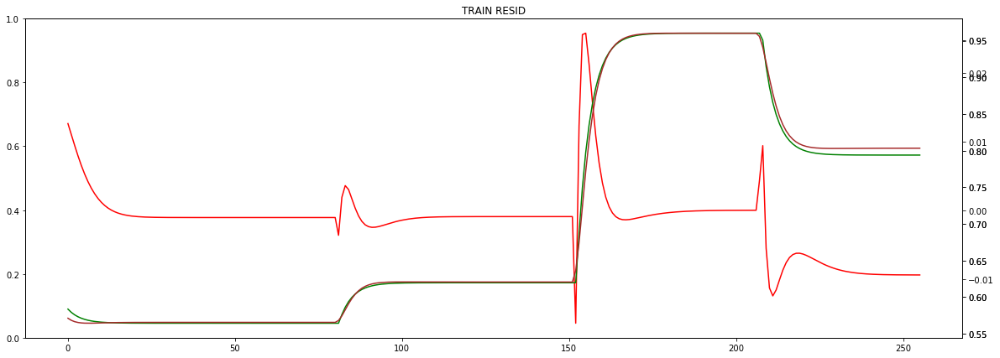


Parameter containing:
tensor([[0.6430, 0.9812]], requires_grad=True)


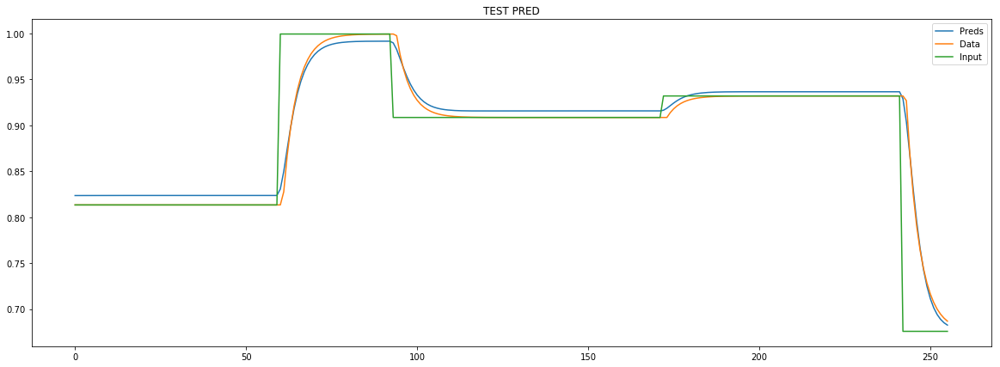

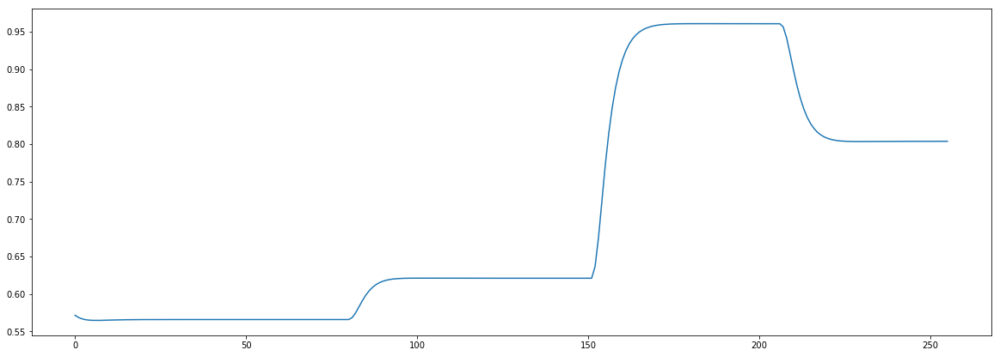

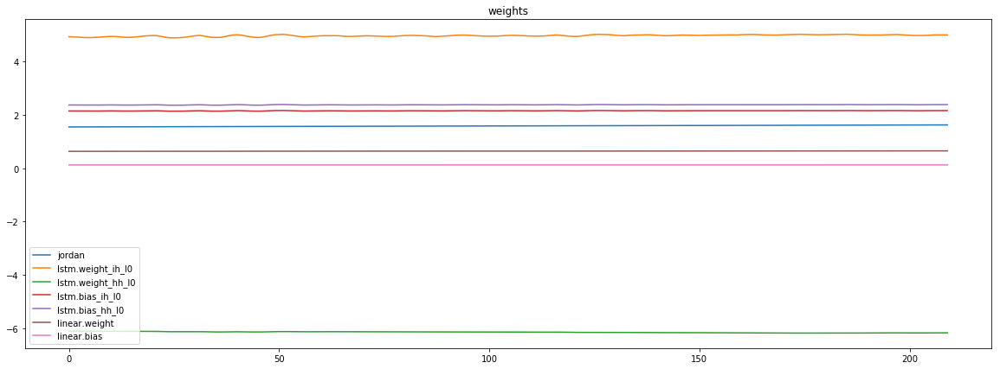

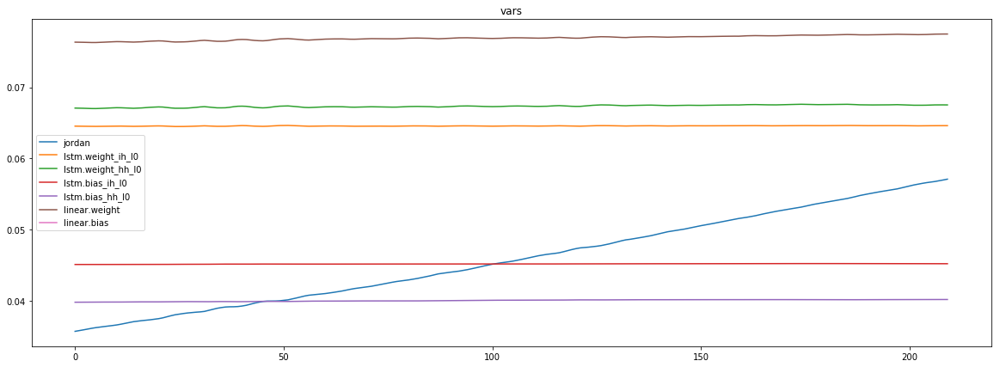

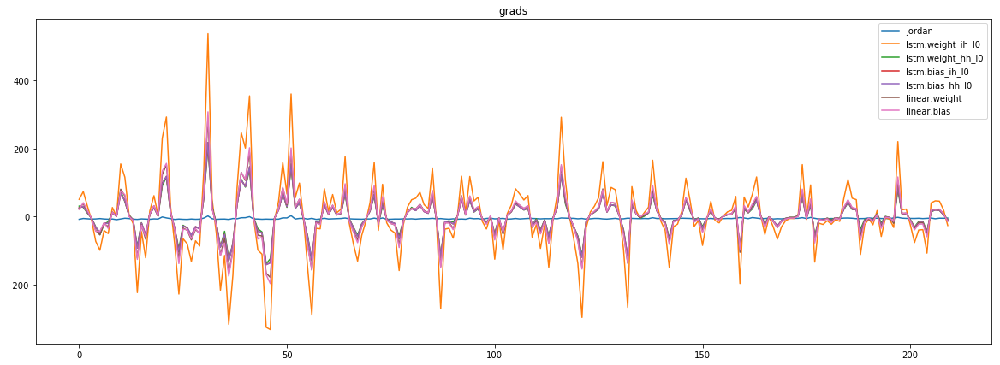

mean_p1 : -0.4093699839143526
mean_p2 : -5.72045819078173


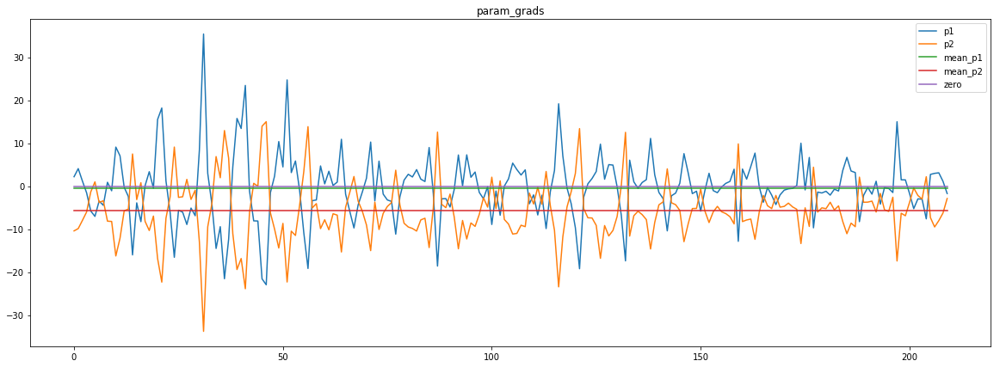

loss rate [0.5997533666991944]
Epoch [16] 
     train_loss[1.0536217259667908] 
     eval_train[0.6434030449740974] 
     eval_test[0.7032594575410646]


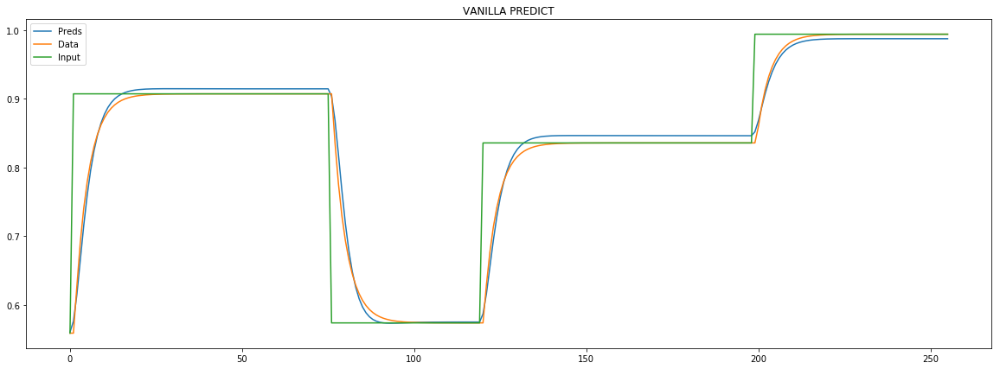

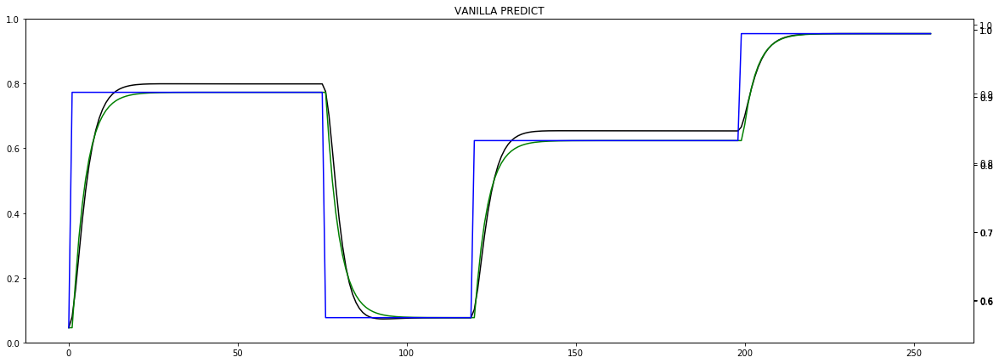


aux preds: 0.6417180895805359 0.9990109801292419
main loss 0.5853262855257656
aux loss 0.1785460490023806
combined loss 0.7638723345281462 


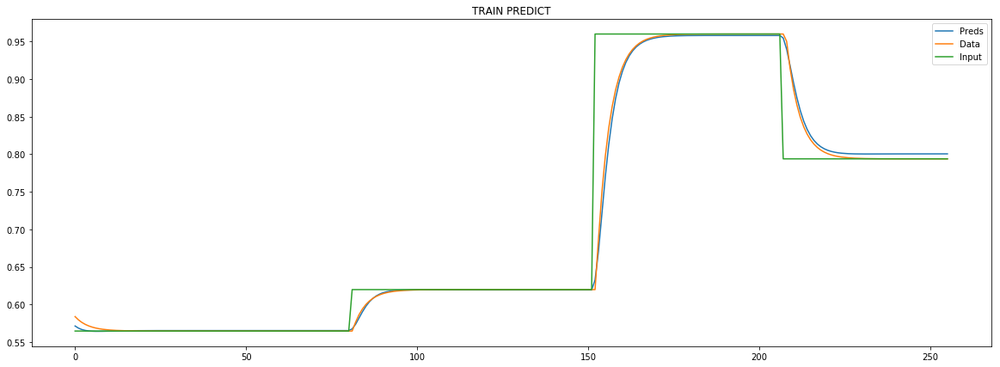

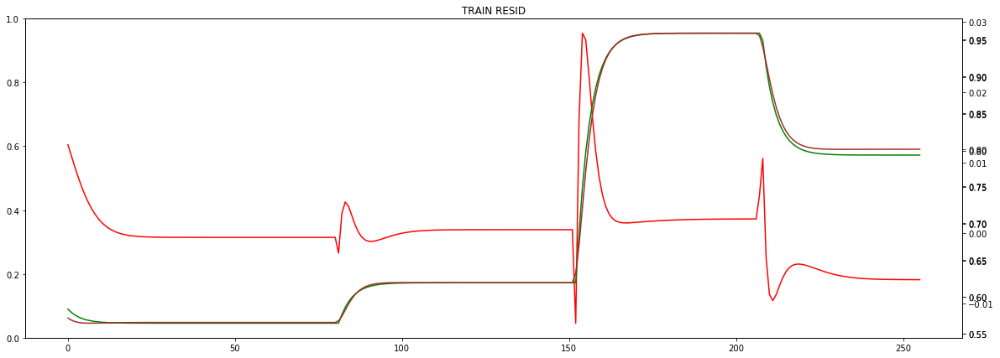


Parameter containing:
tensor([[0.6417, 0.9990]], requires_grad=True)


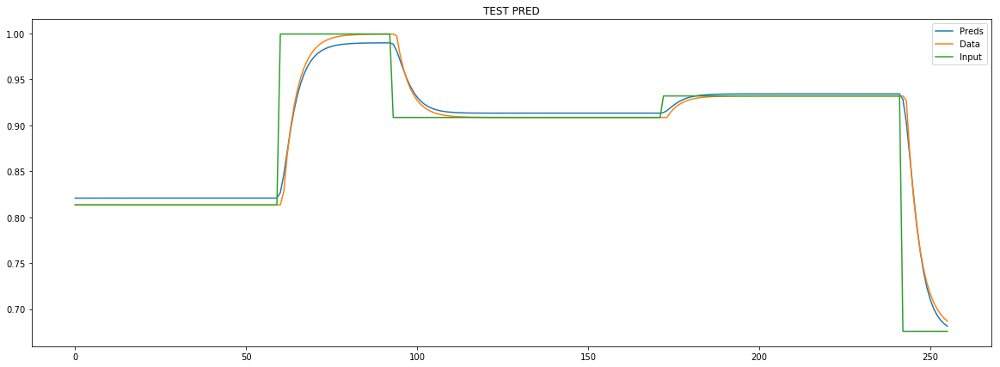

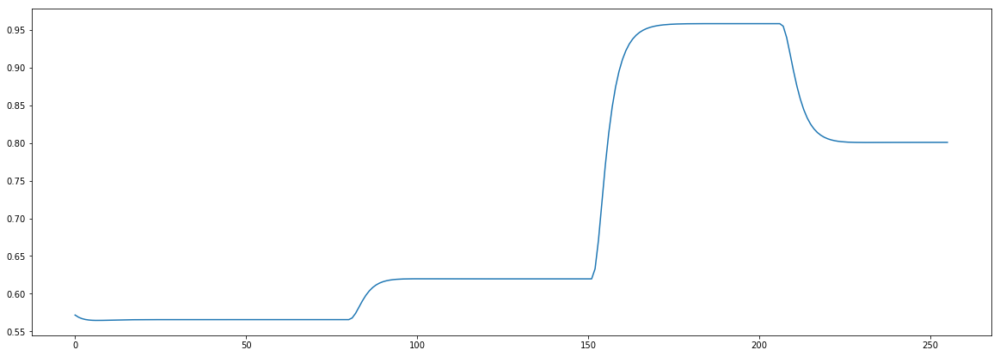

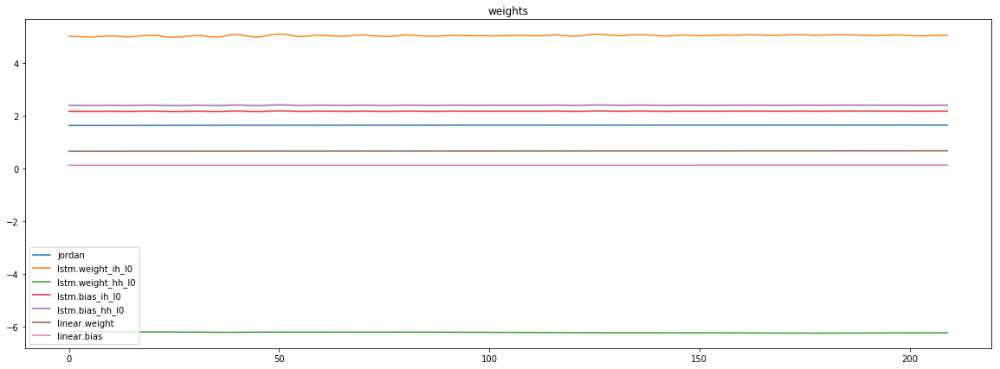

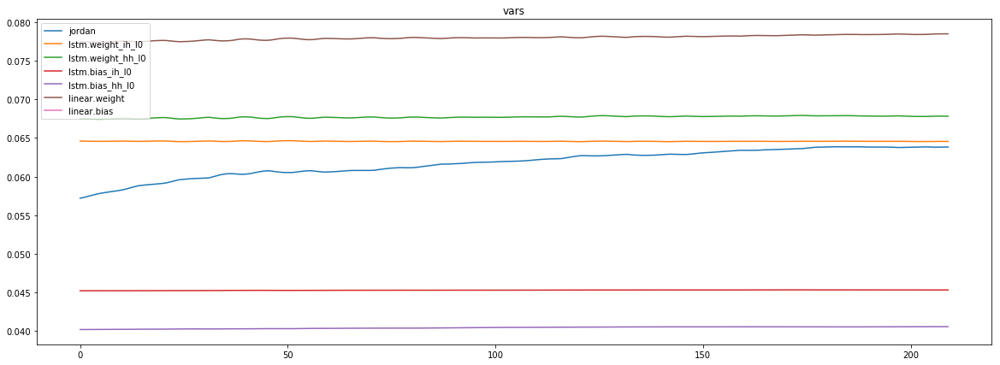

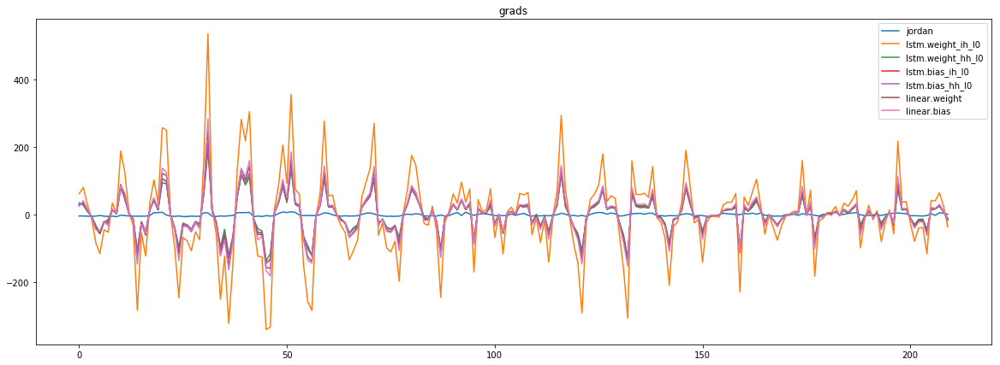

mean_p1 : 0.17983416460809254
mean_p2 : -1.0704992860555649


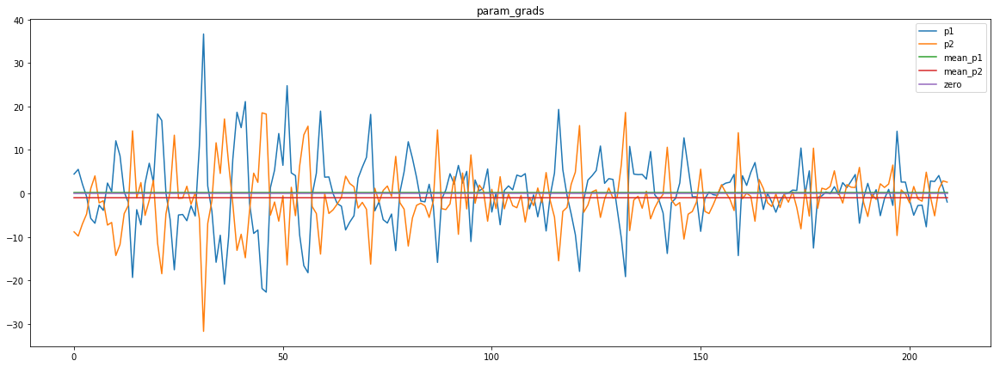

loss rate [0.5179113879137548]
Epoch [17] 
     train_loss[0.7638723345281462] 
     eval_train[0.5338690317396652] 
     eval_test[0.5838638310728783]


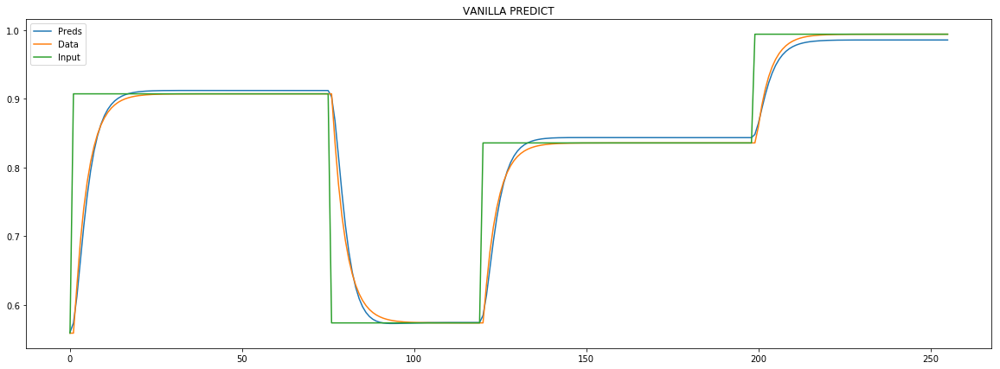

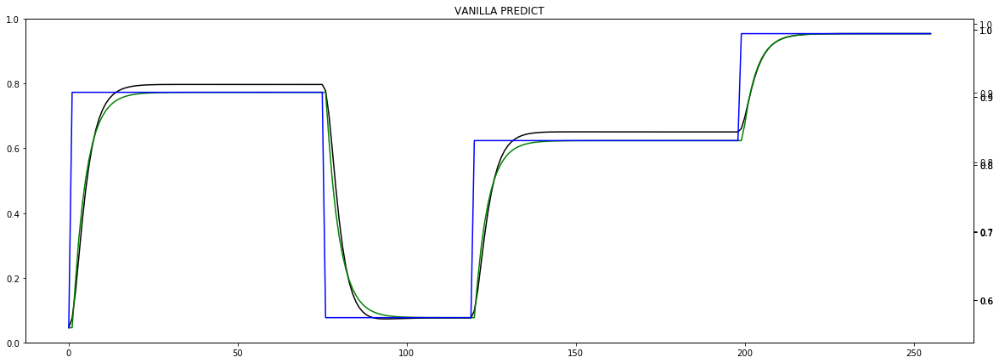


aux preds: 0.6400671601295471 0.9990842342376709
main loss 0.5292838448118086
aux loss 0.16769354998888003
combined loss 0.6969773948006885 


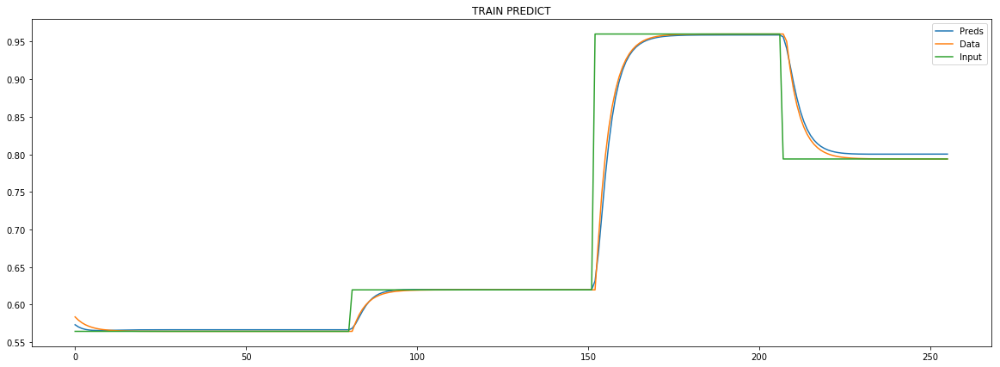

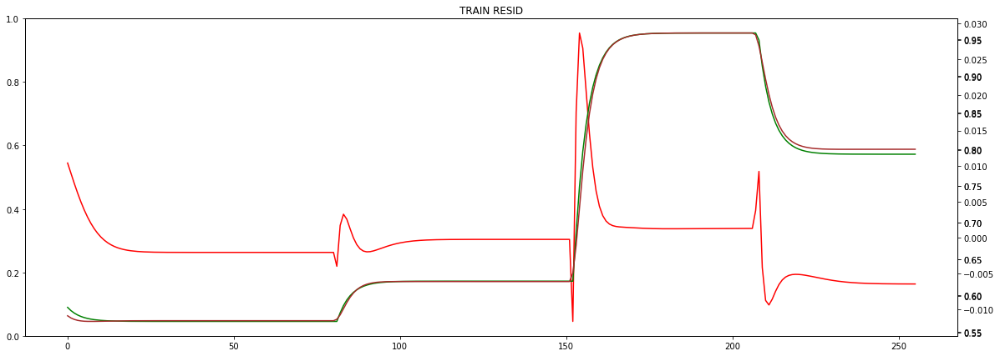


Parameter containing:
tensor([[0.6401, 0.9991]], requires_grad=True)


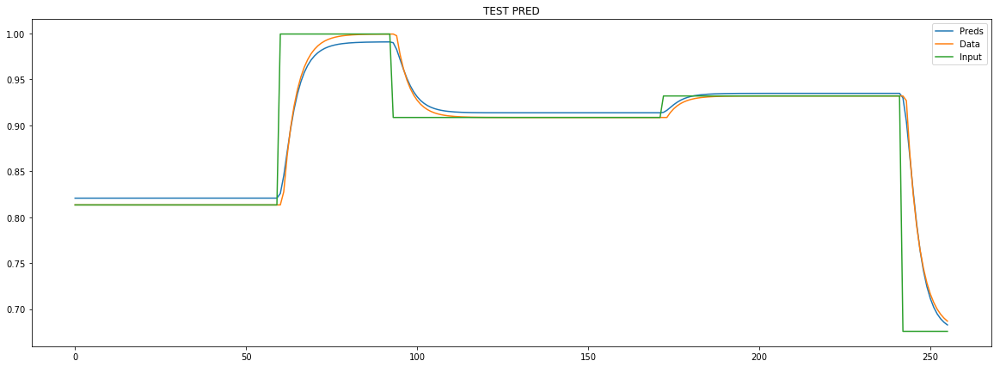

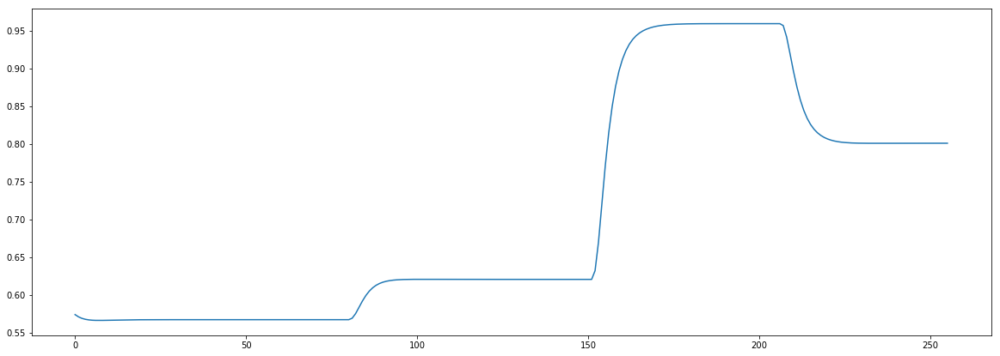

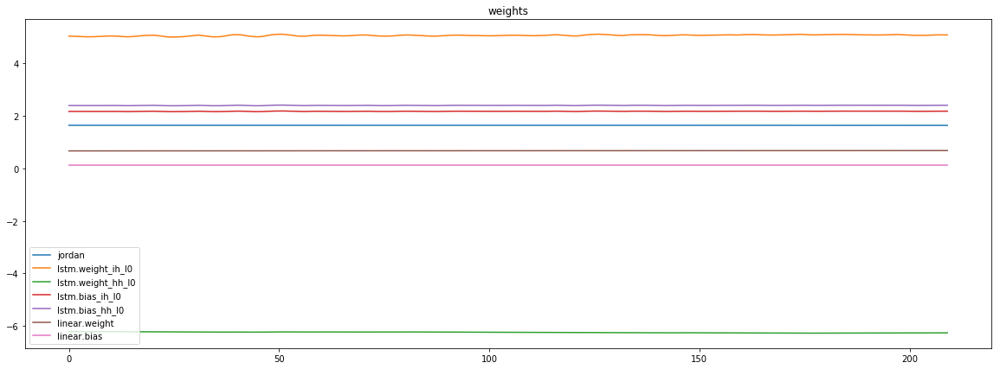

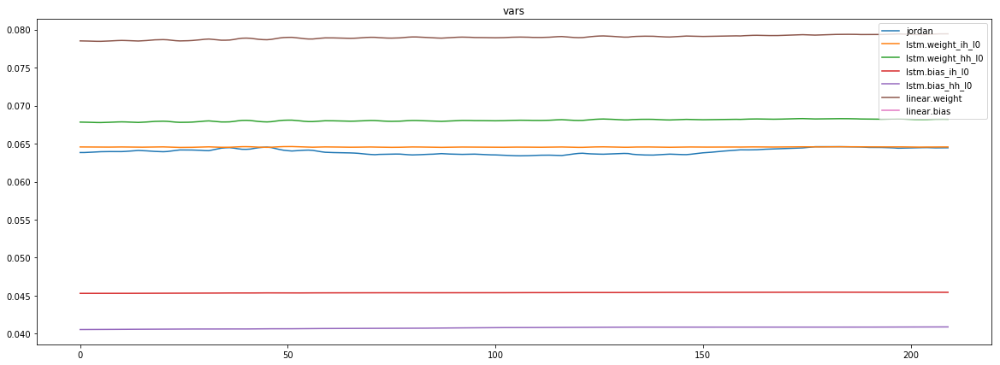

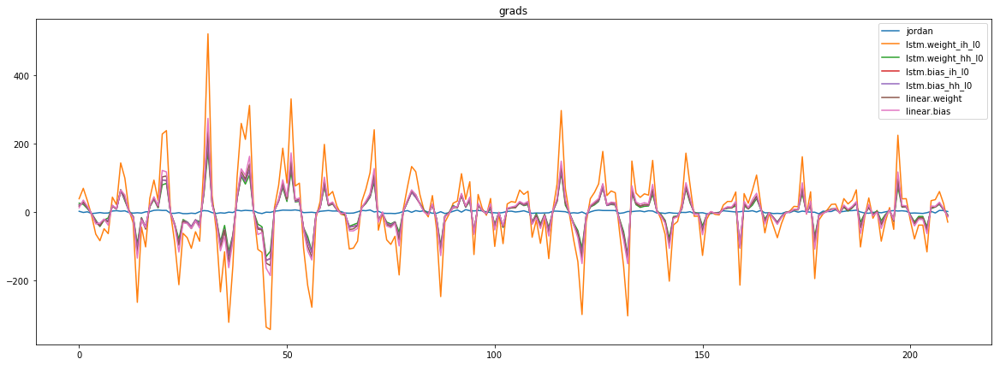

mean_p1 : 0.202377806249119
mean_p2 : 0.0009340289802778335


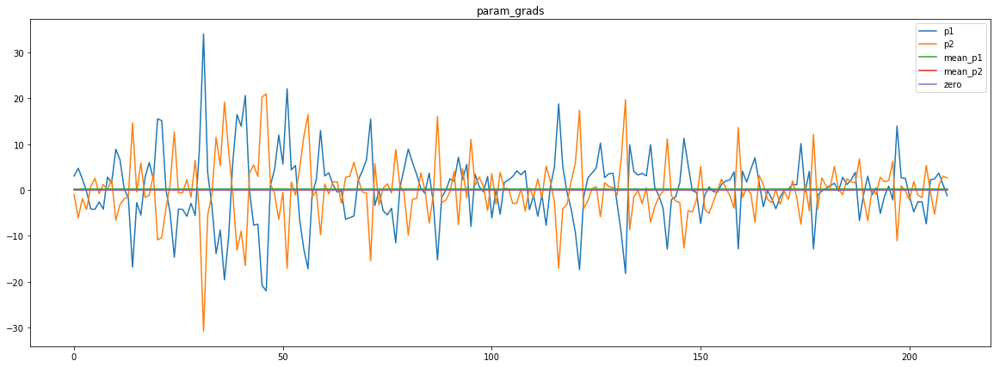

loss rate [0.3168078555053895]
Epoch [18] 
     train_loss[0.6969773948006885] 
     eval_train[0.5186181338333837] 
     eval_test[0.5622808130437069]


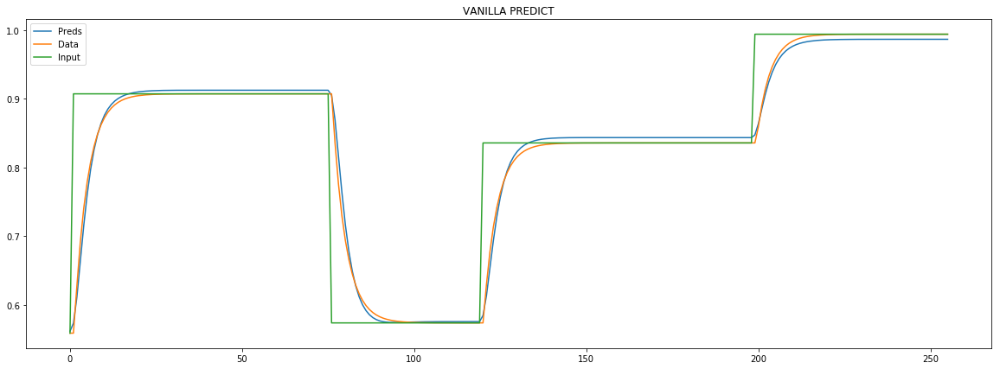

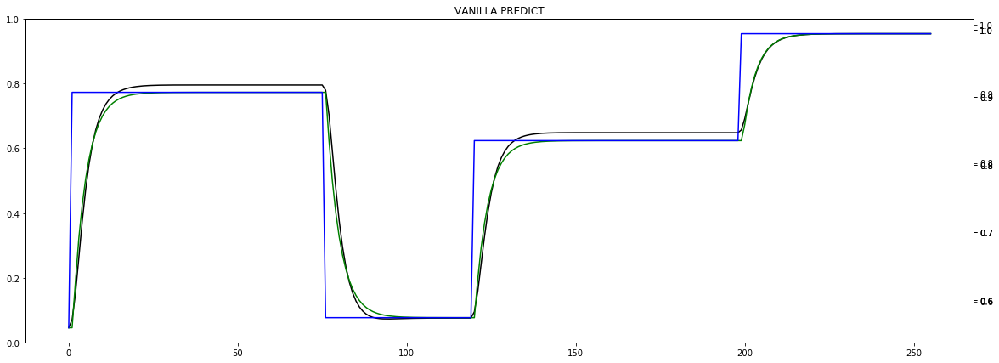


aux preds: 0.6381348967552185 0.9990774393081665
main loss 0.5093356306100586
aux loss 0.16571339074344862
combined loss 0.6750490213535072 


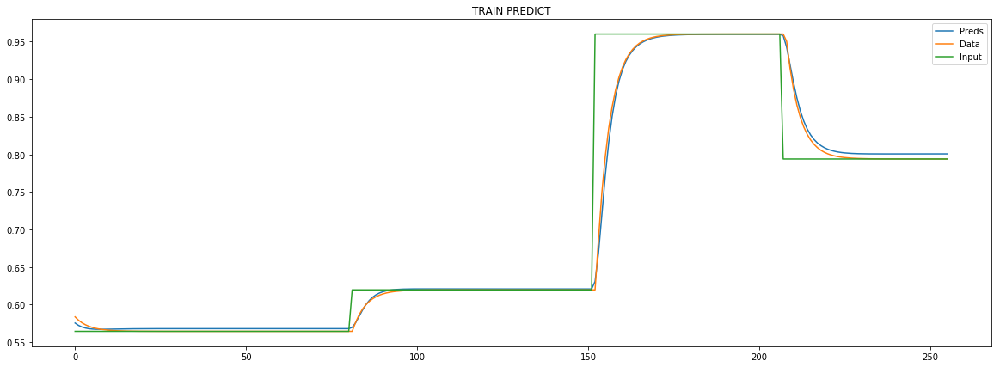

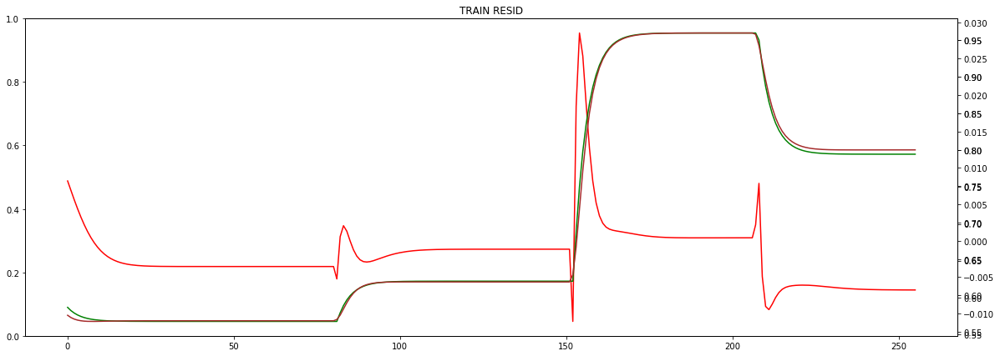


Parameter containing:
tensor([[0.6381, 0.9991]], requires_grad=True)


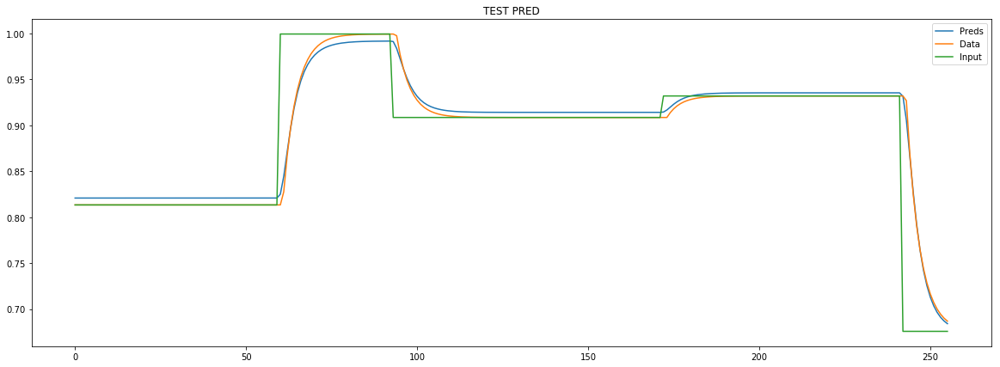

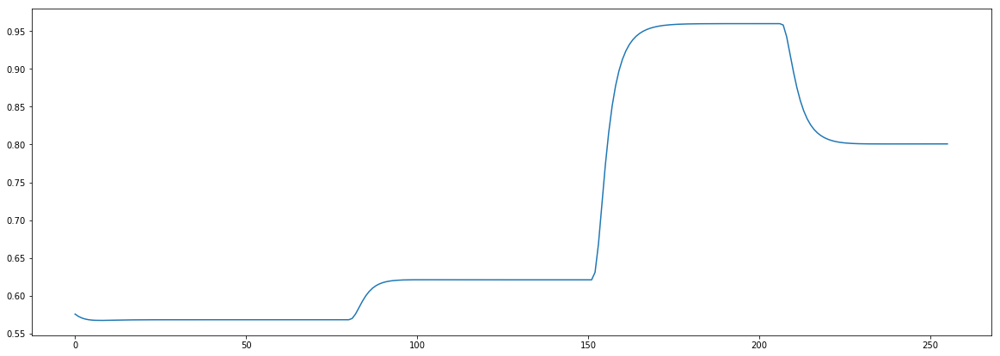

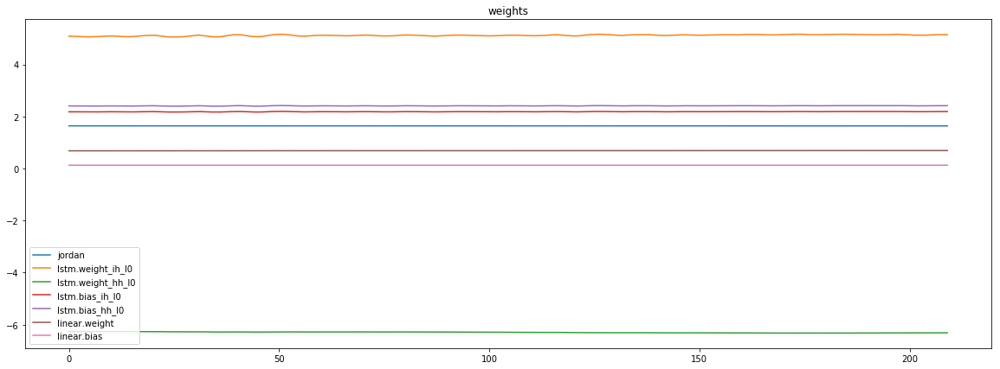

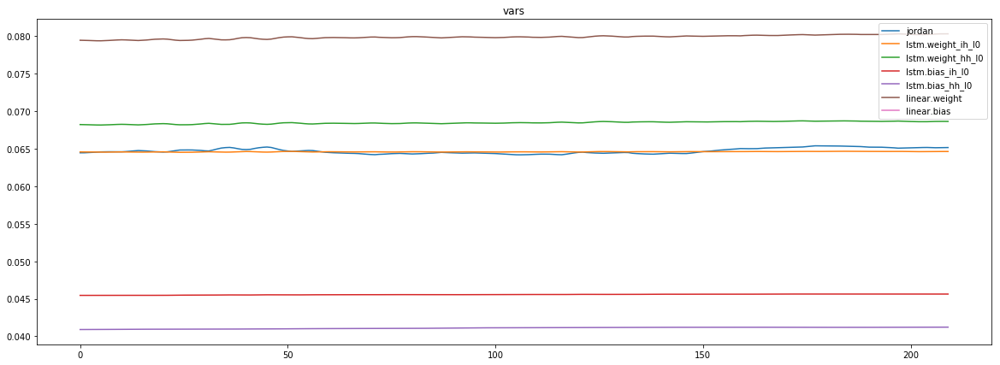

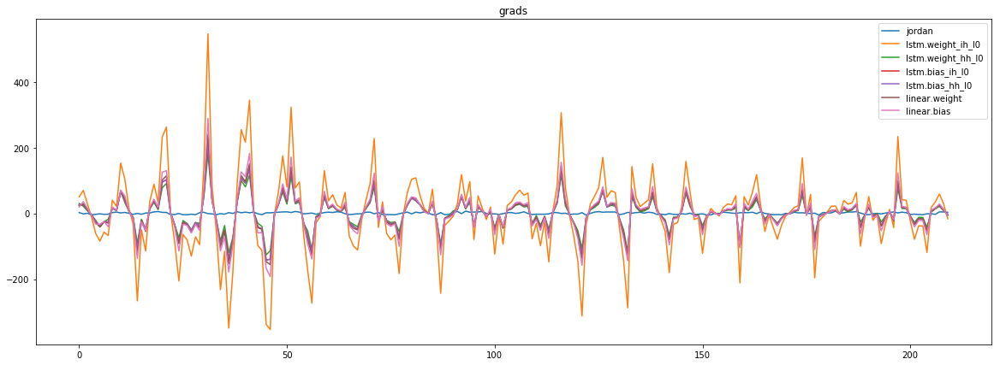

mean_p1 : 0.21753794501225154
mean_p2 : -0.001121840306690761


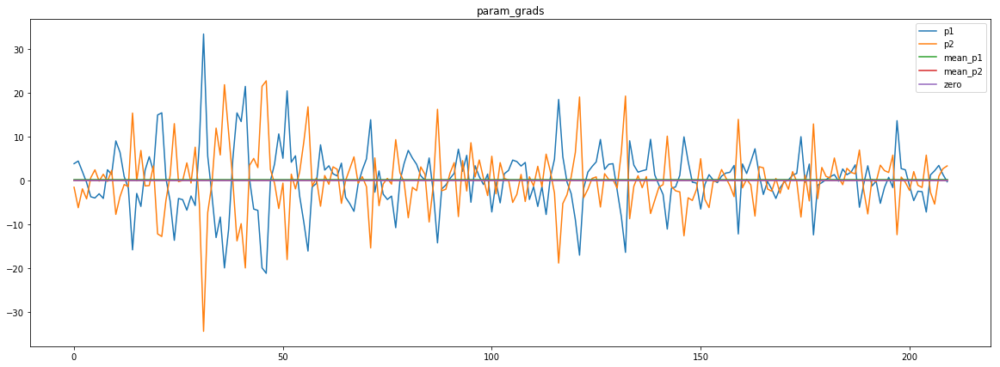

loss rate [0.10704283967019956]
Epoch [19] 
     train_loss[0.6750490213535072] 
     eval_train[0.5113408208742234] 
     eval_test[0.5504795449728335]


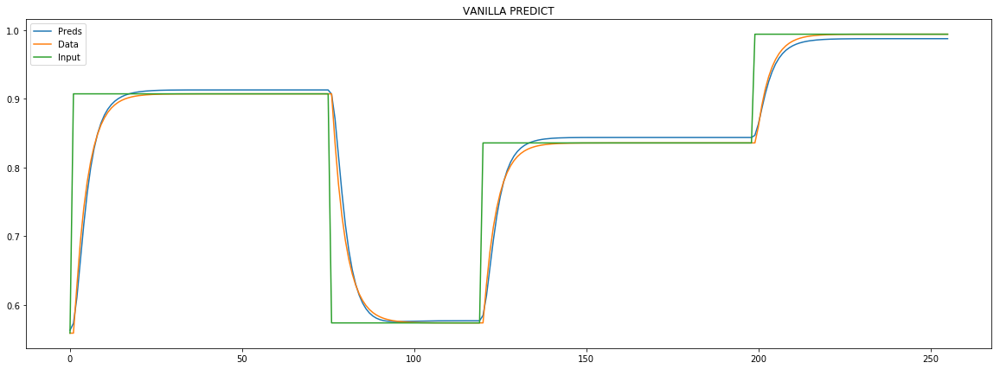

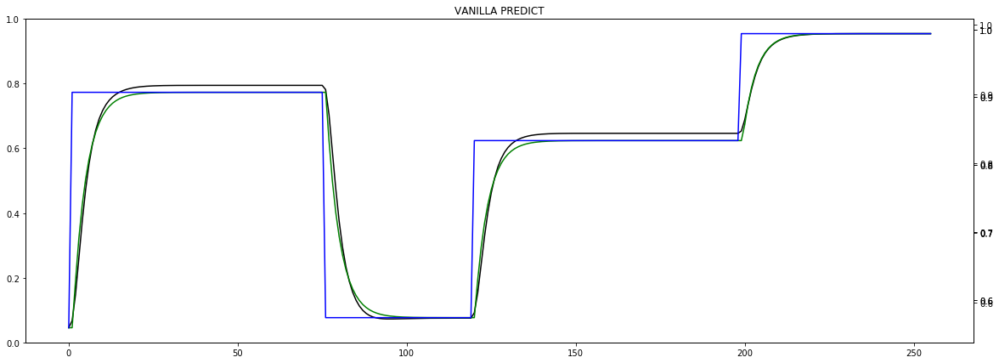


aux preds: 0.6359212398529053 0.999293863773346
main loss 0.49792617998346467
aux loss 0.16455903884378217
combined loss 0.6624852188272469 


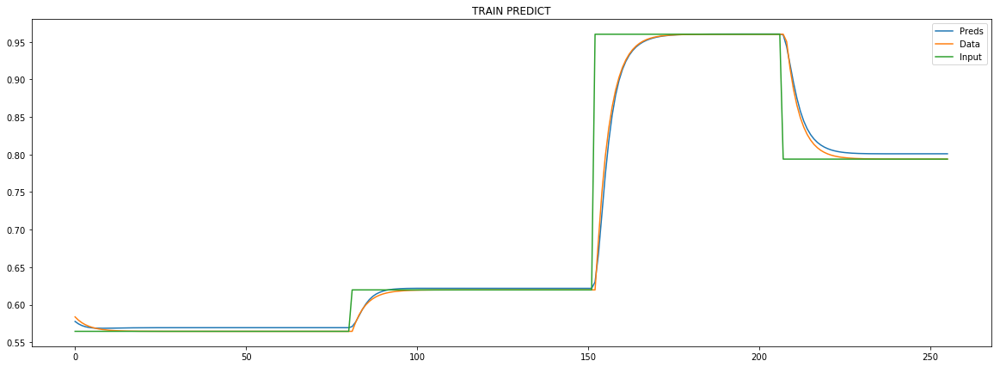

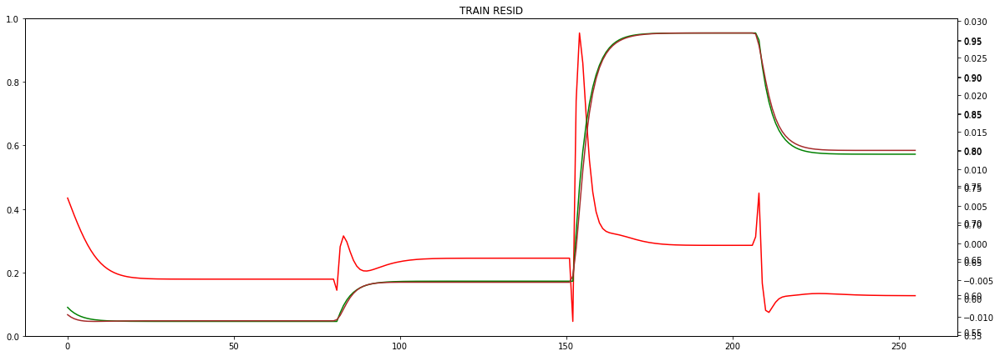


Parameter containing:
tensor([[0.6359, 0.9993]], requires_grad=True)


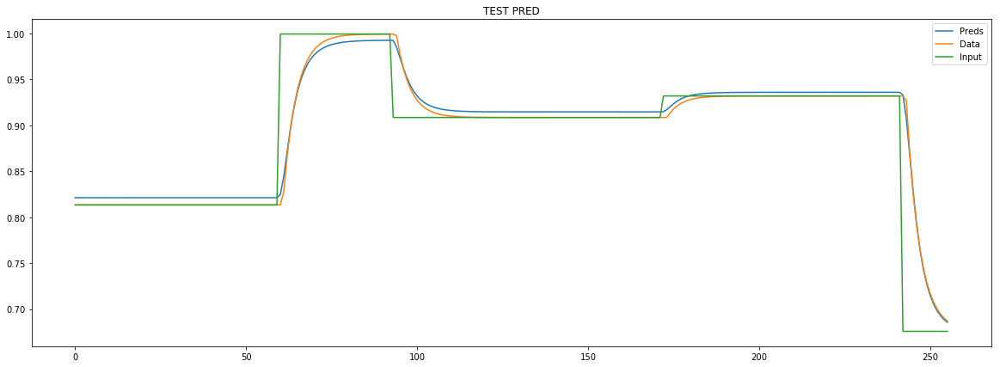

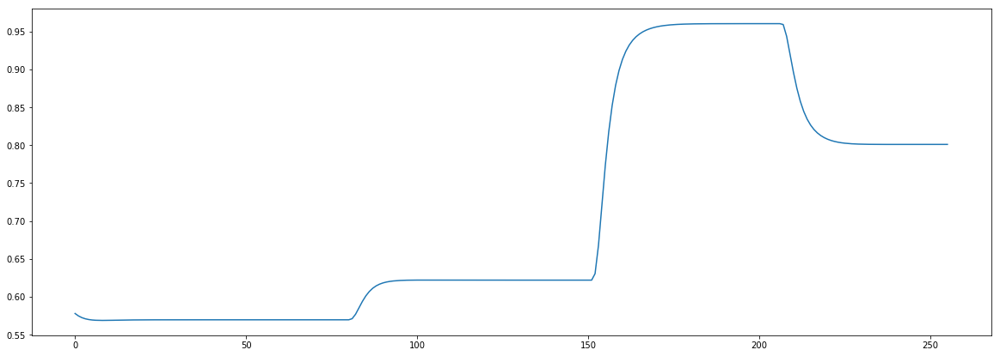

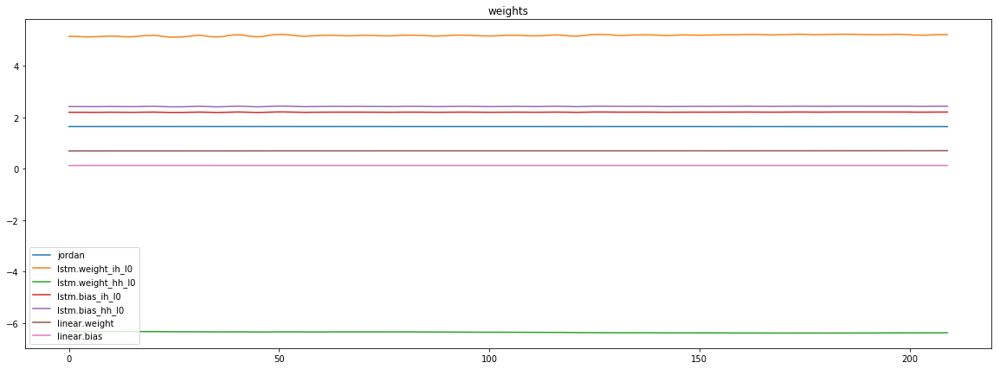

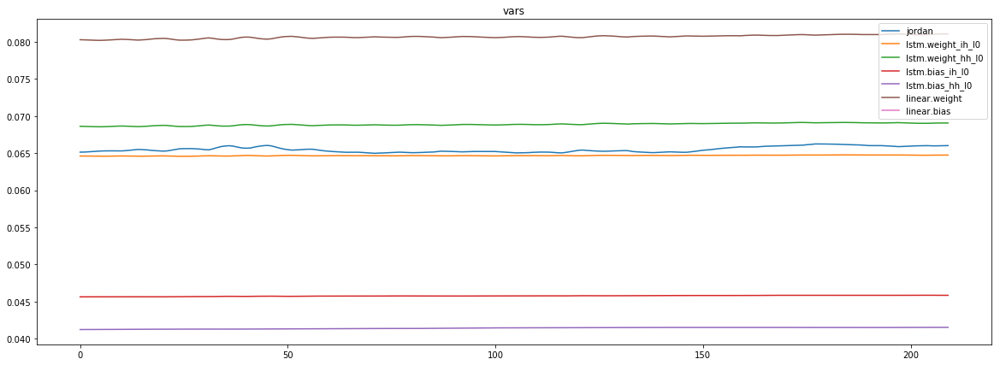

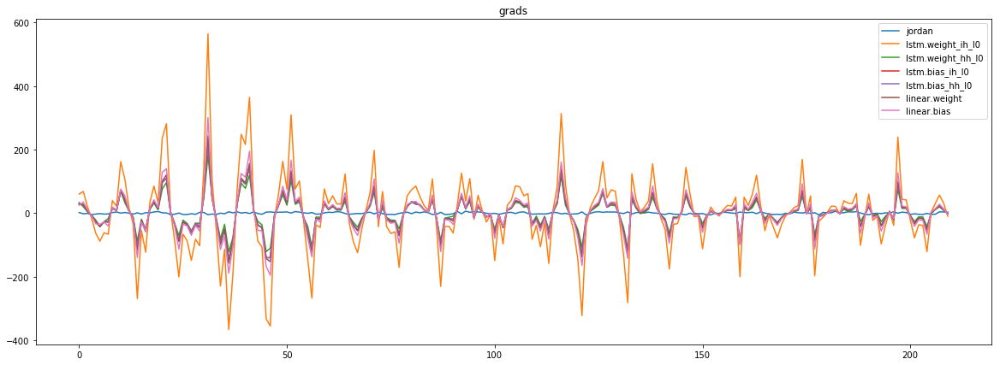

mean_p1 : 0.22448658872218358
mean_p2 : -0.018044131142752513


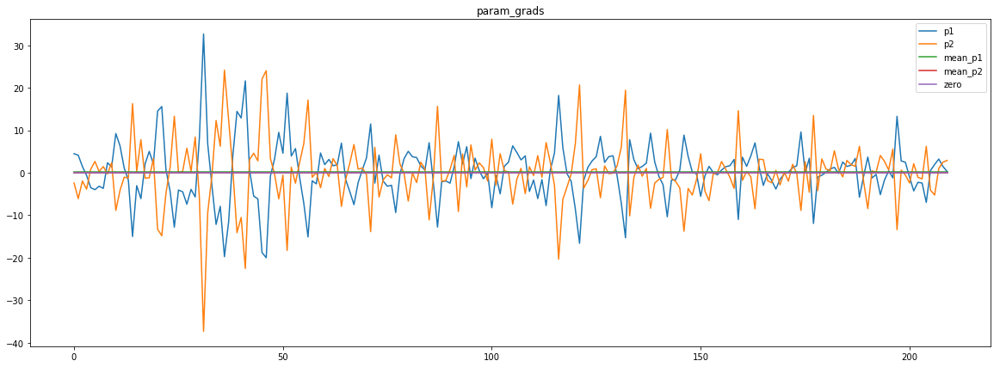

loss rate [0.028750933908154974]
Epoch [20] 
     train_loss[0.6624852188272469] 
     eval_train[0.5136196559739932] 
     eval_test[0.5492815530539773]


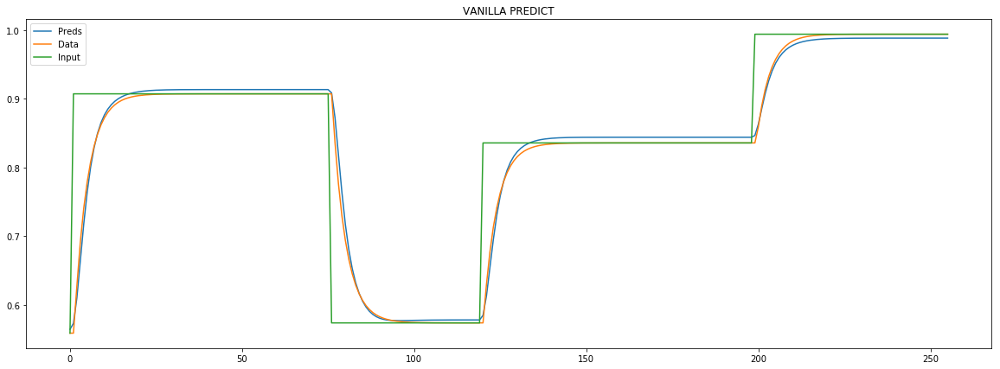

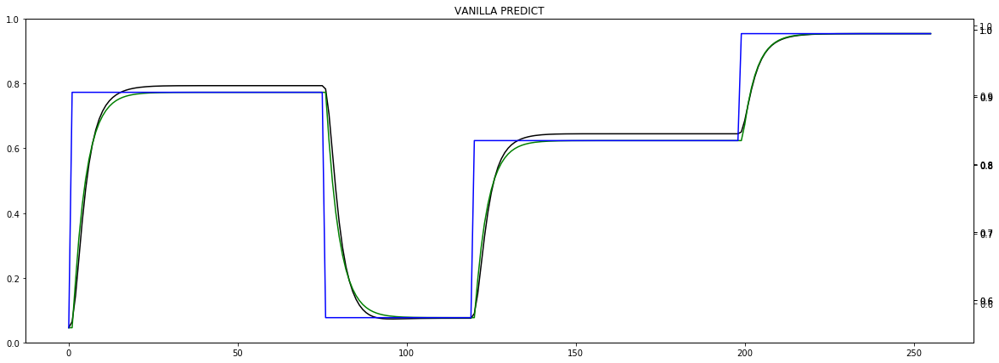


aux preds: 0.6333836913108826 0.999193012714386
main loss 0.49905077876146176
aux loss 0.16430157552517596
combined loss 0.6633523542866377 


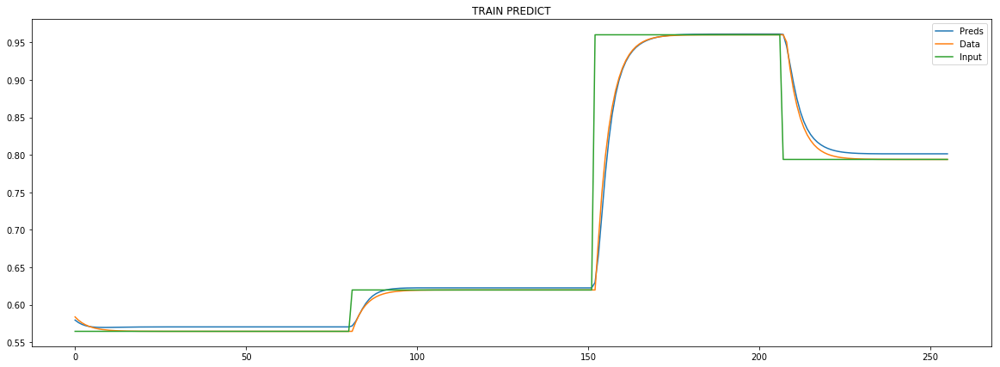

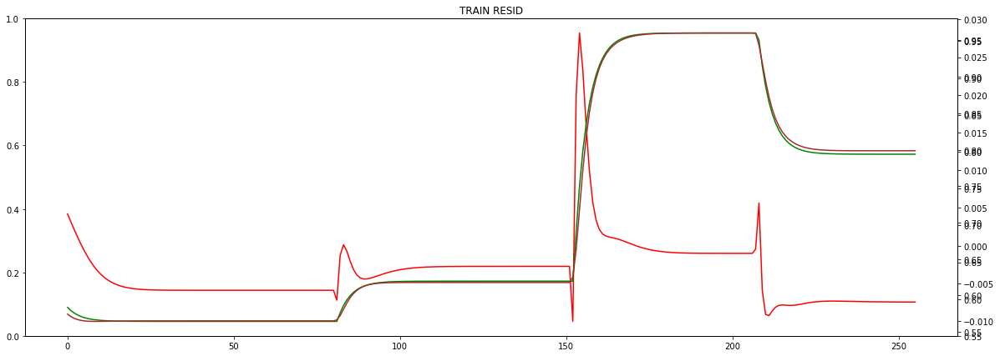


Parameter containing:
tensor([[0.6334, 0.9992]], requires_grad=True)


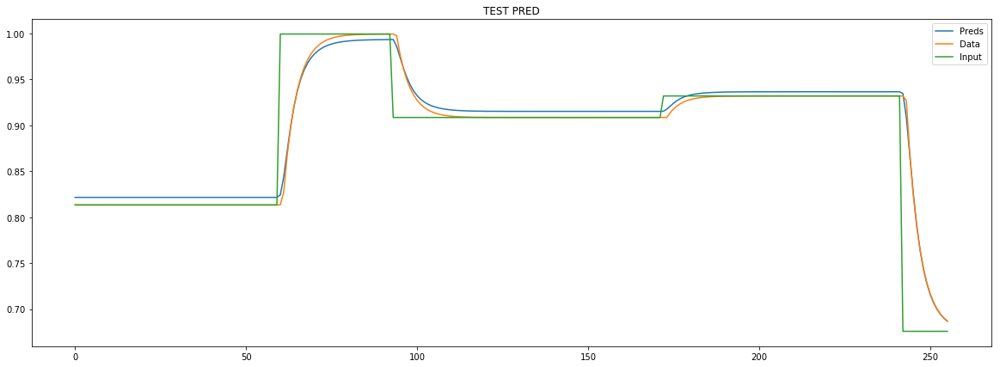

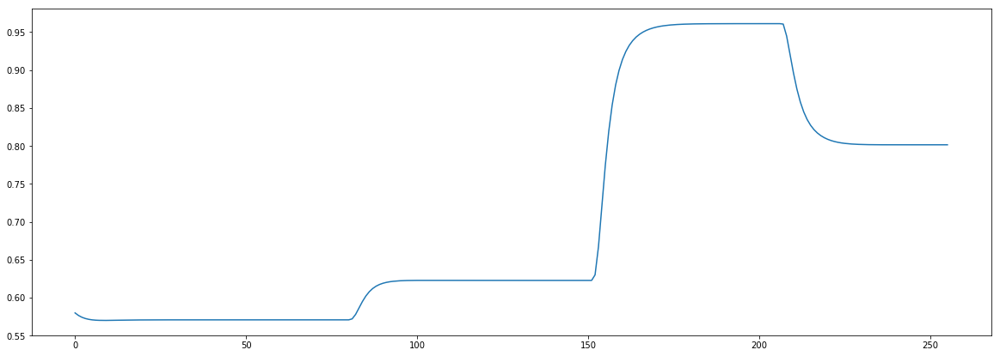

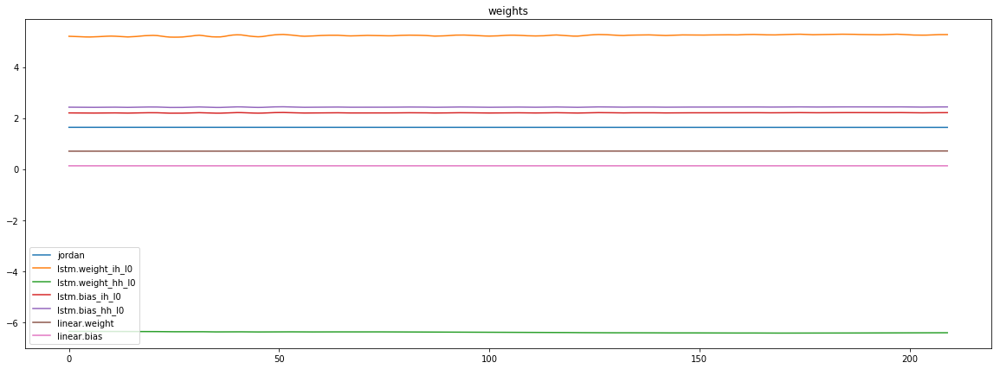

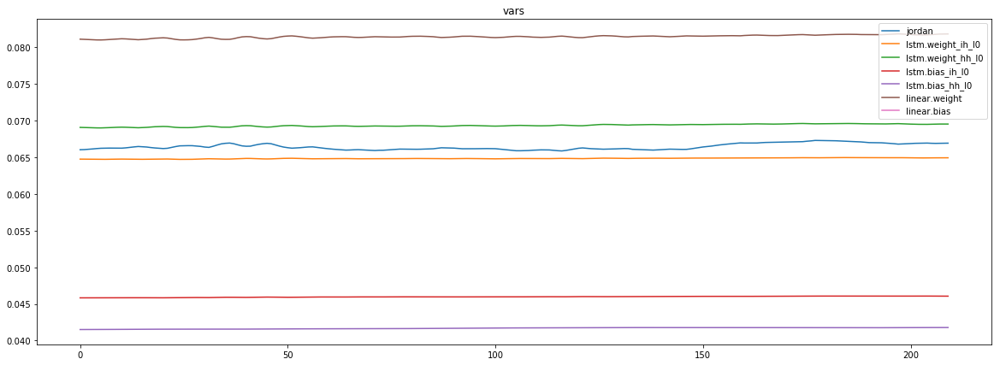

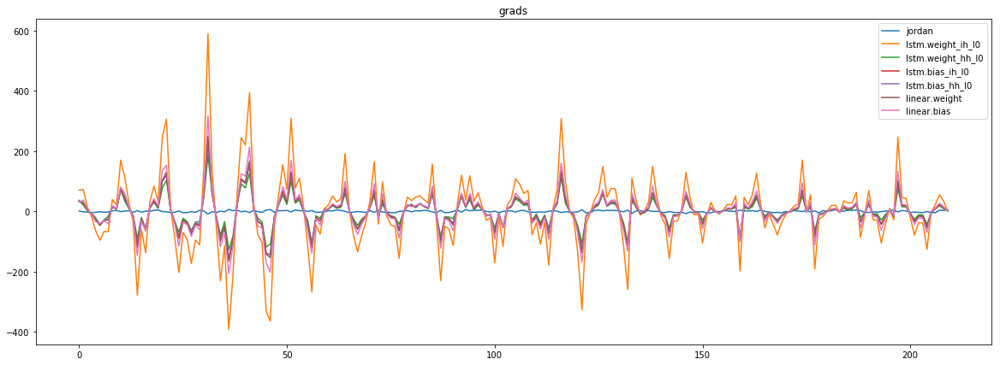

mean_p1 : 0.23416747255694298
mean_p2 : 0.013296842646031152


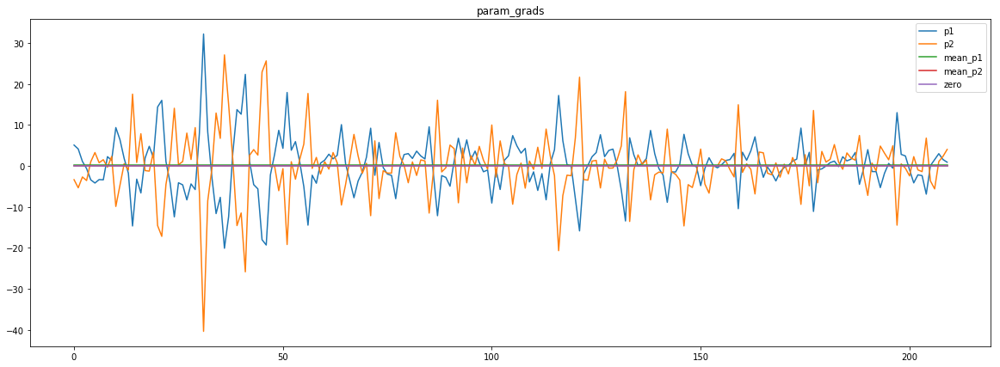

loss rate [0.005130743279335714]
Epoch [21] 
     train_loss[0.6633523542866377] 
     eval_train[0.5181682903502536] 
     eval_test[0.5511714669017728]


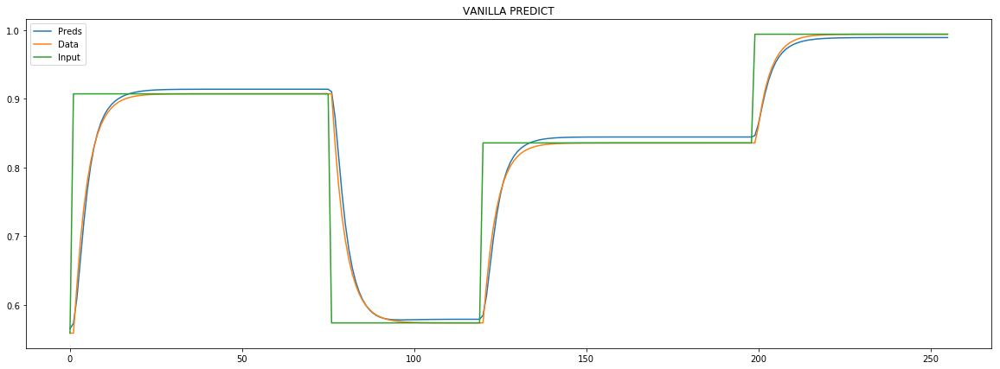

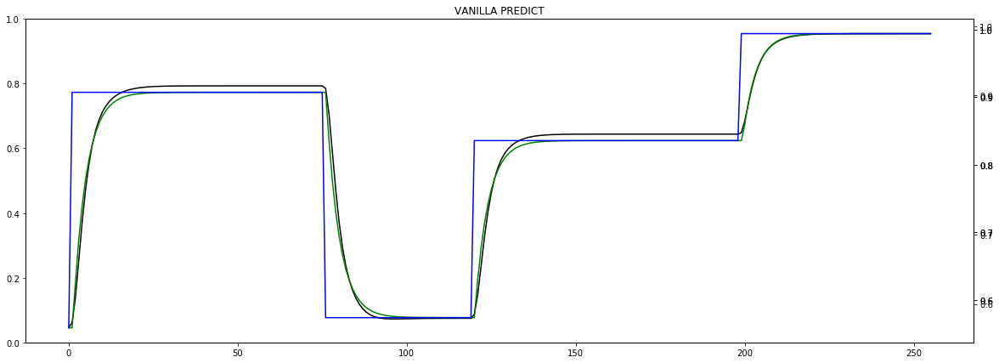

KeyboardInterrupt: 

In [19]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()


for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0]
    hist['mean_params_sample']['2'][t] = jordan[:, 1]
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} {hist['mean_params_sample']['2'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
    x_batch, y_batch, indexes = data
    plot_shared_scale([
        (y_pred[:, 0].detach().numpy(),"Preds" ),
         (y_batch[:, 0].detach().numpy(), "Data"),
         (x_batch[-1].detach().numpy(), "Input")
        ],
        title="TRAIN PREDICT")
          
    residuals = y_batch[:, 0] - y_pred[:, 0]
    plot_multiscale([
        (residuals.detach().numpy(), "Red"),
        (y_batch[:, 0].detach().numpy(), "Green"),
        (y_pred[:, 0].detach().numpy(), "Brown")
    ],
        title="TRAIN RESID"
    ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(),"Preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    # /VISUALISE ITERATION PRED
    plt.plot(y_pred.detach().numpy())
    plt.show()
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k)for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
    if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
          print("Loss critically low, EARLY STOPPING")
          break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [20]:
s, e = 3, t

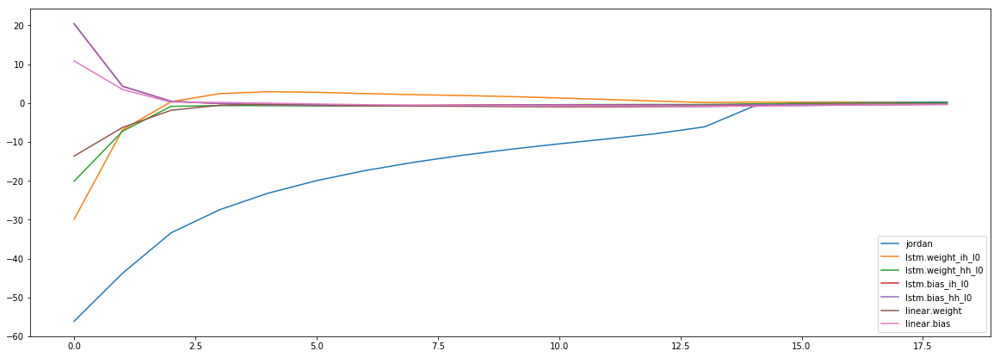

In [21]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

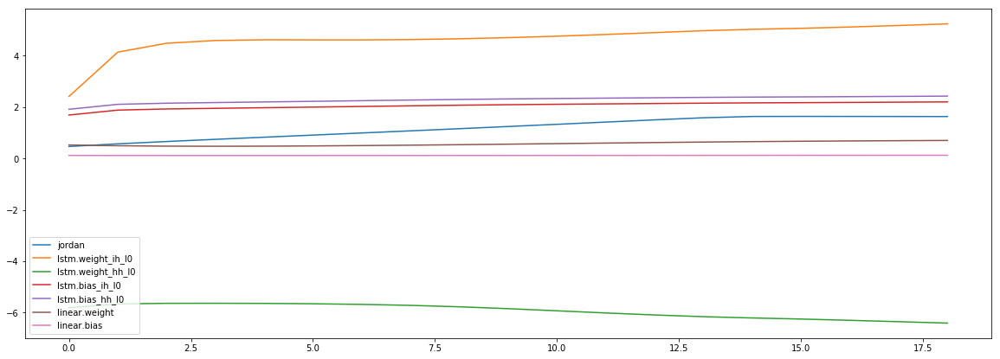

In [22]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

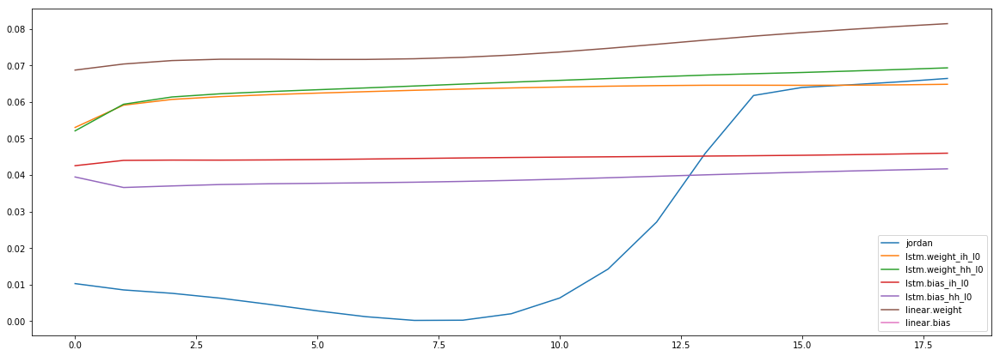

In [23]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

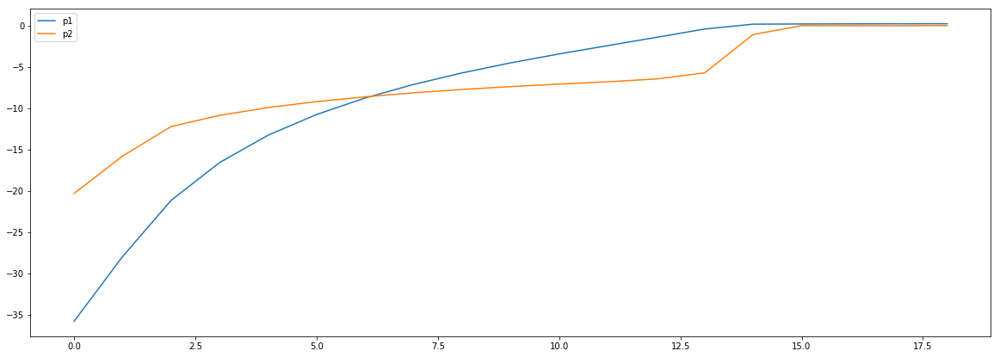

In [24]:
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

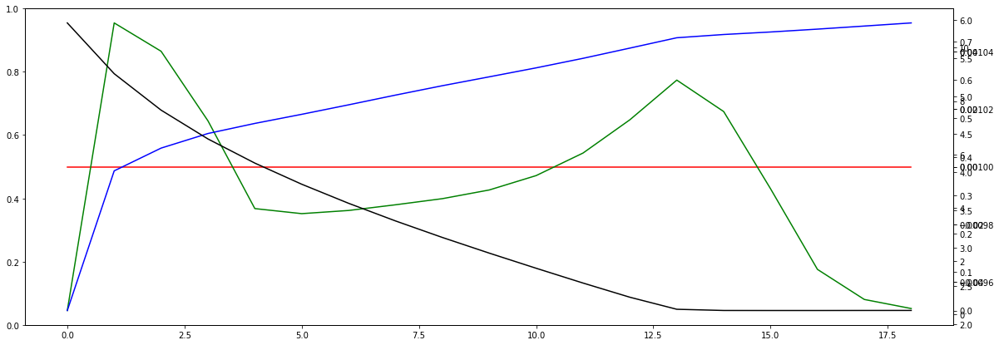

In [25]:
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

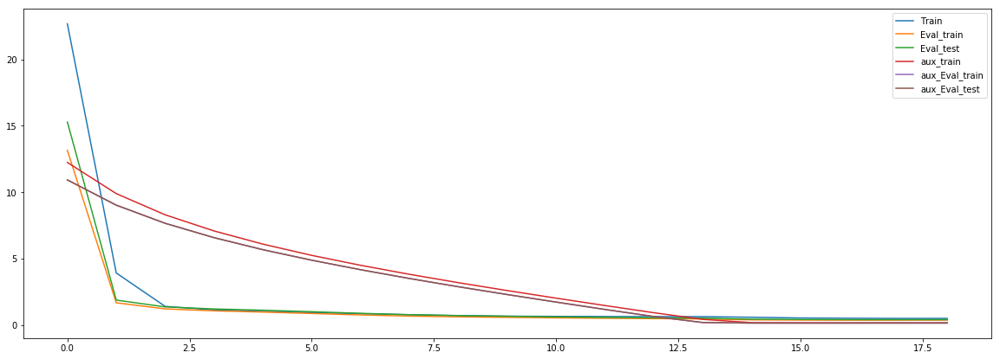

In [26]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

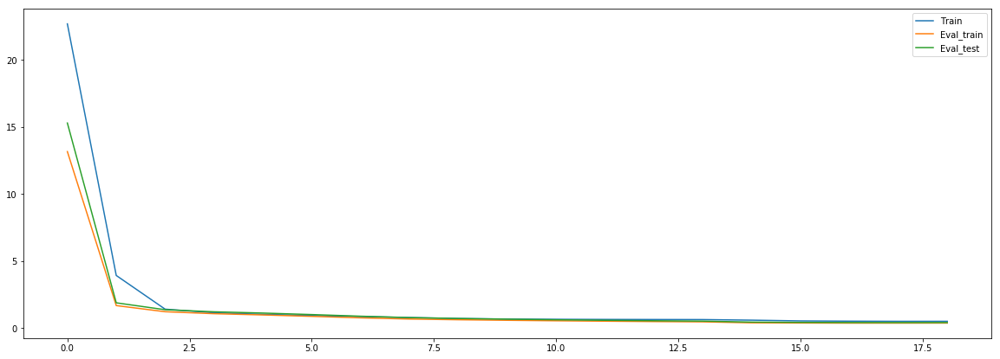

In [27]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

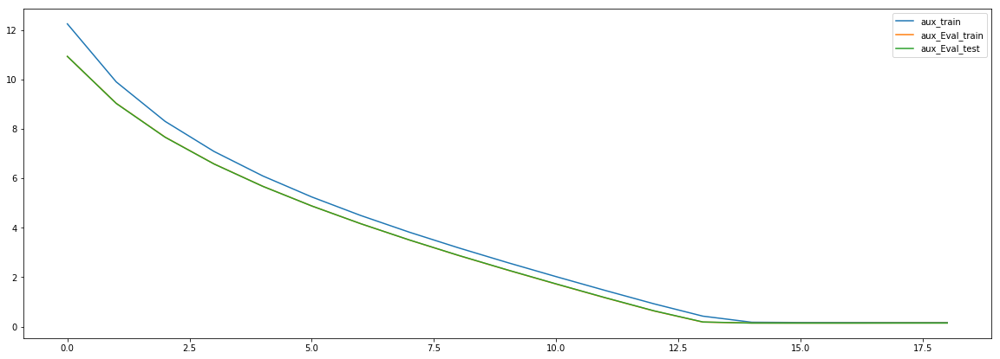

In [28]:
plot_shared_scale([
#     (hist['train']["epochs"]['main'][s:e],"Train" ),
#     (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
#     (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [29]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

jordan 	 torch.Size([1, 2]) 	 tensor(1.6312, grad_fn=<SumBackward0>)
lstm.weight_ih_l0 	 torch.Size([32, 3]) 	 tensor(5.3022, grad_fn=<SumBackward0>)
lstm.weight_hh_l0 	 torch.Size([32, 8]) 	 tensor(-6.4429, grad_fn=<SumBackward0>)
lstm.bias_ih_l0 	 torch.Size([32]) 	 tensor(2.2138, grad_fn=<SumBackward0>)
lstm.bias_hh_l0 	 torch.Size([32]) 	 tensor(2.4384, grad_fn=<SumBackward0>)
linear.weight 	 torch.Size([1, 8]) 	 tensor(0.7105, grad_fn=<SumBackward0>)
linear.bias 	 torch.Size([1]) 	 tensor(0.1265, grad_fn=<SumBackward0>)


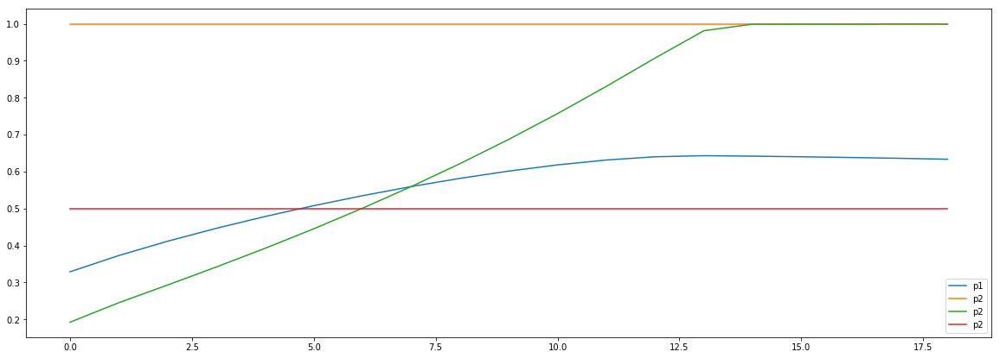

In [30]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
])

In [31]:
model.buffers

<bound method Module.buffers of LSTM_jordan(
  (lstm): LSTM(3, 8)
  (linear): Linear(in_features=8, out_features=1, bias=True)
)>

In [32]:
logging.info("Training process END")